In [31]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [27]:
import matplotlib
import matplotlib.pyplot as plt
import kaepora as kpora
import flux_calibration as fc
import pyphot
import numpy as np
from scipy.interpolate import splrep, splev
import scipy.optimize as opt

In [114]:
test_query = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN"
spec_array = kpora.grab(test_query, multi_epoch = True, make_corr = True, verbose=True, db_file = '../data/kaepora_v1.db')
# test_phot = spec_array[0].light_curves
# test_phot_csp = spec_array[0].csp_light_curves
# spec_array_dered = kpora.host_dereddening(spec_array, verbose=False, cutoff=2.)

4975 Total Spectra found
128 flagged spectra removed 4847 spectra left
109 spectra of peculiar Ias removed 4738 spectra left
3433 spectra of SNe that have host reddening corrections
Arrays cleaned
Name Filename Source SNR Phase MJD MJD_max z Host Morphology Minwave Maxwave
1989b sn1989b-19890221.flm bsnip 12.070823537 13.455370726 47578.0 47564.512 0.002425 12.0 3494.0 6932.0
1989b sn1989b-19890427-o1i1.flm bsnip 56.3399611556 78.2981270419 47643.0 47564.512 0.002425 12.0 3346.0 8978.0
1989b sn1989b-19890710-o.flm bsnip 14.0949846812 152.119111155 47717.0 47564.512 0.002425 12.0 3944.0 6160.0
1990n sn1990n-19900717-oi.flm bsnip 196.252213907 7.33808719397 48089.0 48081.637 0.003395 13.0 3960.0 9788.0
1990n sn1990n-19900731-oi.flm bsnip 246.978555483 21.4830649943 48103.193 48081.637 0.003395 13.0 3940.0 9816.0
1990n sn1990n-19900829-oi.flm bsnip 64.1857438142 50.3450784586 48132.153 48081.637 0.003395 13.0 3980.0 9766.0
1990n sn1990n-19900830-ir2.flm bsnip 47.2109537391 51.1892126231 4

2001ba sn2001ba-20010430-ui.flm bsnip 2.05486914488 -5.12550543583 52029.0 52034.277 0.029557 13.0 3220.0 10244.0
2001bf sn2001bf-20010516-ui-corrected.flm bsnip 95.5098756726 1.95962387038 52045.439 52043.449 0.015501 1.0 3302.0 10240.0
2001bf sn2001bf-20010727-ui-corrected.flm bsnip 17.3672489016 72.7946107389 52117.372 52043.449 0.015501 1.0 3302.0 10190.0
2001c sn2001C-20010123-ui.flm bsnip 65.1978329226 22.4800458187 51932.296 51909.57 0.010941 None 3318.0 10434.0
2001c sn2001c-20010201-ui.flm bsnip 69.8470508214 31.089845995 51941.0 51909.57 0.010941 None 3278.0 10434.0
2001cp sn2001cp-20010629-ui.flm bsnip 39.9997914207 0.917447344588 52089.422 52088.484 0.022402 13.0 3280.0 10122.0
2001cp sn2001cp-20010716-ui.flm bsnip 13.1850600283 17.5293084325 52106.406 52088.484 0.022402 13.0 3280.0 10122.0
2001cp sn2001cp-20010727-ui.flm bsnip 38.7091911259 28.1435286707 52117.258 52088.484 0.022402 13.0 3280.0 10122.0
2001da sn2001da-20010716-ui-corrected.flm bsnip 53.2851925682 2.2168807

2005be sn2005be-20050411.448-ui.flm bsnip 29.2861691787 14.1816425121 53471.44 53456.762 0.035 None 3252.0 9998.0
2005be sn2005be-20050417.403-ui.flm bsnip 16.7292637316 19.9333333333 53477.393 53456.762 0.035 None 3252.0 9998.0
2005bl sn2005bl-20050417.214-ui.flm bsnip 2.15415203816 -5.45182899439 53477.206 53482.789 0.02406 1.0 3470.0 9970.0
2005bl sn2005bl-20050511.401-br.flm bsnip 42.5193879337 18.1756928305 53501.402 53482.789 0.02406 1.0 3106.0 9080.0
2005bo sn2005bo-20050515.289-ui.flm bsnip 35.497653877 27.1694532773 53505.289 53477.742 0.013896 11.0 3358.0 10206.0
2005cf sn2005cf-20050601.385-ui.flm bsnip 2.63044367452 -10.8727511548 53522.385 53533.328 0.006461 8.0 3342.0 10432.0
2005cf sn2005cf-20050610.277-ui.flm bsnip 24.8848610863 -2.03783355739 53531.277 53533.328 0.006461 8.0 3340.0 10382.0
2005cf sn2005cf-20050611.205-ui.flm bsnip 115.438843933 -1.11579087516 53532.205 53533.328 0.006461 8.0 3340.0 10382.0
2005cf sn2005cf-20050701.214-ui.flm bsnip 100.653753984 18.7647

2007bm sn2007bm-20070614.216-ui.flm bsnip 53.2637123639 40.9109023853 54265.216 54224.051 0.006211 14.0 3356.0 10384.0
2007bz sn2007bz-20070426.419-ui.flm bsnip 40.7215753614 0.94932558736 54216.419 54215.449 0.021778 14.0 3322.0 10226.0
2007ca sn2007ca-20070426.305-ui.flm bsnip 37.6170479603 -10.2498259482 54216.305 54226.699 0.014066 14.0 3462.0 10304.0
2007ca sn2007ca-20070524.291-ui-corrected.flm bsnip 26.4777582482 17.3479832674 54244.291 54226.699 0.014066 14.0 3534.0 10068.0
2007ca sn2007ca-20070609.277-ui-corrected.flm bsnip 31.7273318586 33.1122431873 54260.277 54226.699 0.014066 14.0 3322.0 10304.0
2007cg sn2007cg-20070524.234-ui.flm bsnip 15.6642075998 20.0339528995 54244.234 54223.535 0.033196 14.0 3518.0 10098.0
2007ci sn2007ci-20070519.316-ui.flm bsnip 0.87633575428 -6.74572695325 54239.316 54246.184 0.018126 1.0 3420.0 9924.0
2007ci sn2007ci-20070524.264-ui-corrected.flm bsnip 65.8841355235 -1.88581766893 54244.264 54246.184 0.018126 1.0 3314.0 10262.0
2007ci sn2007ci-20

1996x sn1996X-19960419.30-fast.flm cfa 144.61762706 1.3843854431 50192.3 50190.906 0.006945 2.0 3728.0 7452.0
1996x sn1996X-19960420.31-fast.flm cfa 129.573209954 2.38741937245 50193.31 50190.906 0.006945 2.0 3728.0 7452.0
1996x sn1996X-19960425.29-fast.flm cfa 72.514533029 7.33307181623 50198.29 50190.906 0.006945 2.0 3728.0 7450.0
1996x sn1996X-19960426.28-fast.flm cfa 97.1371753646 8.31624368759 50199.28 50190.906 0.006945 2.0 3728.0 7450.0
1996x sn1996X-19960508.26-fast.flm cfa 105.533910377 20.2136164339 50211.26 50190.906 0.006945 2.0 3728.0 7450.0
1996x sn1996X-19960510.25-fast.flm cfa 93.530811258 22.1898912056 50213.25 50190.906 0.006945 2.0 3728.0 7452.0
1996x sn1996X-19960516.24-fast.flm cfa 104.376097127 28.1385775787 50219.24 50190.906 0.006945 2.0 3728.0 7456.0
1996x sn1996X-19960521.22-fast.flm cfa 73.6578852781 33.0842300225 50224.22 50190.906 0.006945 2.0 3728.0 7456.0
1996x sn1996X-19960606.19-fast.flm cfa 47.9083934331 48.9440833412 50240.19 50190.906 0.006945 2.0 37

1998d sn1998D-19980224.49-fast.flm cfa 27.0091679091 None None 50838.66 0.012305 10.0 3728.0 7398.0
1998d sn1998D-19980304.42-fast.flm cfa 20.1059095154 None None 50838.66 0.012305 10.0 3728.0 7398.0
1998d sn1998D-19980321.50-fast.flm cfa 12.6602762562 None None 50838.66 0.012305 10.0 3728.0 7376.0
1998de sn1998de-19980725.46-fast.flm cfa 11.0423174543 -7.29484658195 51019.46 51026.875 0.016471 8.0 3712.0 6826.0
1998de sn1998de-19980726.47-fast.flm cfa 42.2220302713 -6.3012127252 51020.47 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980727.45-fast.flm cfa 31.8277271964 -5.33709274539 51021.45 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980729.50-fast.flm cfa 17.5955934411 -3.32031115497 51023.5 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980730.46-fast.flm cfa 26.1212642122 -2.37586709311 51024.46 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980801.41-fast.flm cfa 29.4215989591 -0.457465092459 51026.41 51026.875 0.016471 8.0 3712.0 7368.0
1998d

1999dq sn1999dq-19990911.46-fast.flm cfa 168.120518193 -2.63918834853 51432.46 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990912.51-fast.flm cfa 155.937846833 -1.60401921668 51433.51 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990915.45-fast.flm cfa 155.830534815 1.29445435249 51436.45 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990916.45-fast.flm cfa 162.823049545 2.28032971615 51437.45 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990917.46-fast.flm cfa 152.864669863 3.27606383345 51438.46 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990918.45-fast.flm cfa 168.630322859 4.25208044348 51439.45 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990920.46-fast.flm cfa 156.357549824 6.23368992445 51441.46 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19991002.47-fast.flm cfa 112.80033482 18.0740530421 51453.47 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19991003.45-fast.flm cfa 110.355599015 19.0402108985 51

2001en sn2001en-20011022.29-fast.flm cfa 56.8261924482 12.7329158919 52204.29 52191.355 0.015871 12.0 3714.0 7372.0
2001en sn2001en-20011024.25-fast.flm cfa 57.6499949829 14.6622947205 52206.25 52191.355 0.015871 12.0 3714.0 7372.0
2001en sn2001en-20011117.19-fast.flm cfa 36.2763711063 38.2282789842 52230.19 52191.355 0.015871 12.0 3714.0 7372.0
2001ep sn2001ep-20011010.49-fast.flm cfa 60.2948647974 -7.16591865399 52192.49 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011014.45-fast.flm cfa 98.7860311866 -3.25723575182 52196.45 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011015.45-fast.flm cfa 106.669649074 -2.2701946149 52197.45 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011016.45-fast.flm cfa 95.2957190283 -1.28315347799 52198.45 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011017.42-fast.flm cfa 108.099963513 -0.325723575183 52199.42 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011018.43-fast.flm cfa 106.658020508 0.671187973101 52

2002bz sn2002bz-20020420.42-fast.flm cfa 22.0557358977 None None 52366.633 0.037152 19.0 3640.0 7200.0
2002bz sn2002bz-20020505.35-fast.flm cfa 18.862995635 None None 52366.633 0.037152 19.0 3640.0 7142.0
2002bz sn2002bz-20020513.20-fast.flm cfa 11.116335895 None None 52366.633 0.037152 19.0 3640.0 7220.0
2002cd sn2002cd-20020410.49-fast.flm cfa 31.447861858 -8.55451212657 52374.49 52383.133 0.010344 13.0 3734.0 7412.0
2002cd sn2002cd-20020411.48-fast.flm cfa 37.8478377712 -7.57464784271 52375.48 52383.133 0.010344 13.0 3734.0 7392.0
2002cd sn2002cd-20020412.49-fast.flm cfa 33.2332179459 -6.57498832081 52376.49 52383.133 0.010344 13.0 3734.0 7392.0
2002cd sn2002cd-20020413.48-fast.flm cfa 40.1743234464 -5.59512403696 52377.48 52383.133 0.010344 13.0 3734.0 7392.0
2002cd sn2002cd-20020414.49-fast.flm cfa 44.0401401106 -4.59546451506 52378.49 52383.133 0.010344 13.0 3734.0 7392.0
2002cd sn2002cd-20020415.49-fast.flm cfa 37.4431437688 -3.60570261218 52379.49 52383.133 0.010344 13.0 3734.0

2003cq sn2003cq-20030403.28-fast.flm cfa 12.3321466654 -6.34869633972 52732.28 52738.84 0.033283 13.0 3654.0 7246.0
2003cq sn2003cq-20030407.36-fast.flm cfa 18.2650399847 -2.40011690892 52736.36 52738.84 0.033283 13.0 3654.0 7246.0
2003cq sn2003cq-20030409.25-fast.flm cfa 10.9214514657 -0.570995554941 52738.25 52738.84 0.033283 13.0 3654.0 7246.0
2003cq sn2003cq-20030410.22-fast.flm cfa 16.079379722 0.367759848952 52739.22 52738.84 0.033283 13.0 3654.0 7246.0
2003cq sn2003cq-20030411.25-fast.flm cfa 11.0424189398 1.36458259741 52740.25 52738.84 0.033283 13.0 3654.0 7246.0
2003cq sn2003cq-20030427.22-fast.flm cfa 11.7070534048 16.820174144 52756.22 52738.84 0.033283 13.0 3654.0 7246.0
2003cq sn2003cq-20030509.15-fast.flm cfa 5.03282168476 28.3658978228 52768.15 52738.84 0.033283 13.0 3654.0 7246.0
2003d sn2003D-20030112.44-fast.flm cfa 6.73656200693 None None 52640.527 0.022109 1.0 3692.0 7326.0
2003d sn2003D-20030129.32-mmt.flm cfa 42.8157869503 None None 52640.527 0.022109 1.0 3184.0 

2004ef sn2004ef-20040917.27-fast.flm cfa 43.2965538973 1.64890856802 53265.27 53263.57 0.030985 12.0 3428.0 7128.0
2004ef sn2004ef-20040918.28-fast.flm cfa 24.2687978853 2.62855424667 53266.28 53263.57 0.030985 12.0 3424.0 7136.0
2004ef sn2004ef-20040922.22-fast.flm cfa 41.5270576196 6.45014233961 53270.22 53263.57 0.030985 12.0 3434.0 7134.0
2004ef sn2004ef-20041006.17-fast.flm cfa 16.6735039578 19.9808920595 53284.17 53263.57 0.030985 12.0 3428.0 7138.0
2004ef sn2004ef-20041012.14-fast.flm cfa 19.4240473355 25.7714709719 53290.14 53263.57 0.030985 12.0 3434.0 7138.0
2004ef sn2004ef-20041020.15-fast.flm cfa 12.3096907786 33.540740166 53298.15 53263.57 0.030985 12.0 3434.0 7138.0
2004fu sn2004fu-20041110.17-fast.flm cfa 75.7800853666 -6.4188820959 53319.17 53325.648 0.00921 19.0 3502.0 7292.0
2004fu sn2004fu-20041111.17-fast.flm cfa 77.5331298824 -5.4280080459 53320.17 53325.648 0.00921 19.0 3502.0 7292.0
2004fu sn2004fu-20041113.16-fast.flm cfa 51.7858223506 -3.4561686864 53322.16 533

2006bz sn2006bz-20060508.23-fast.flm cfa 18.4004128556 15.0062359788 53863.23 53847.805 0.027906 None 3442.0 7152.0
2006cc sn2006cc-20060508.34-fast.flm cfa 26.4695461605 -9.48060538736 53863.34 53873.129 0.032529 19.0 3426.0 7120.0
2006cf sn2006cf-20060519.25-fast.flm cfa 49.78148085 1.62353871914 53874.25 53872.559 0.041552 15.0 3398.0 7060.0
2006cf sn2006cf-20060520.16-fast.flm cfa 25.3432189273 2.49723489562 53875.16 53872.559 0.041552 15.0 3398.0 7060.0
2006cf sn2006cf-20060521.27-fast.flm cfa 43.4310364215 3.56295220978 53876.27 53872.559 0.041552 15.0 3398.0 7060.0
2006cf sn2006cf-20060522.26-fast.flm cfa 35.450273771 4.51345684133 53877.26 53872.559 0.041552 15.0 3396.0 7058.0
2006cf sn2006cf-20060524.21-fast.flm cfa 55.1060660742 6.38566293377 53879.21 53872.559 0.041552 15.0 3390.0 7052.0
2006cf sn2006cf-20060604.22-fast.flm cfa 20.9507395727 16.9564265634 53890.22 53872.559 0.041552 15.0 3398.0 7058.0
2006cf sn2006cf-20060618.19-fast.flm cfa 30.7227803694 30.3691030309 53904

2006x sn2006X-20060228.34-fast.flm cfa 197.482673862 8.34328120647 53794.34 53785.953 0.00524 13.0 3518.0 7316.0
2006x sn2006X-20060302.47-fast.flm cfa 162.908823211 10.4621781863 53796.47 53785.953 0.00524 13.0 3520.0 7318.0
2006x sn2006X-20060303.41-fast.flm cfa 115.758595662 11.3972782619 53797.41 53785.953 0.00524 13.0 3572.0 7320.0
2006x sn2006X-20060304.51-fast.flm cfa 102.174760251 12.4915443078 53798.51 53785.953 0.00524 13.0 3522.0 7320.0
2006x sn2006X-20060305.46-fast.flm cfa 163.013101655 13.4365922566 53799.46 53785.953 0.00524 13.0 3522.0 7320.0
2006x sn2006X-20060306.42-fast.flm cfa 172.032720351 14.3915880785 53800.42 53785.953 0.00524 13.0 3524.0 7322.0
2006x sn2006X-20060309.30-fast.flm cfa 109.518744406 17.2565755442 53803.3 53785.953 0.00524 13.0 3518.0 7314.0
2006x sn2006X-20060321.30-fast.flm cfa 83.0239430716 29.1940233178 53815.3 53785.953 0.00524 13.0 3518.0 7316.0
2006x sn2006X-20060323.35-fast.flm cfa 90.0289395045 31.2333373125 53817.35 53785.953 0.00524 13.0

2007jg sn2007jg-20071006.44-fast.flm cfa 19.1725798631 12.9366492757 54379.44 54366.023 0.037131 None 3404.0 7100.0
2007le sn2007le-20071015.28-fast.flm cfa 122.193518879 -9.56570887068 54388.28 54397.91 0.006721 14.0 3504.0 7316.0
2007le sn2007le-20071017.25-fast.flm cfa 133.138170181 -7.60886084626 54390.25 54397.91 0.006721 14.0 3504.0 7316.0
2007le sn2007le-20071018.23-fast.flm cfa 143.720558394 -6.63540345339 54391.23 54397.91 0.006721 14.0 3504.0 7316.0
2007le sn2007le-20071019.21-fast.flm cfa 161.212550483 -5.66194606053 54392.21 54397.91 0.006721 14.0 3504.0 7316.0
2007le sn2007le-20071031.17-fast.flm cfa 197.469722286 6.21820742787 54404.17 54397.91 0.006721 14.0 3504.0 7316.0
2007le sn2007le-20071102.13-fast.flm cfa 230.578246916 8.1651222136 54406.13 54397.91 0.006721 14.0 3502.0 7316.0
2007le sn2007le-20071103.17-fast.flm cfa 205.186686558 9.19817903868 54407.17 54397.91 0.006721 14.0 3506.0 7316.0
2007le sn2007le-20071104.31-fast.flm cfa 219.948764372 10.3305682508 54408.3

2005ku SN05ku_051224_b01_DUP_WF.dat csp 29.4215583913 28.1996367077 53728.04 53698.559 0.045439 None 3688.0 8782.0
2005lu SN05lu_051218_b01_NTT_EM.dat csp 11.9519202569 13.4834095438 53722.13 53708.215 0.032009 19.0 3154.0 5084.0
2005lu SN05lu_051218_g01_NTT_EM.dat csp 20.8590719122 13.5027892198 53722.15 53708.215 0.032009 19.0 3928.0 9832.0
2005lu SN05lu_051218_r01_NTT_EM.dat csp 22.1479877811 13.5221688957 53722.17 53708.215 0.032009 19.0 5674.0 9832.0
2005lu SN05lu_051220_b01_DUP_WF.dat csp 37.7484412135 15.4116873013 53724.12 53708.215 0.032009 19.0 3736.0 8898.0
2005lu SN05lu_051221_b01_DUP_WF.dat csp 27.7926730505 16.3516015847 53725.09 53708.215 0.032009 19.0 3736.0 8898.0
2005lu SN05lu_051222_b01_DUP_WF.dat csp 52.8391222237 17.3399650583 53726.11 53708.215 0.032009 19.0 3736.0 8898.0
2005lu SN05lu_051223_b01_DUP_WF.dat csp 39.8438683328 18.3186386942 53727.12 53708.215 0.032009 19.0 3736.0 8898.0
2005lu SN05lu_051224_b01_DUP_WF.dat csp 38.8013214073 19.2876224918 53728.12 537

2006x SN06X_060402_b01_DUP_WF.dat csp 34.963122704 41.0419402331 53827.21 53785.953 0.00524 13.0 3834.0 9136.0
2006x SN06X_060416_b01_BAA_IM.dat csp 83.0287973692 54.9192232702 53841.16 53785.953 0.00524 13.0 3876.0 9590.0
2006x SN06X_060423_b01_DUP_WF.dat csp 15.2954466129 61.8628387252 53848.14 53785.953 0.00524 13.0 3834.0 9136.0
2006x SN06X_060425_b01_DUP_WF.dat csp 41.3066144676 63.9021527197 53850.19 53785.953 0.00524 13.0 3834.0 9136.0
2007af SN07af_070304_g01_NTT_EM.dat csp 156.32549409 -10.2987277517 54163.34 54173.695 0.005464 15.0 4032.0 10094.0
2007af SN07af_070304_r01_NTT_EM.dat csp 147.223962245 -10.2887820945 54163.35 54173.695 0.005464 15.0 5822.0 10094.0
2007af SN07af_070314_b01_DUP_BC.dat csp 157.252541826 -0.392853448941 54173.3 54173.695 0.005464 15.0 3464.0 9542.0
2007af SN07af_070314_r01_DUP_BC.dat csp 109.9297304 -0.38290779177 54173.31 54173.695 0.005464 15.0 4988.0 9542.0
2007af SN07af_070319_b01_DUP_BC.dat csp 158.960385383 4.53024673186 54178.25 54173.695 0.0

2008fp SN08fp_090224_b01_DUP_WF.dat csp 19.7129271057 155.399815445 54886.12 54729.84 0.005664 8.0 3852.0 9184.0
2008gp SN08gp_081102_b01_BAA_IM.dat csp 102.200338602 -5.81374532739 54772.23 54778.238 0.033413 10.0 3948.0 6160.0
2008gp SN08gp_081102_r01_BAA_IM.dat csp 97.9779668691 -5.81374532739 54772.23 54778.238 0.033413 10.0 6396.0 10316.0
2008gp SN08gp_081124_b01_DUP_WF.dat csp 46.8714901676 15.4749359646 54794.23 54778.238 0.033413 10.0 3730.0 8886.0
2008gp SN08gp_081222_b01_DUP_WF.dat csp 22.0853171962 42.5115612054 54822.17 54778.238 0.033413 10.0 3730.0 8886.0
2008hv SN08hv_081210_b01_NTT_EF.dat csp 142.070323644 -6.2713014382 54810.31 54816.66 0.012549 8.0 3312.0 5878.0
2008hv SN08hv_081210_r01_NTT_EF.dat csp 147.539556287 -6.26142537316 54810.32 54816.66 0.012549 8.0 5228.0 9044.0
2008hv SN08hv_081215_b01_CLA_LD.dat csp 136.036355162 -1.29376454859 54815.35 54816.66 0.012549 8.0 3628.0 9262.0
2008hv SN08hv_081218_b01_CLA_LD.dat csp 75.6280841314 1.649302898 54818.33 54816.66

2003du 2003du_20030513_3300_7200_00.dat other 496.539503138 6.52037393281 52772.0 52765.438 0.006384 17.0 3332.0 7104.0
2003du 2003du_20030514_3303_7201_00.dat other 295.225586756 7.51403042973 52773.0 52765.438 0.006384 17.0 3336.0 7104.0
2003du 2003du_20030515_3252_7200_00.dat other 439.546874397 8.50768692666 52774.0 52765.438 0.006384 17.0 3284.0 7104.0
2003du 2003du_20030516_3258_9799_00.dat other 241.477376488 9.50134342358 52775.0 52765.438 0.006384 17.0 3292.0 9686.0
2003du 2003du_20030519_3477_9734_00.dat other 107.881773324 12.4823129144 52778.0 52765.438 0.006384 17.0 3508.0 9622.0
2003du 2003du_20030521_3804_6132_00.dat other 334.320288672 14.4696259082 52780.0 52765.438 0.006384 17.0 3834.0 6042.0
2003du 2003du_20030523_3498_10103_00.dat other 217.589817358 16.456938902 52782.0 52765.438 0.006384 17.0 3530.0 9988.0
2003du 2003du_20030524_4260_6595_00.dat other 34.7695846834 17.450595399 52783.0 52765.438 0.006384 17.0 4286.0 6502.0
2003du 2003du_20030525_3498_7775_00.dat o

2011by sn2011by-hst+lick.flm foley_hst 247.061987065 0.1 None None 0.002843 13.0 1654.0 10116.0
2011fe sn2011fe-visit1-hst.flm foley_hst 210.958503451 -13.1 None 55777.301 0.000804 15.0 1652.0 10184.0
2011fe sn2011fe-visit10-hst.flm foley_hst 107.499528135 40.8 None 55777.301 0.000804 15.0 1652.0 10184.0
2011fe sn2011fe-visit2-hst.flm foley_hst 307.489666596 -10.1 None 55777.301 0.000804 15.0 1652.0 10184.0
2011fe sn2011fe-visit3-hst.flm foley_hst 291.401894483 -6.9 None 55777.301 0.000804 15.0 1722.0 10184.0
2011fe sn2011fe-visit4-hst.flm foley_hst 292.903077167 -2.9 None 55777.301 0.000804 15.0 1722.0 10184.0
2011fe sn2011fe-visit5-hst.flm foley_hst 307.353246228 0.1 None 55777.301 0.000804 15.0 1722.0 10184.0
2011fe sn2011fe-visit6-hst.flm foley_hst 191.725774648 3.4 None 55777.301 0.000804 15.0 1722.0 10184.0
2011fe sn2011fe-visit7-hst.flm foley_hst 202.871500323 9.3 None 55777.301 0.000804 15.0 1652.0 10184.0
2011fe sn2011fe-visit8-hst.flm foley_hst 226.977469317 20.9 None 55777.3

In [20]:
# fc.plot_light_curves(spec_array[3].light_curves, fit=True, filt_list = ['B'])
# problems: 1994ae, 1994d, different mags at same mjd

In [115]:
mjds = {}
lcs = {}
for i, spec in enumerate(spec_array):
    if spec.name not in mjds:
        mjds[spec.name] = []
        mjds[spec.name].append(spec.mjd)
        lcs[spec.name] = spec.homog_light_curves
    else:
        mjds[spec.name].append(spec.mjd)

No light curve info!
No light curve info!


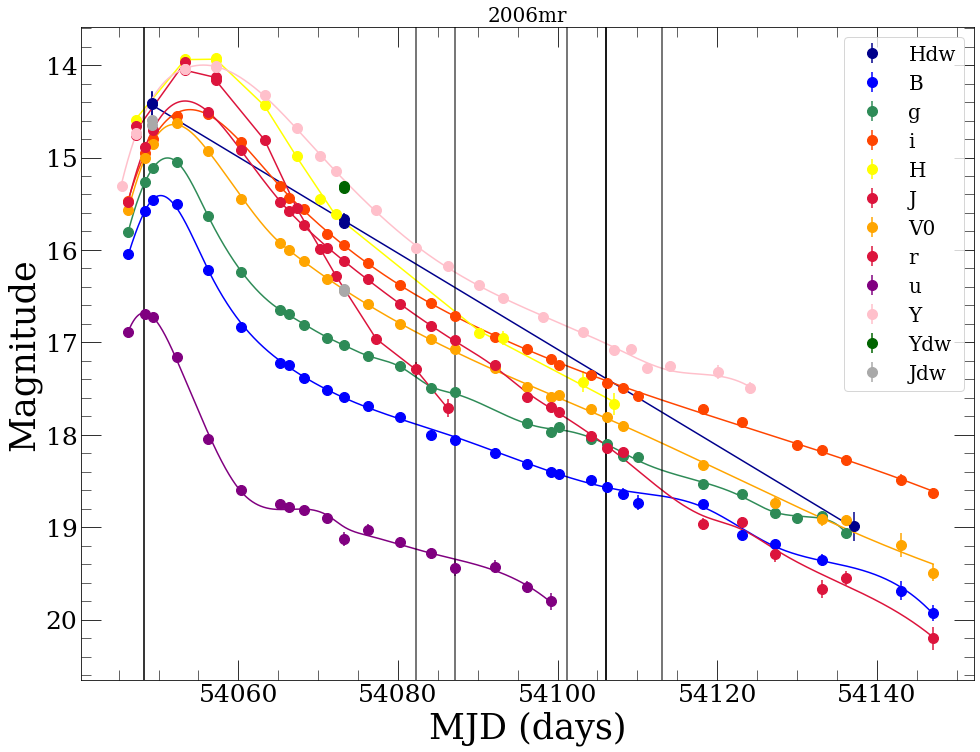

No light curve info!


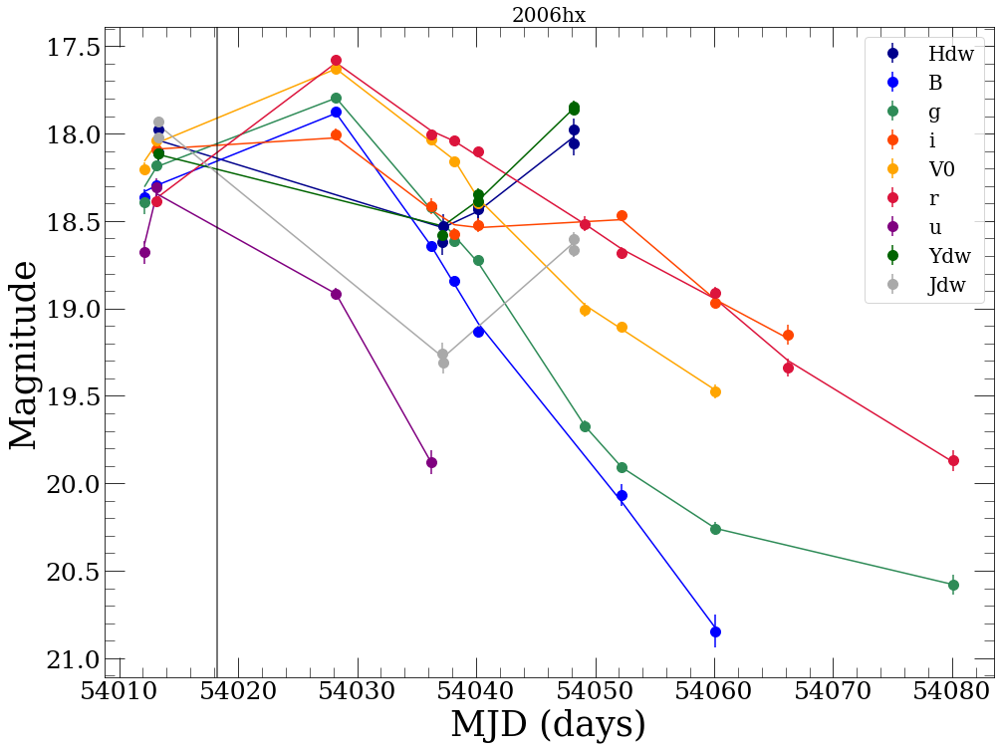

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


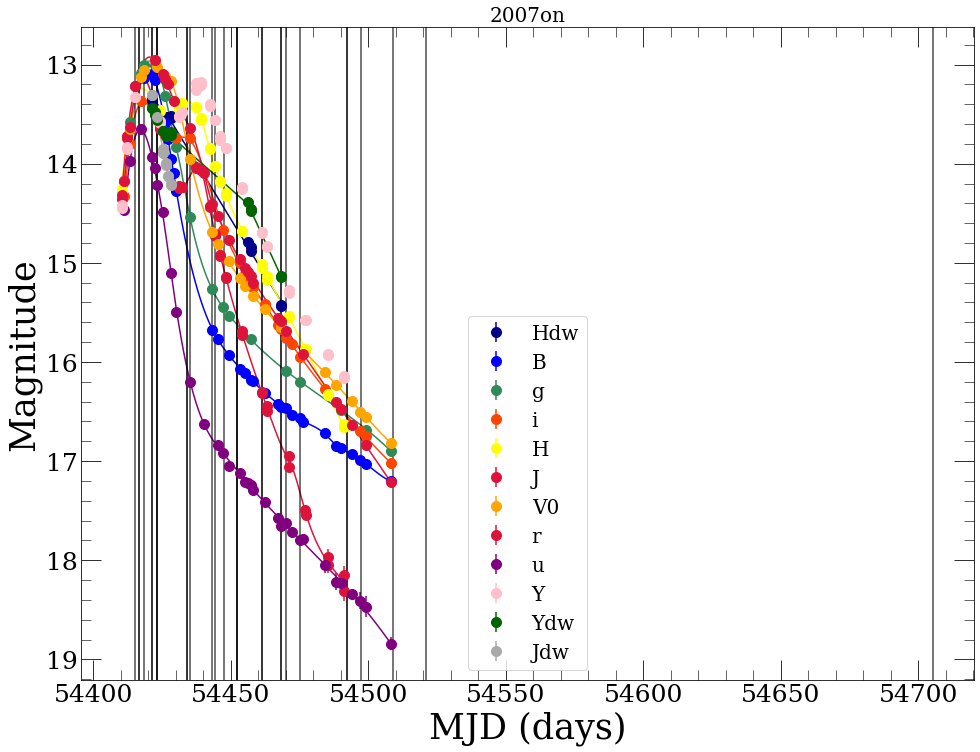

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


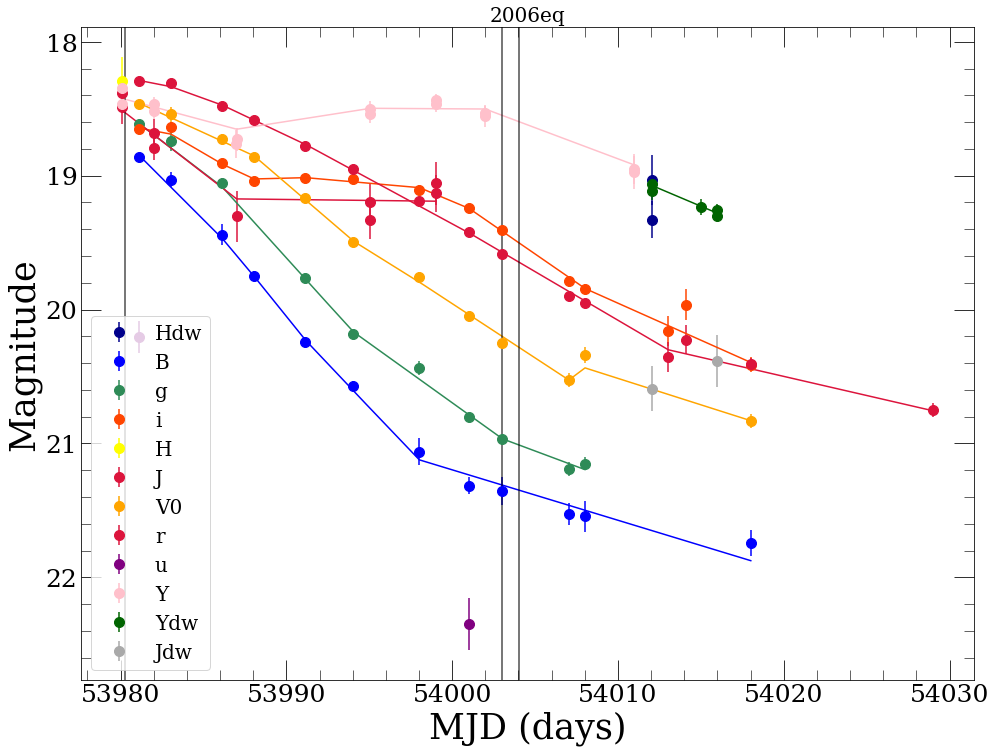

No light curve info!
No light curve info!
No light curve info!


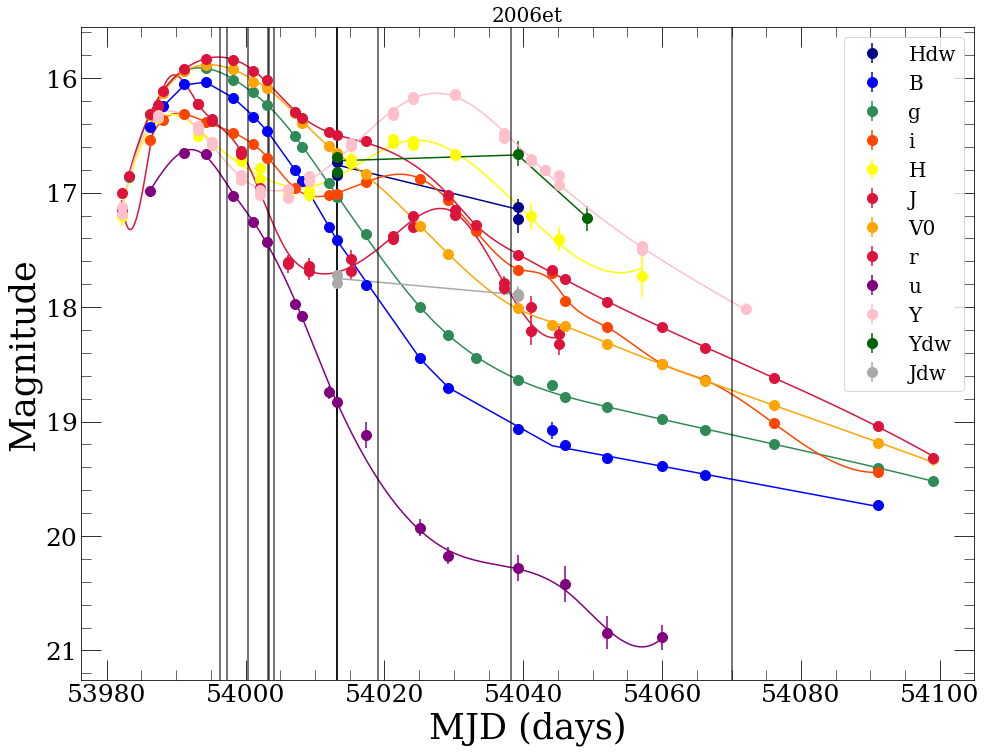

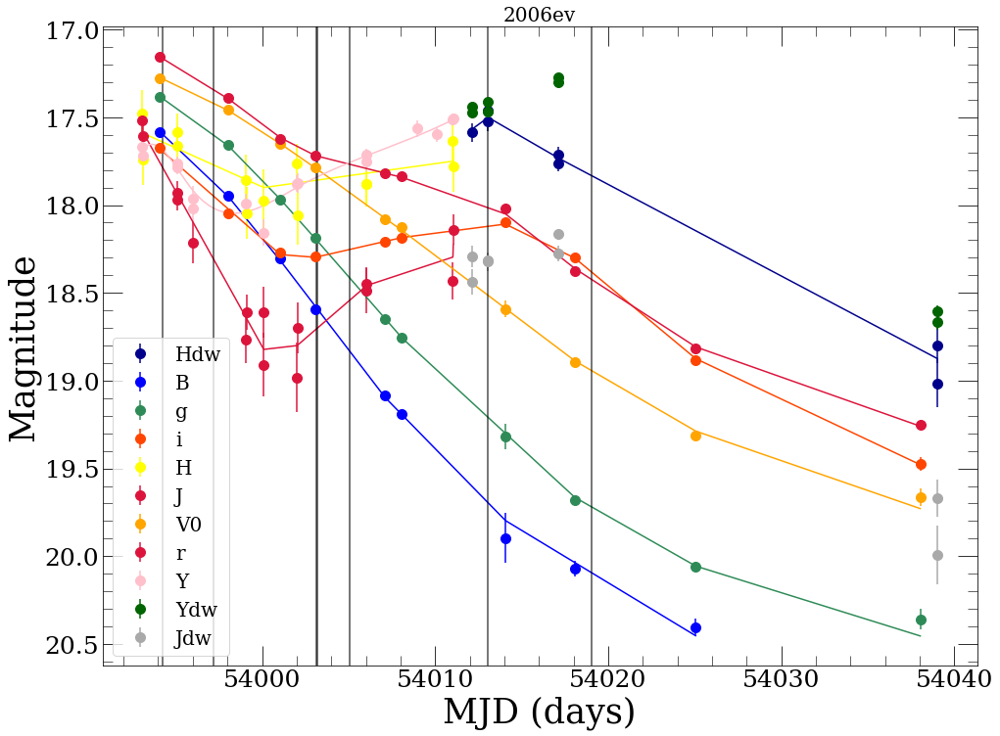

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


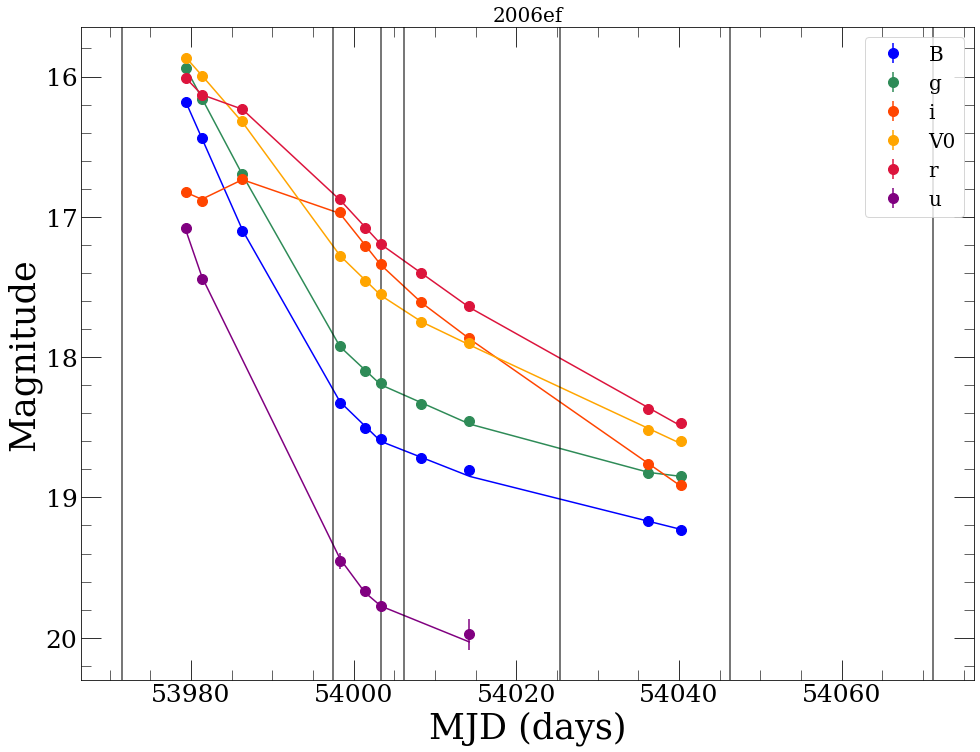

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


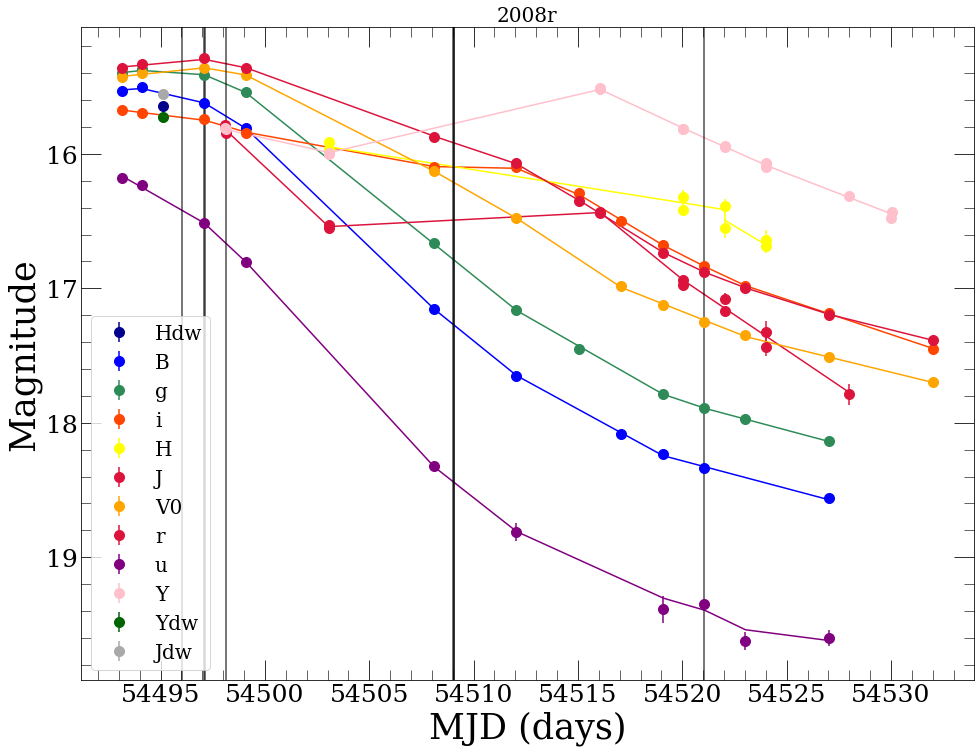

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


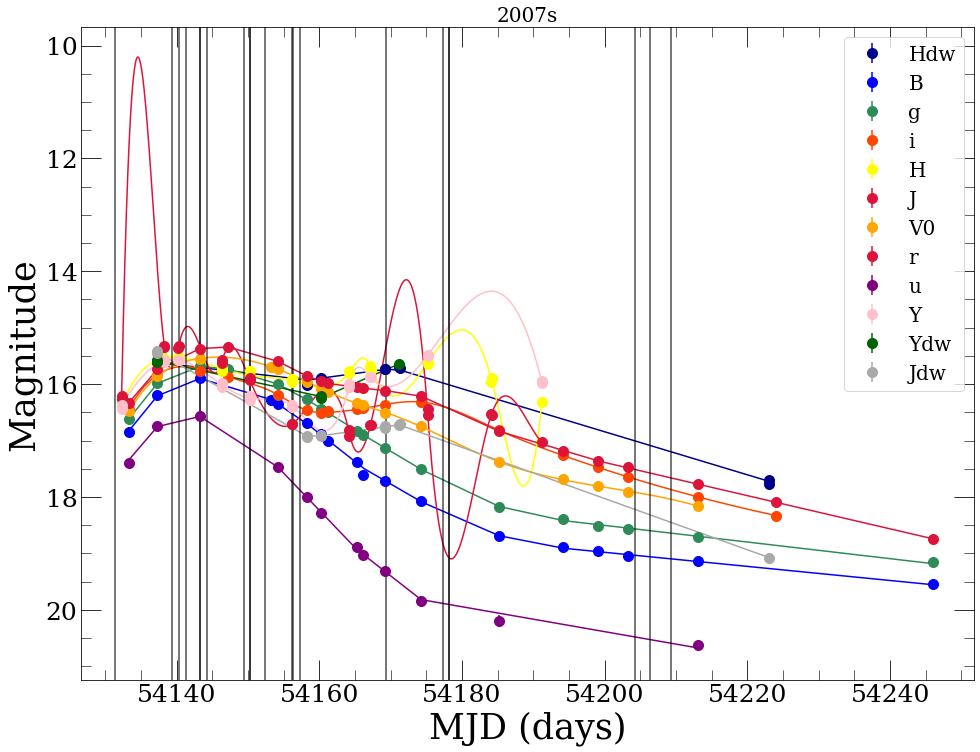

No light curve info!


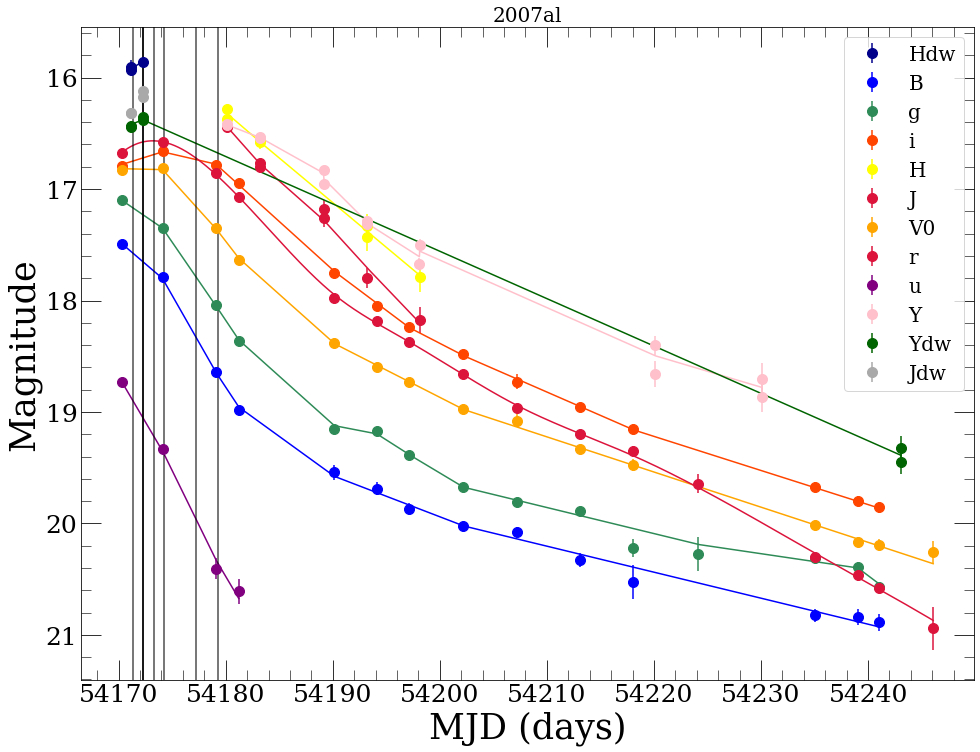

No light curve info!
No light curve info!


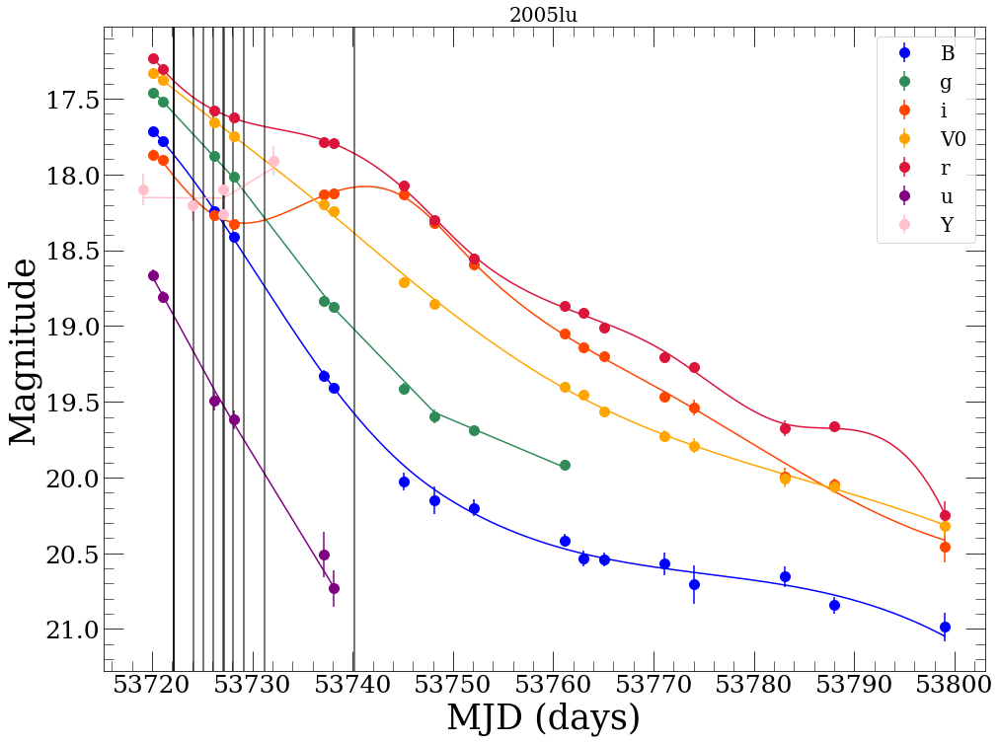

No light curve info!
No light curve info!
No light curve info!
No light curve info!


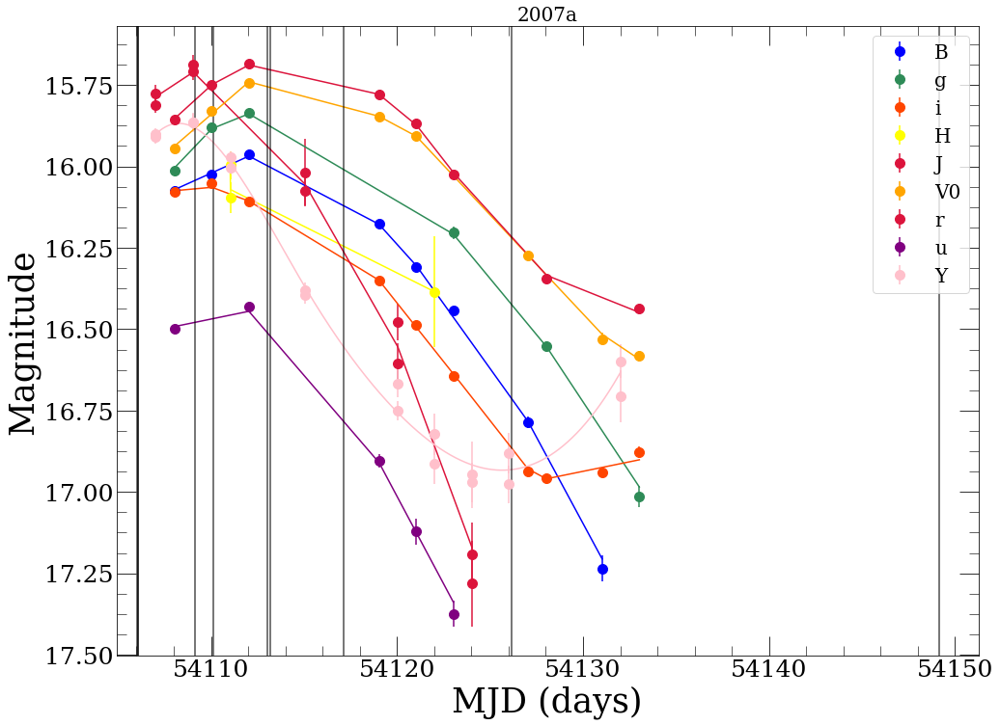

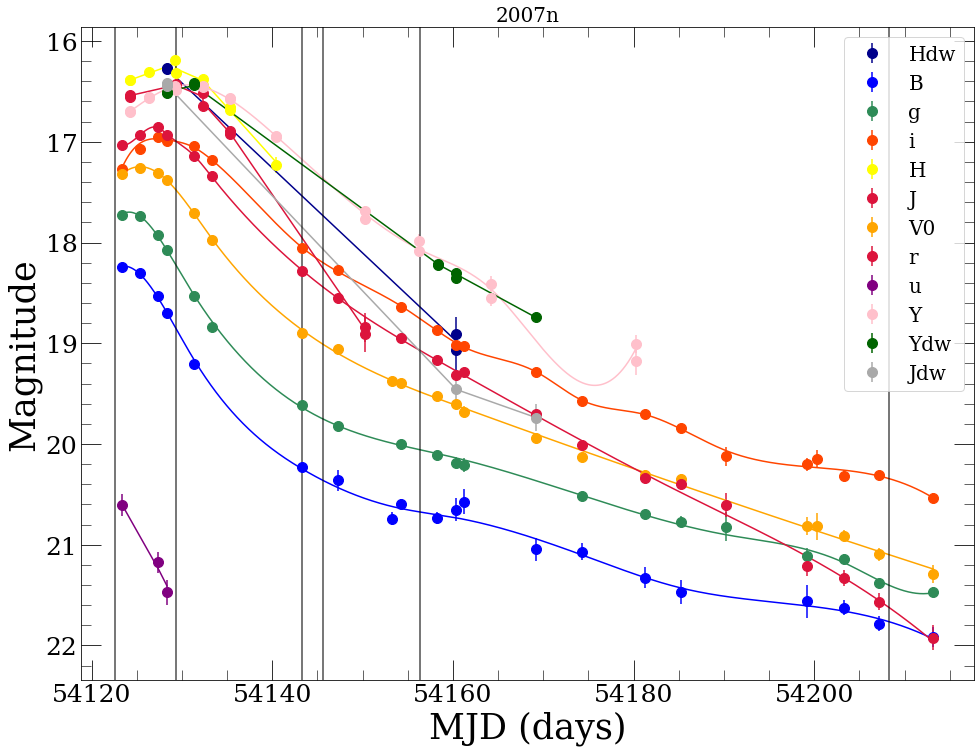

No light curve info!
No light curve info!
No light curve info!


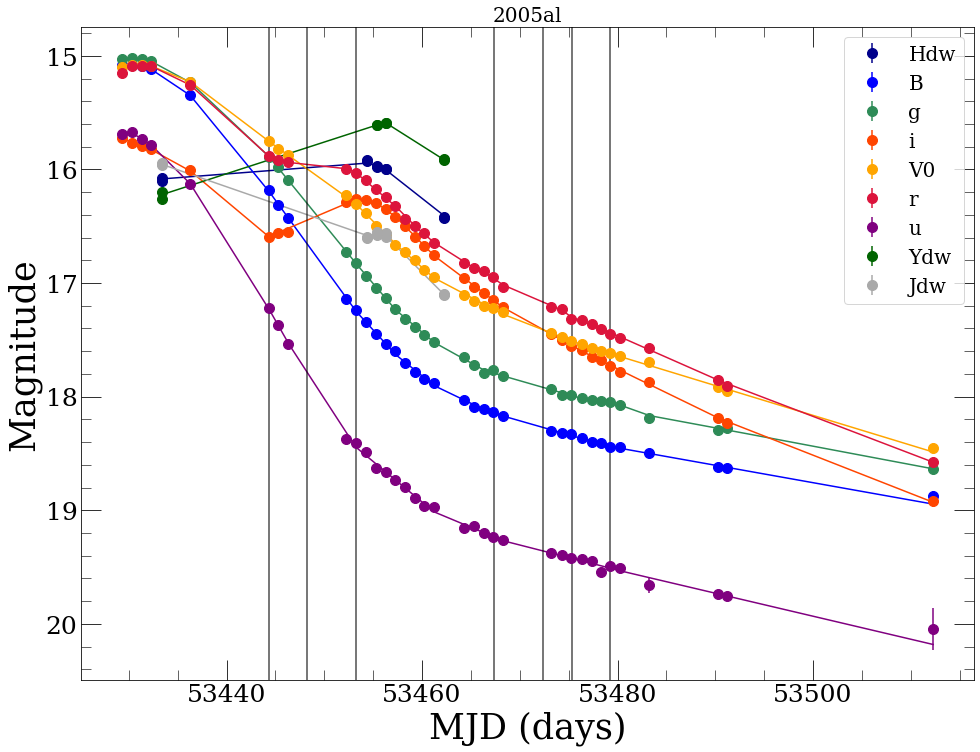

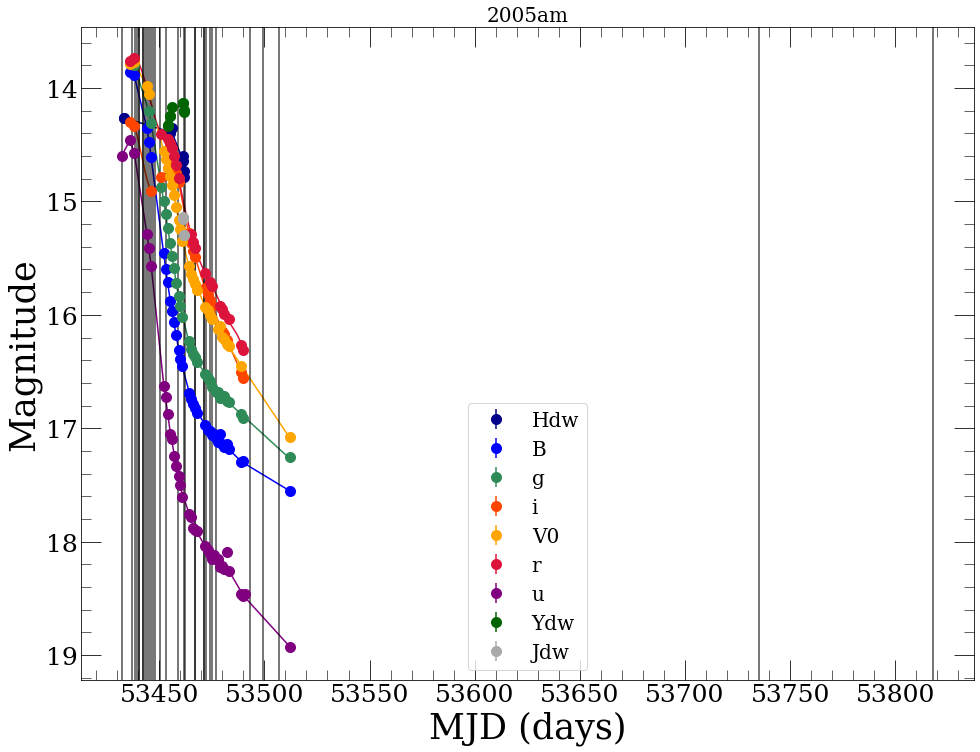

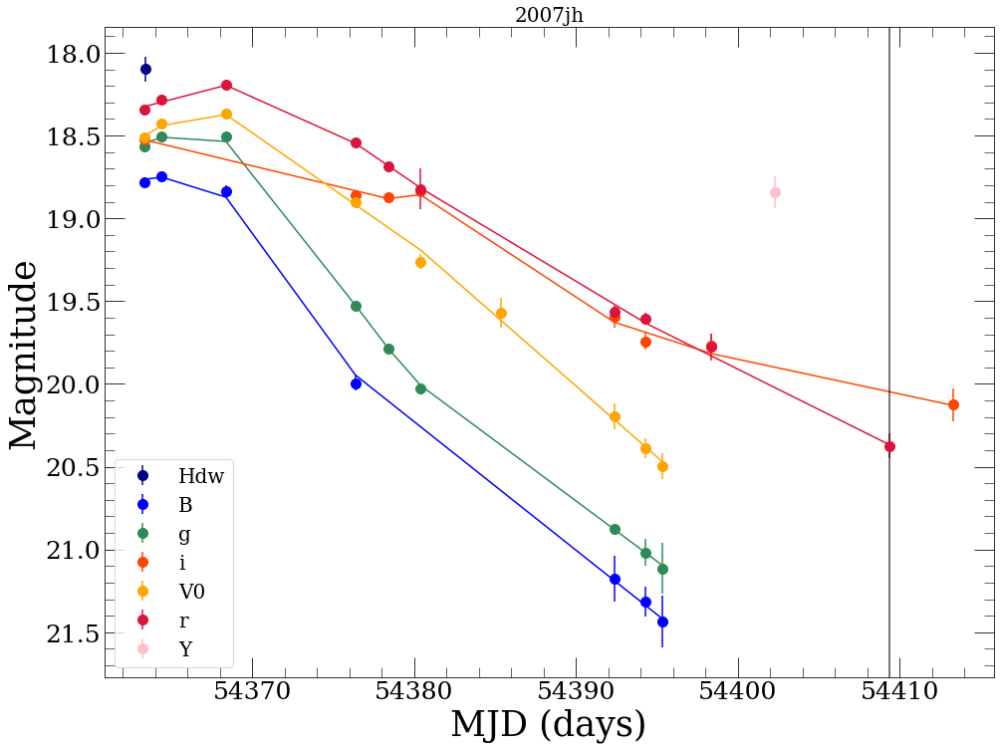

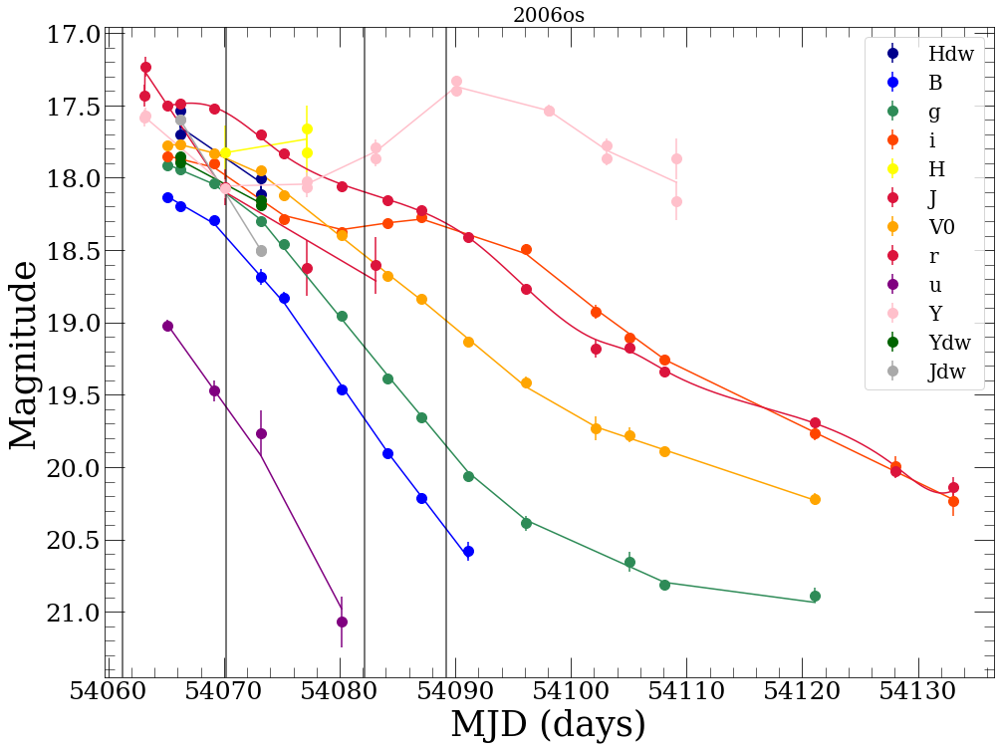

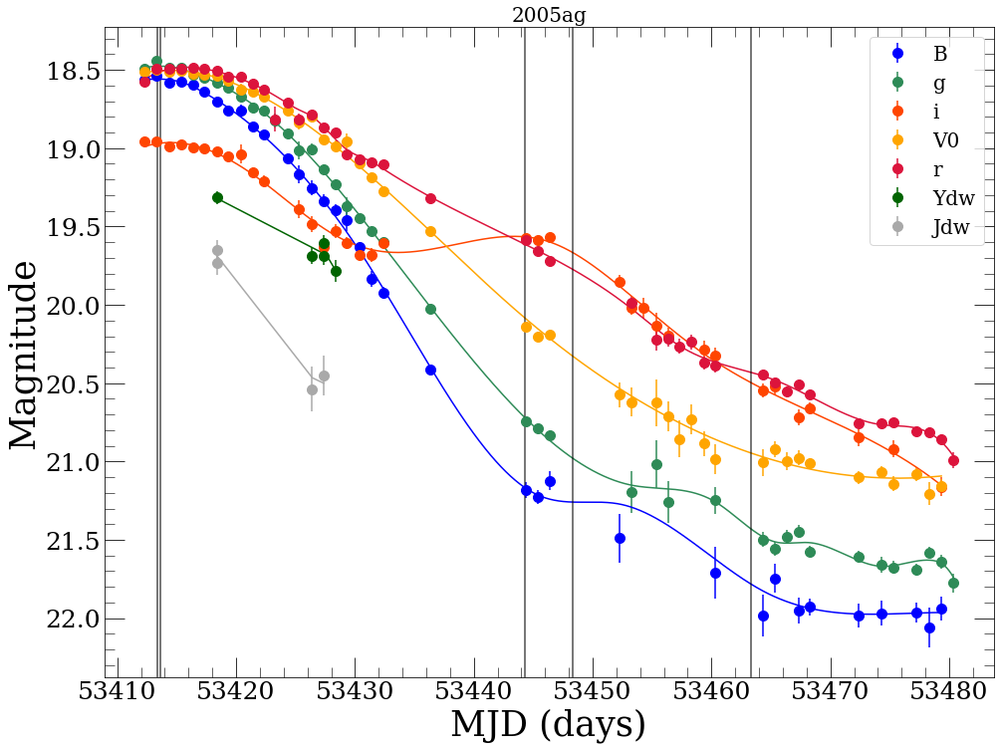

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


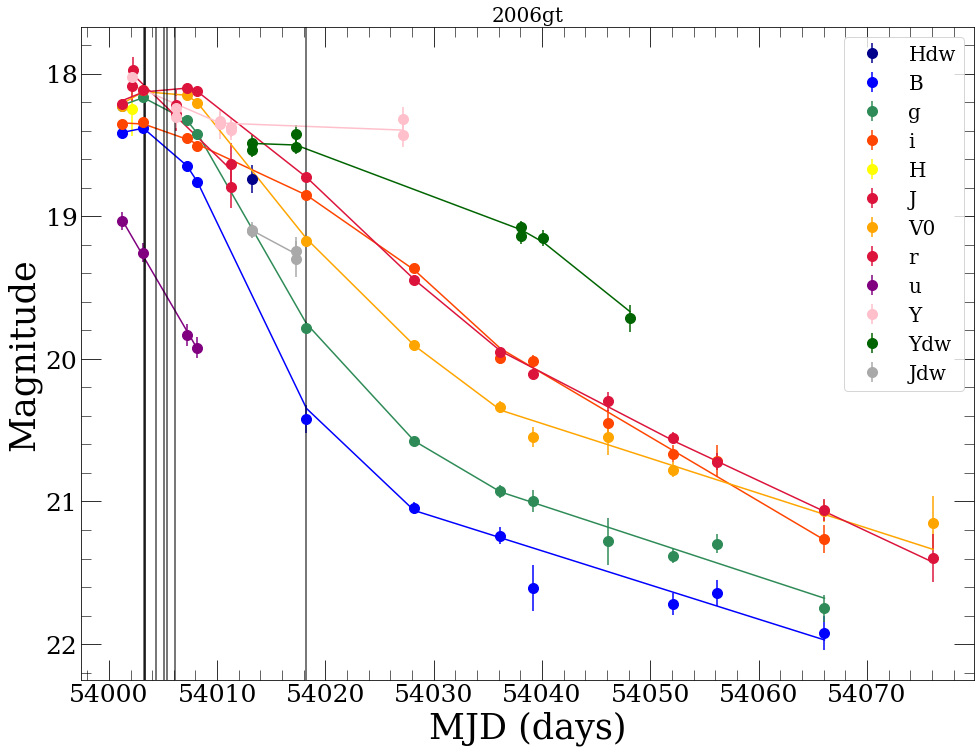

No light curve info!
No light curve info!
No light curve info!
No light curve info!


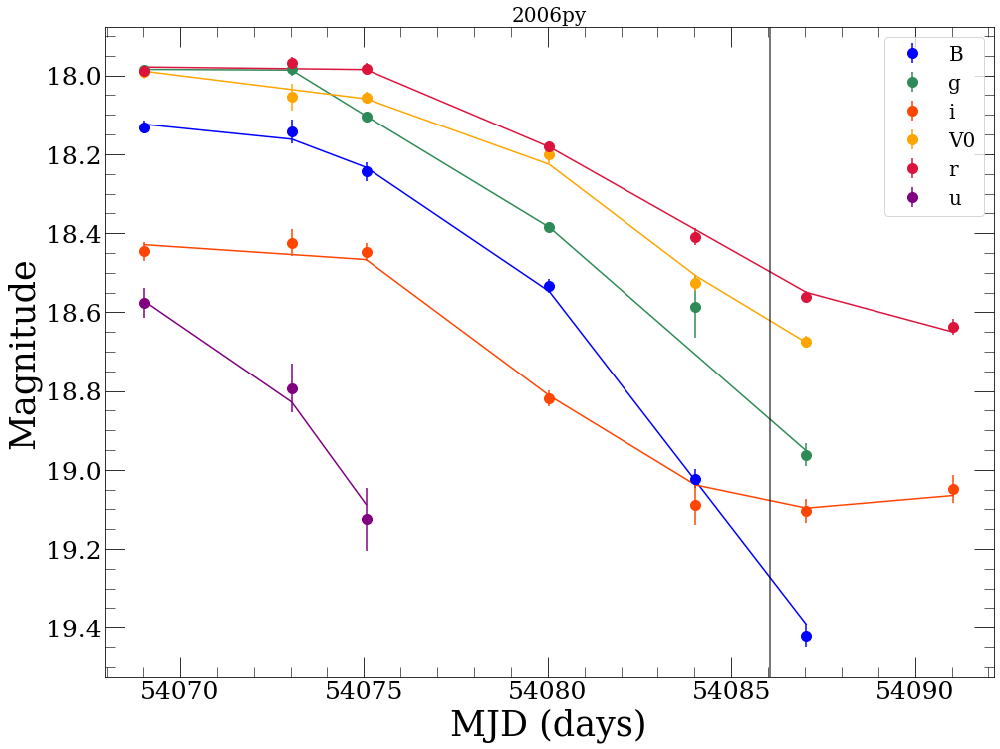

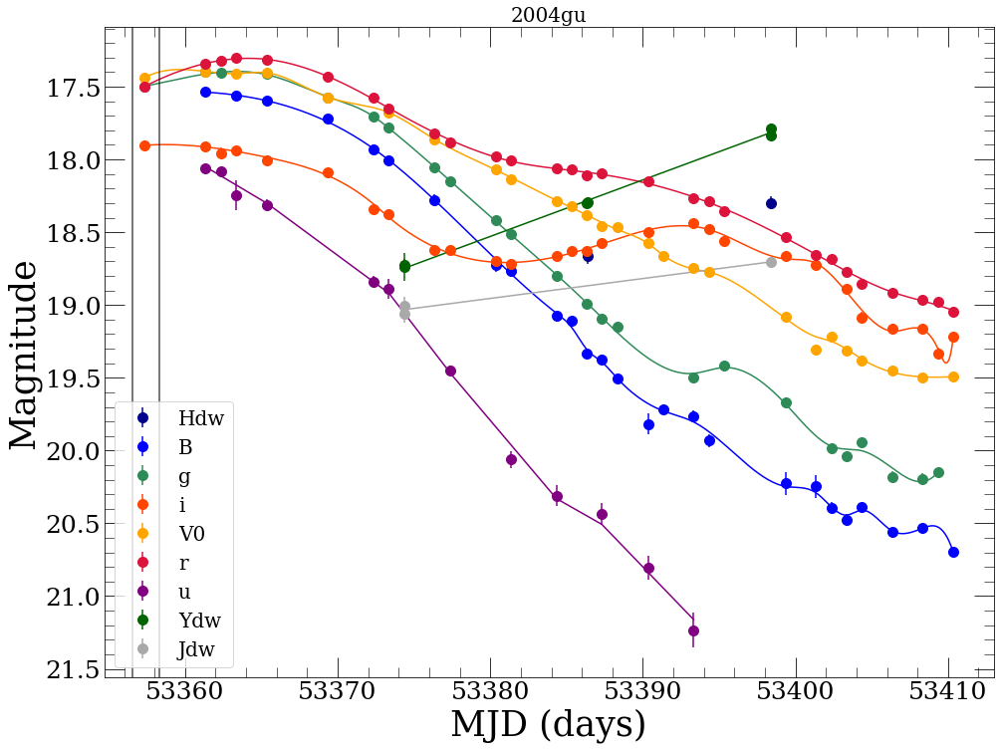

No light curve info!
No light curve info!


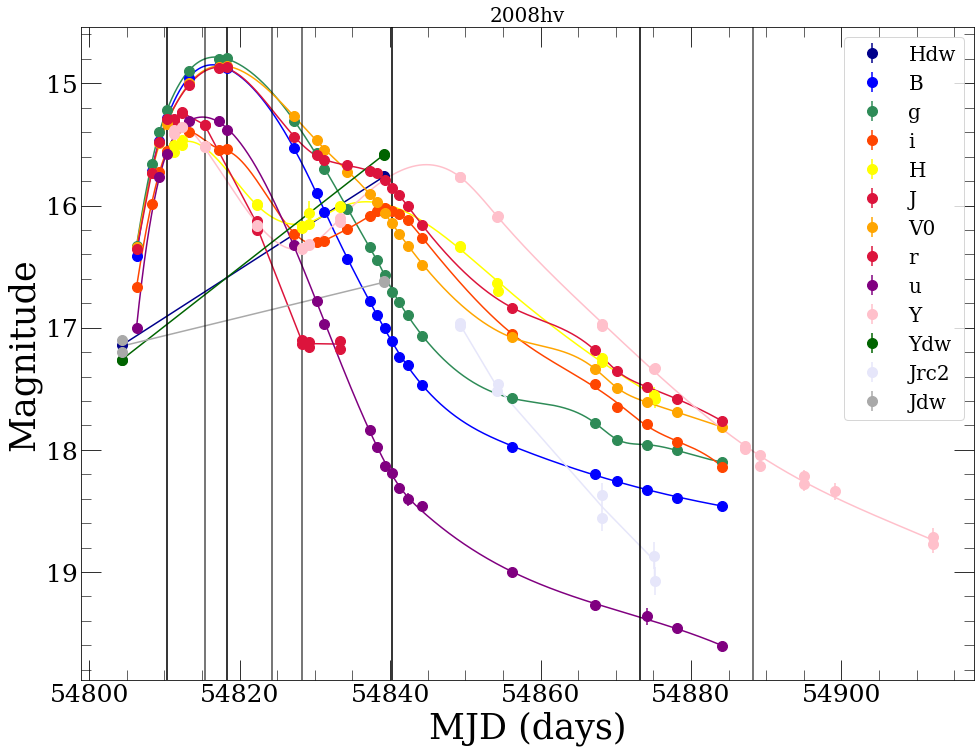

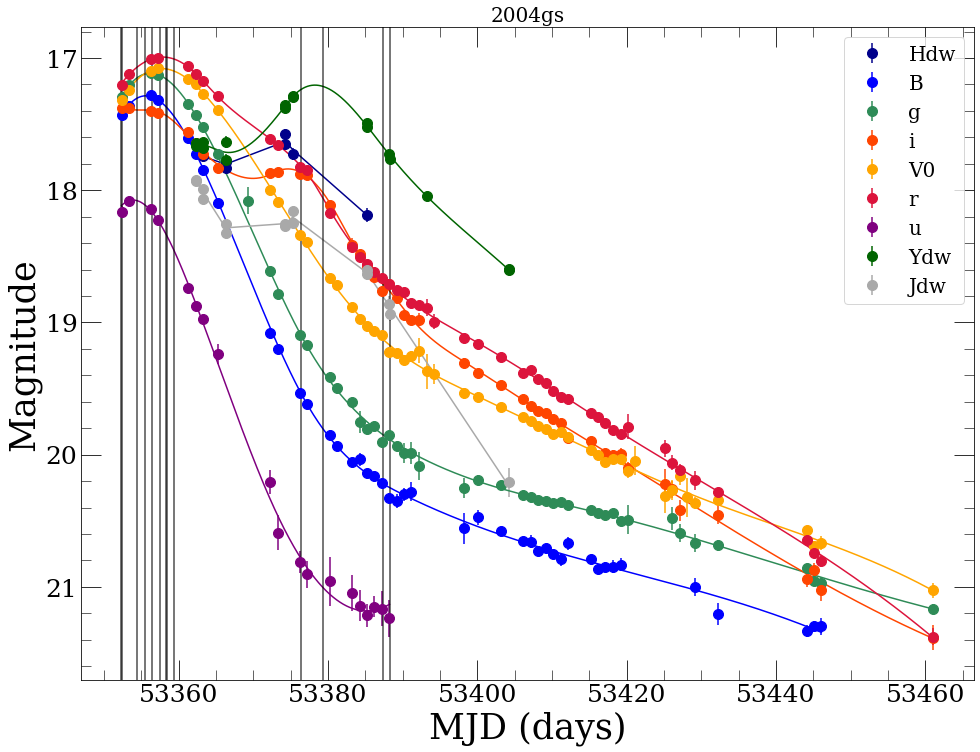

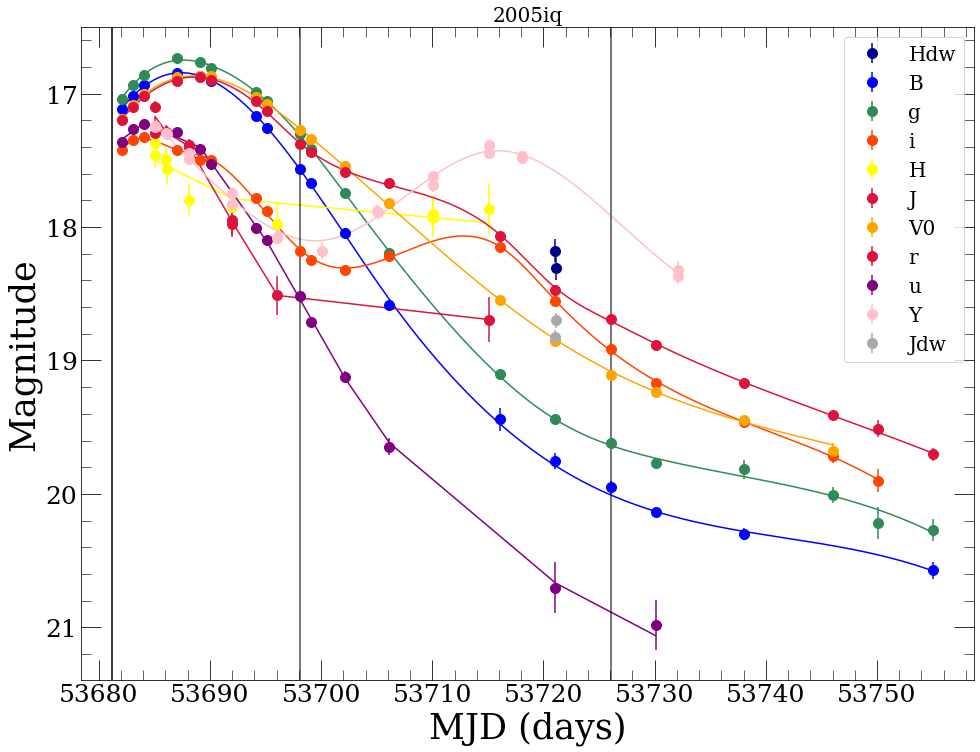

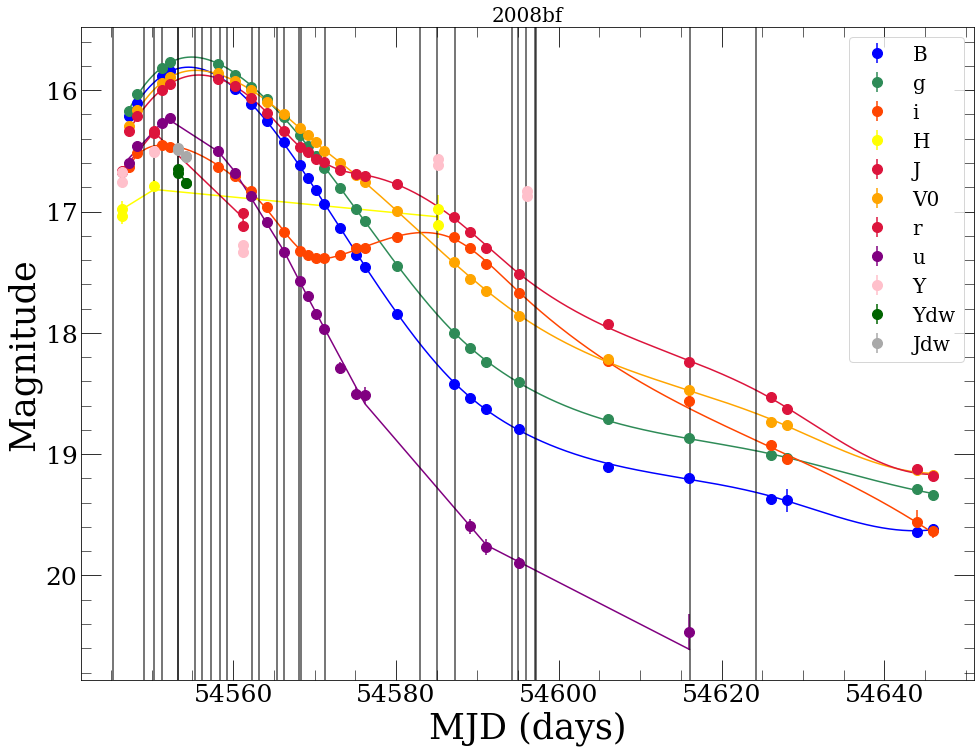

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


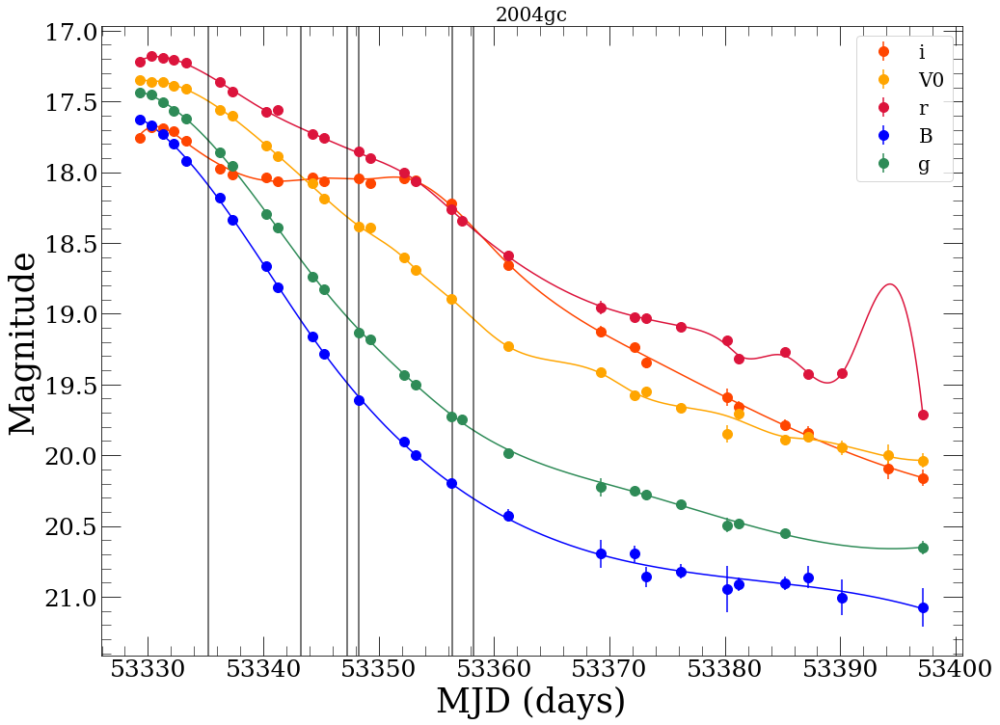

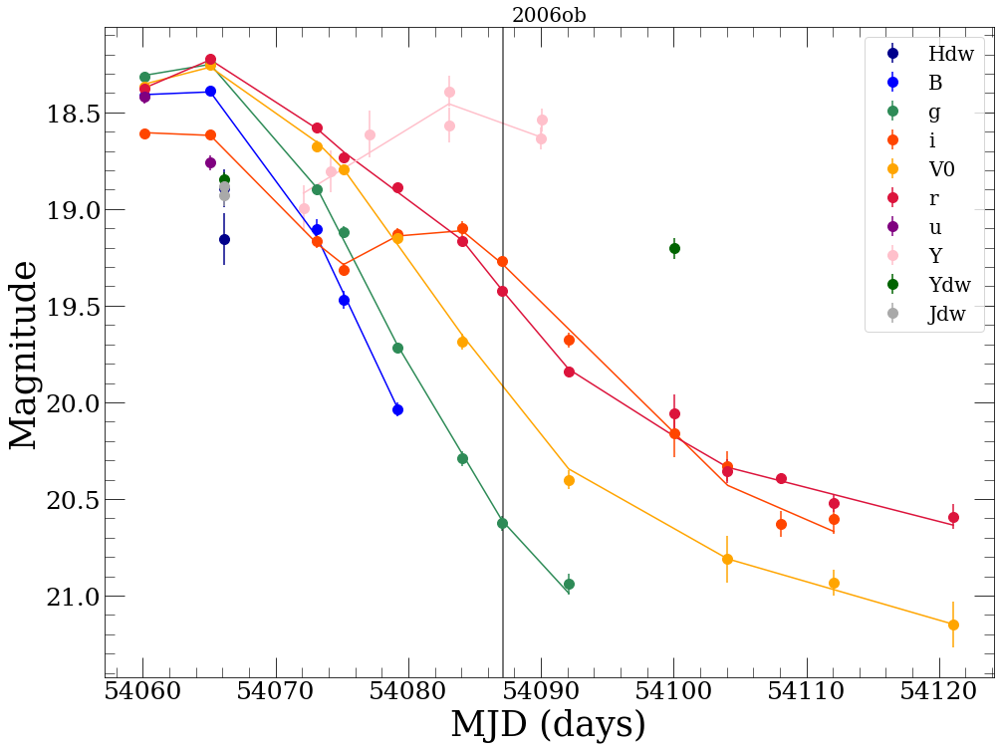

No light curve info!


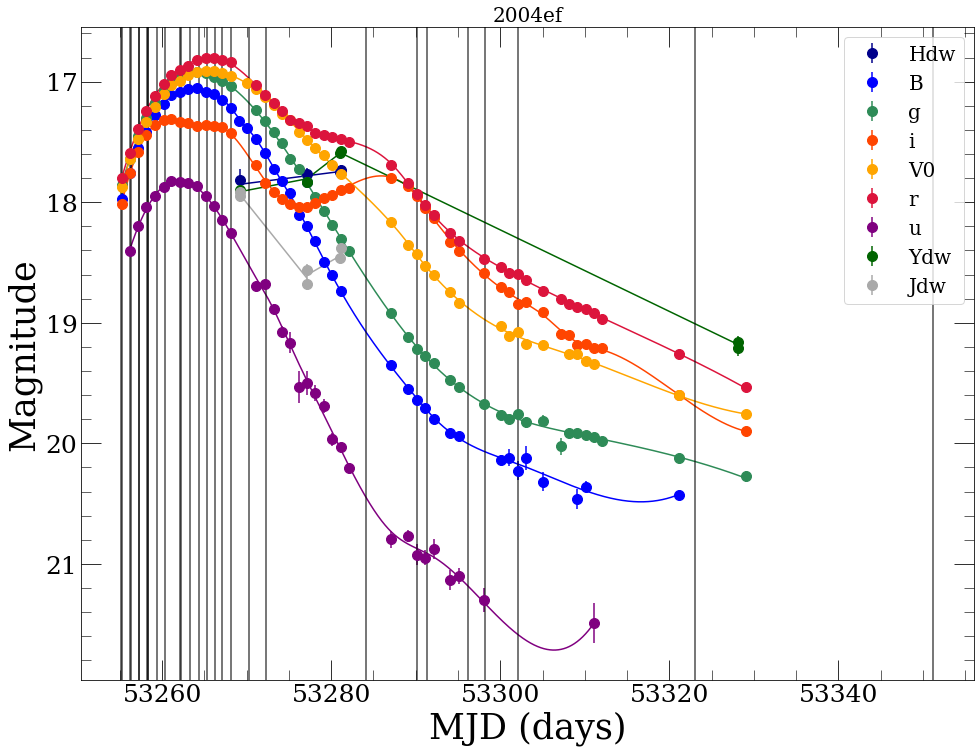

No light curve info!
No light curve info!


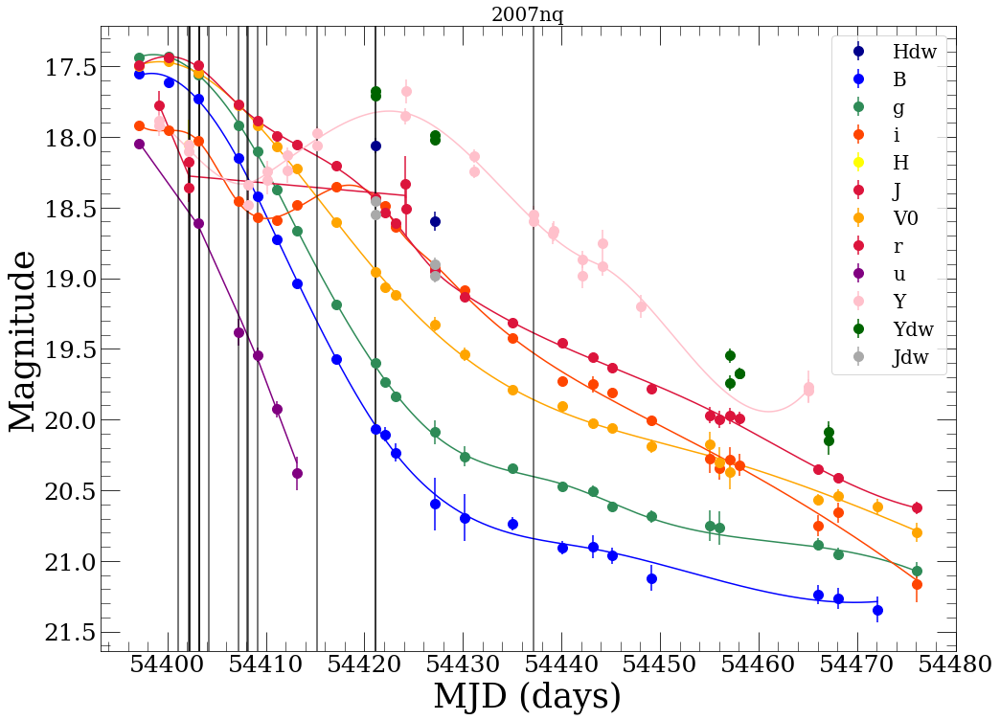

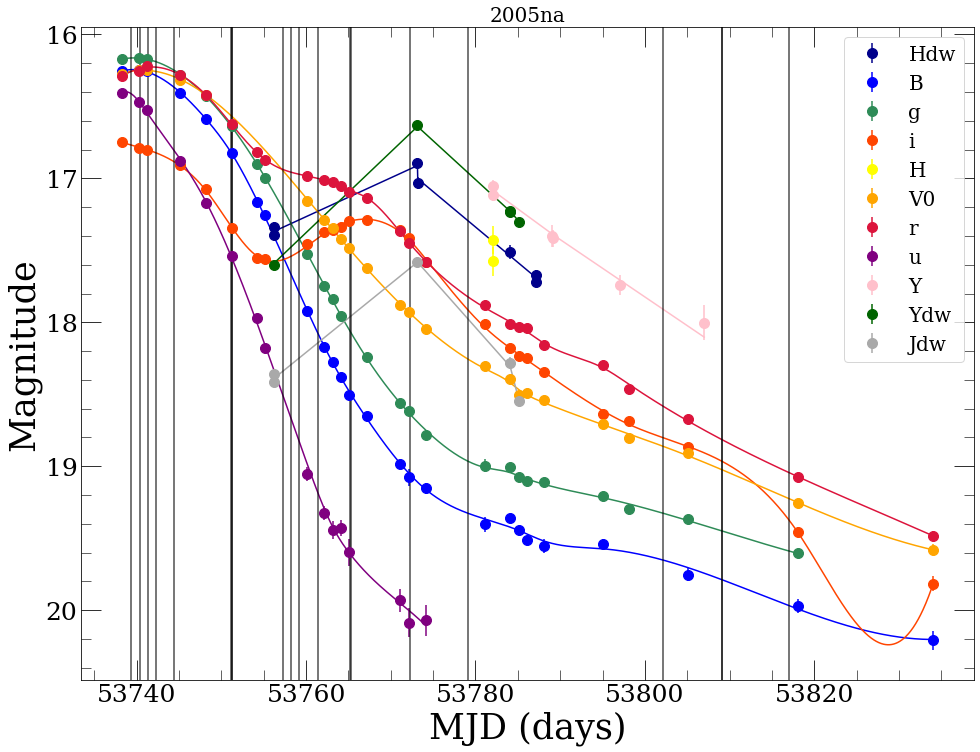

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


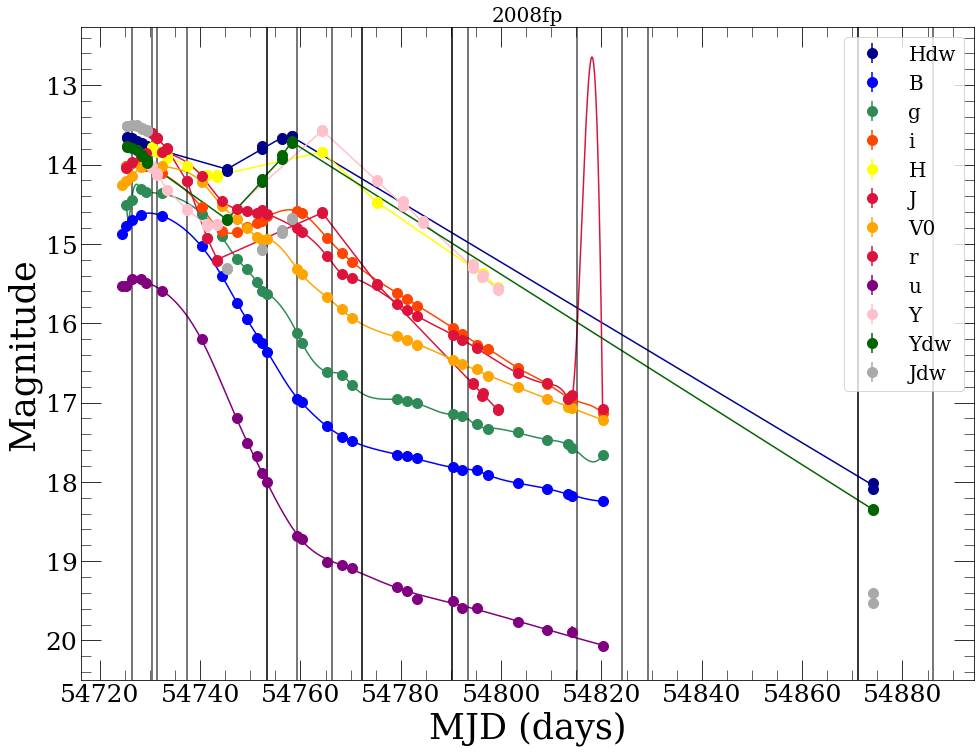

No light curve info!


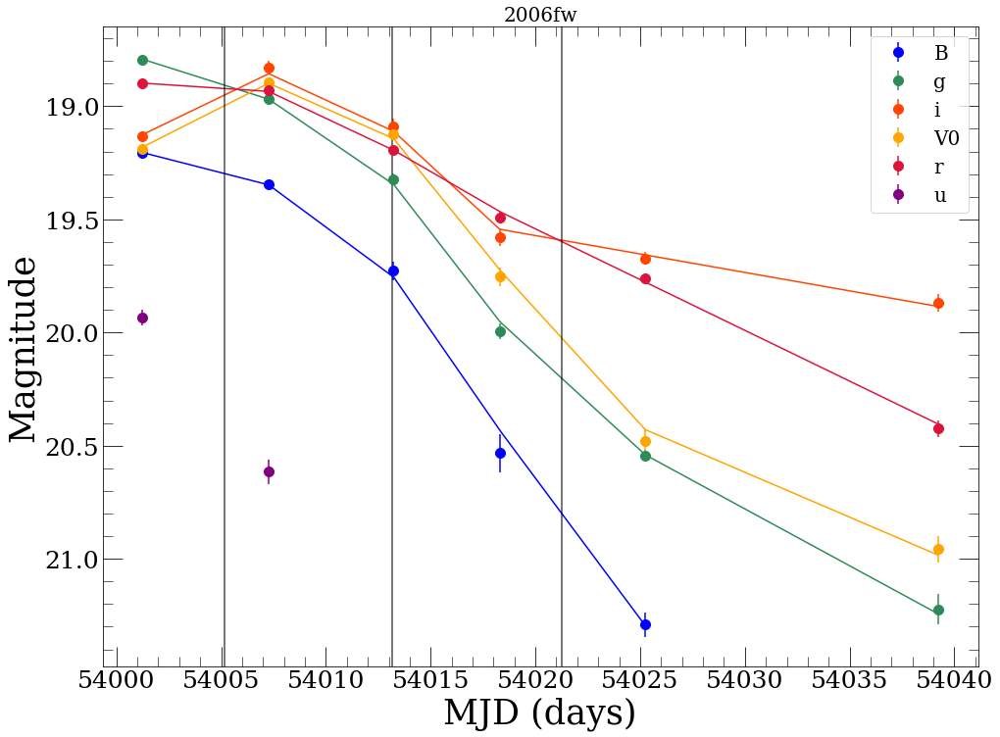

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


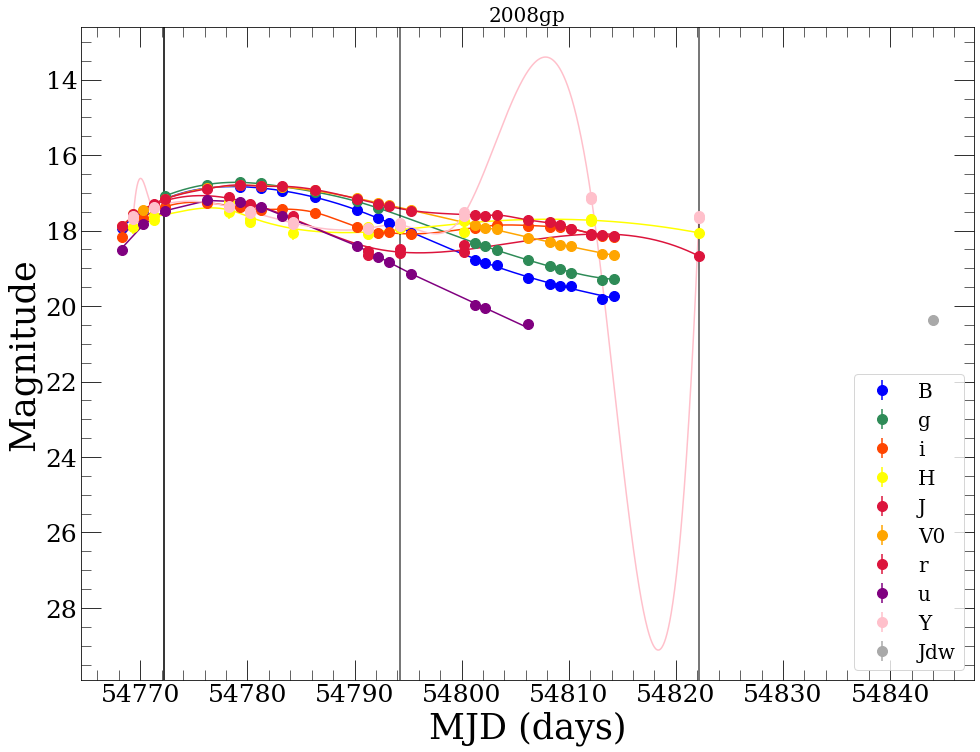

No light curve info!
No light curve info!


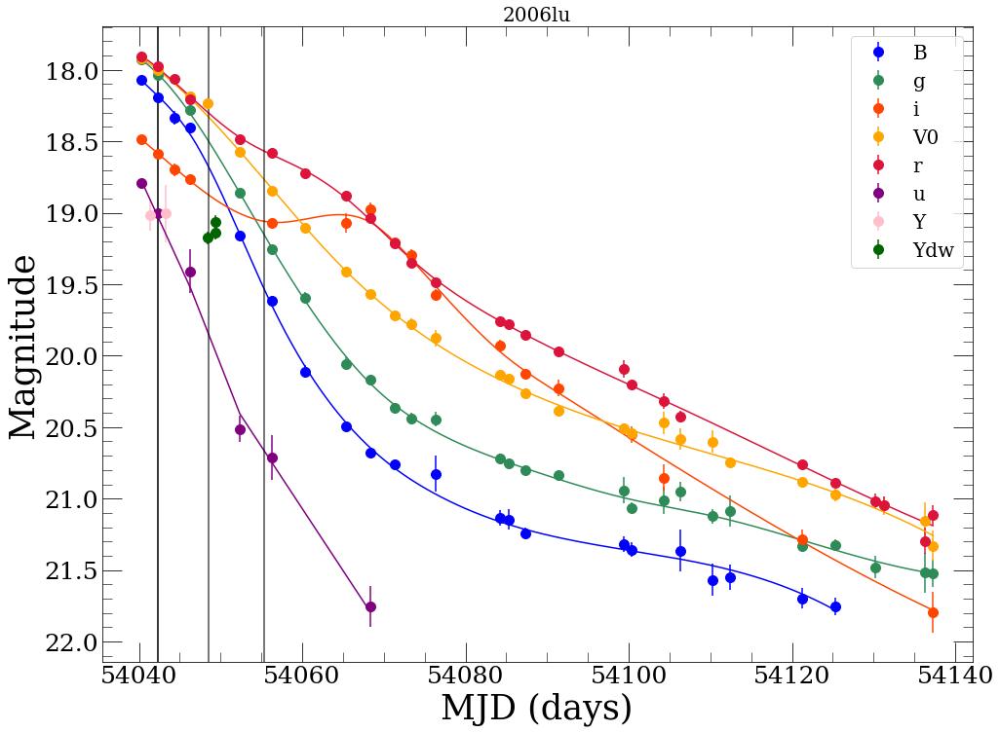

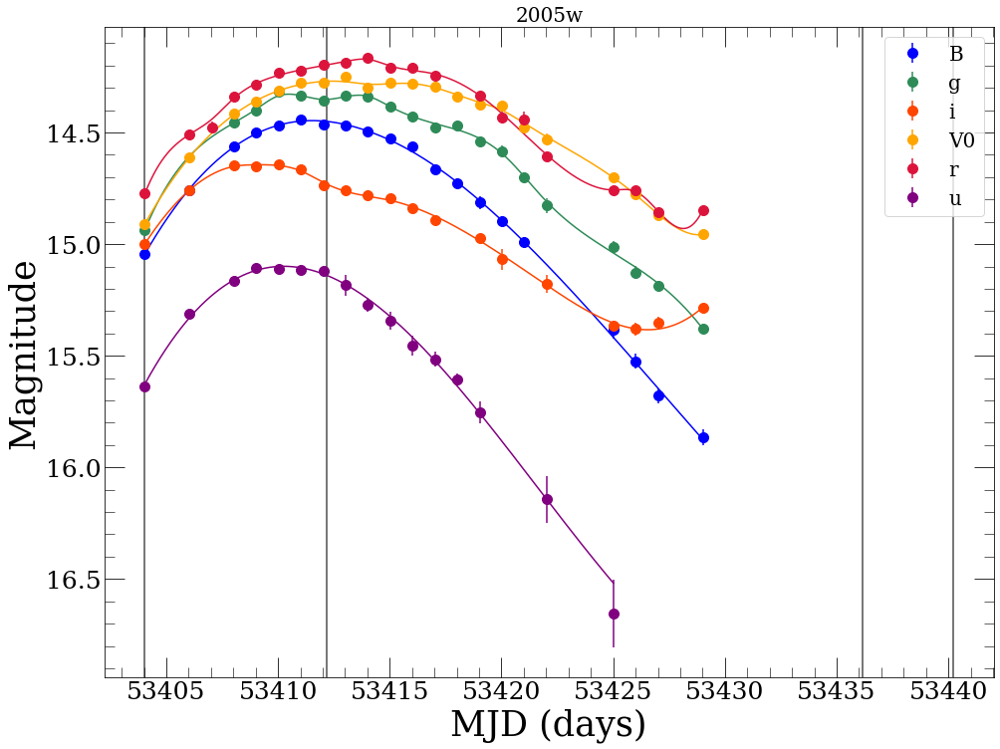

No light curve info!
No light curve info!


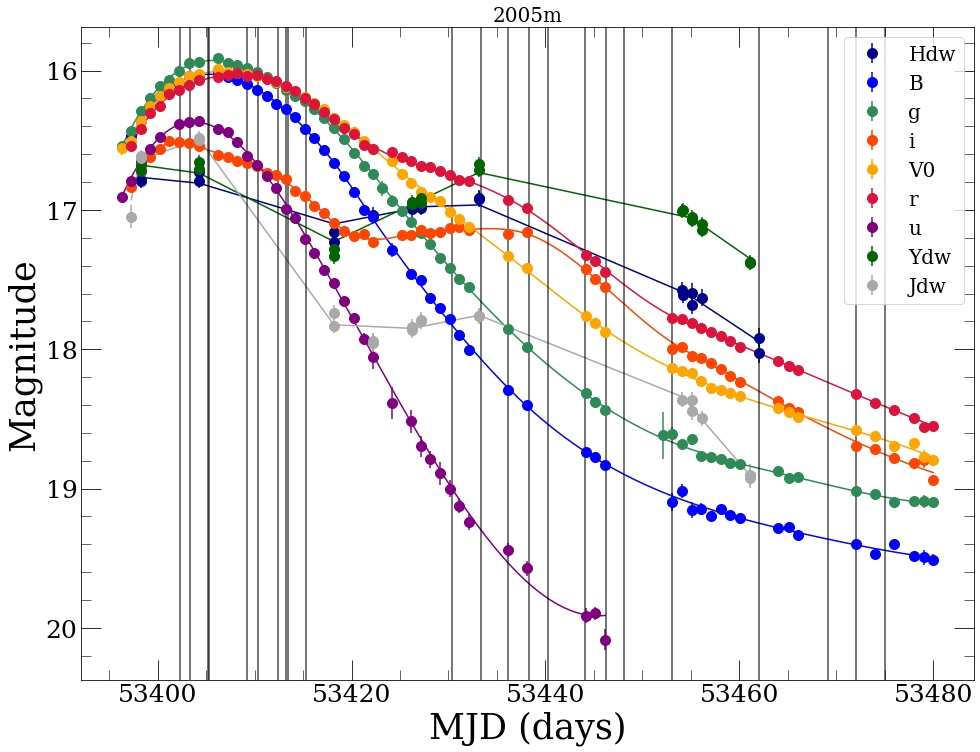

No light curve info!
No light curve info!


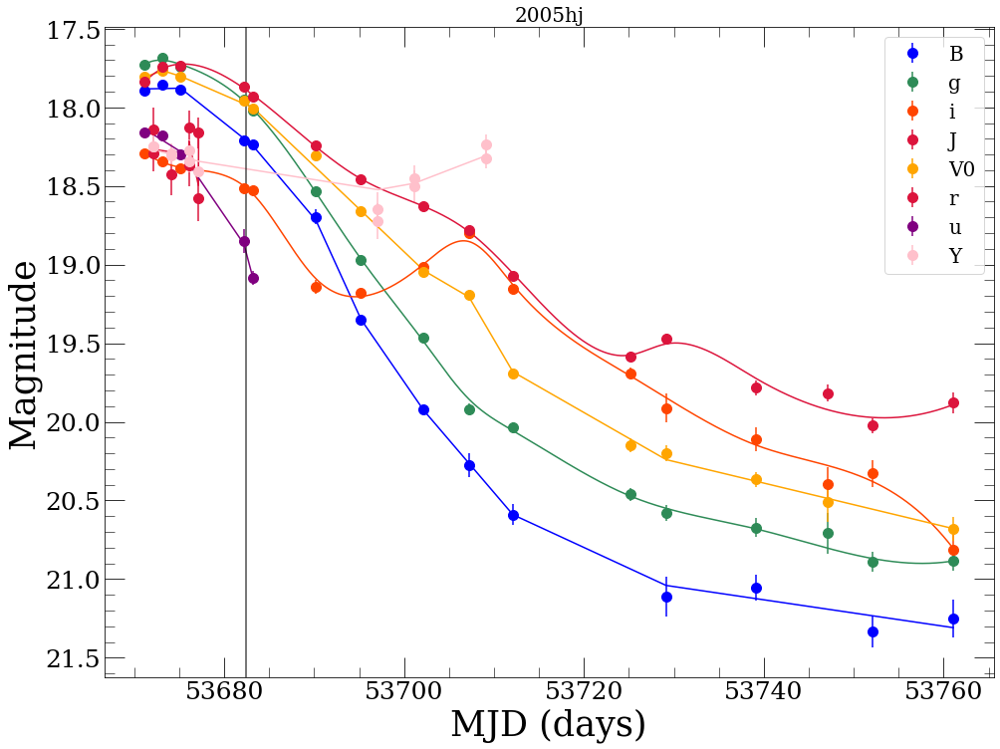

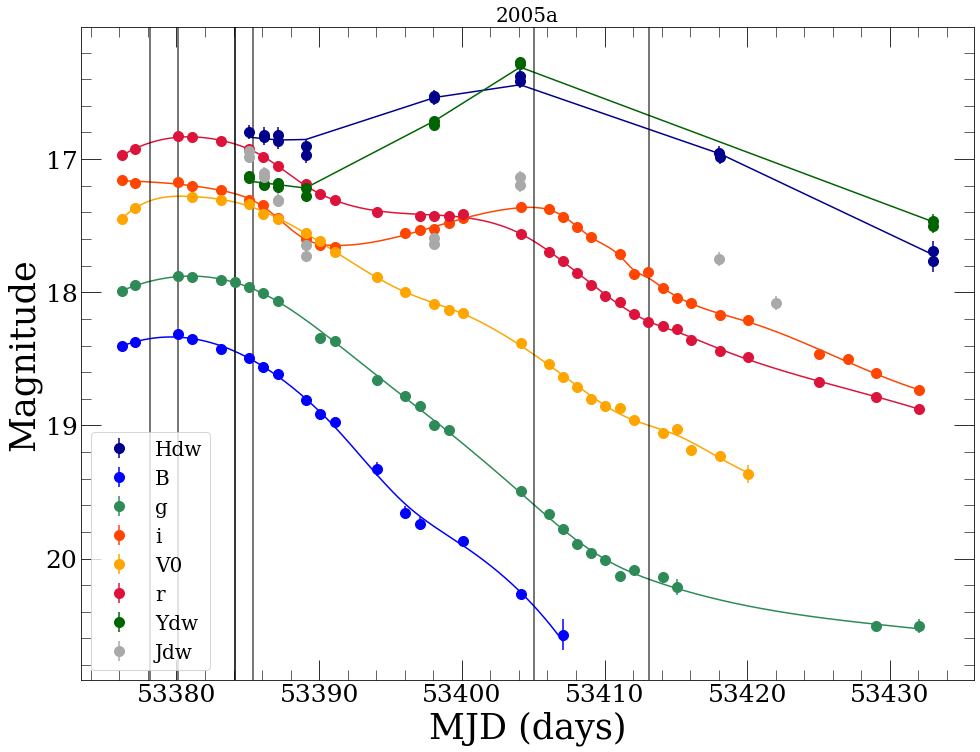

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


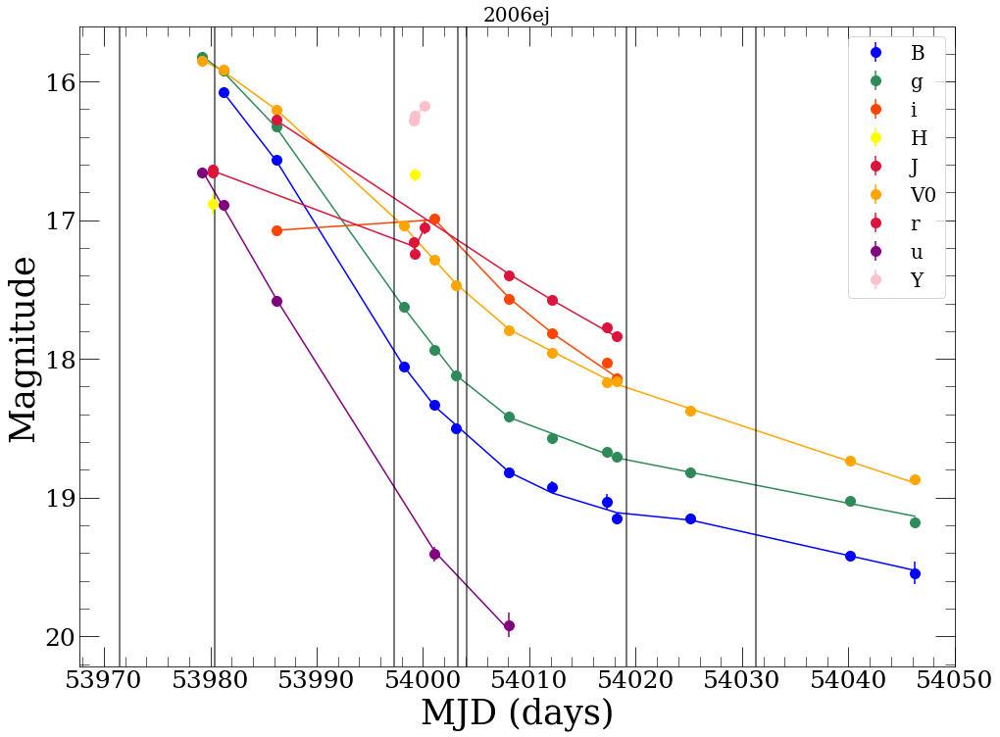

No light curve info!
No light curve info!
No light curve info!
No light curve info!


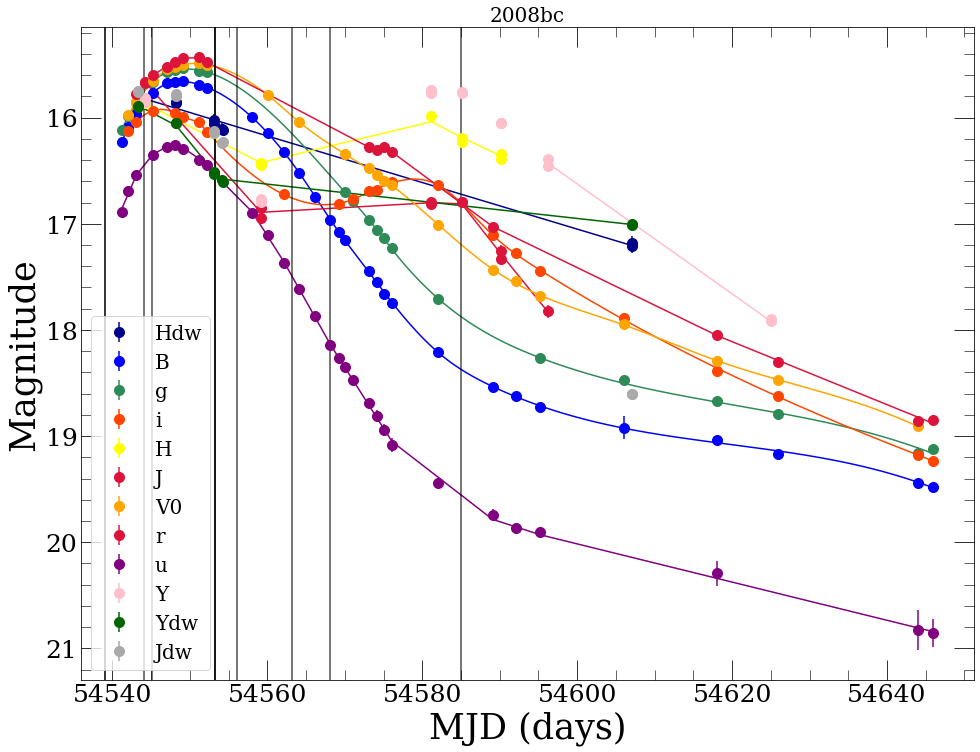

No light curve info!
No light curve info!
No light curve info!
No light curve info!


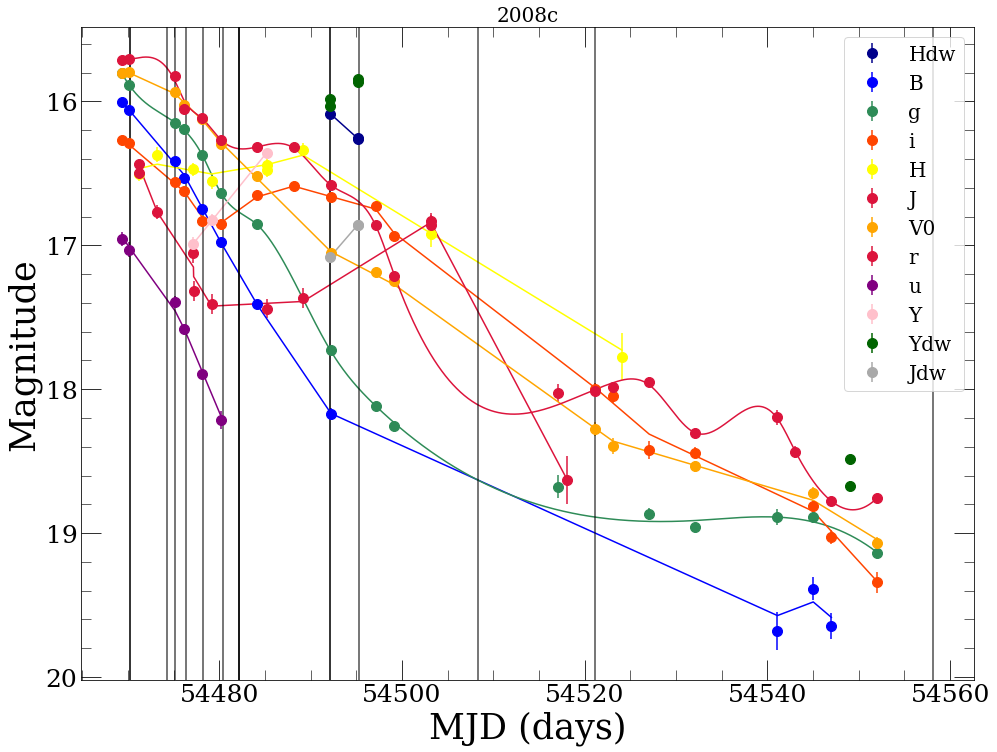

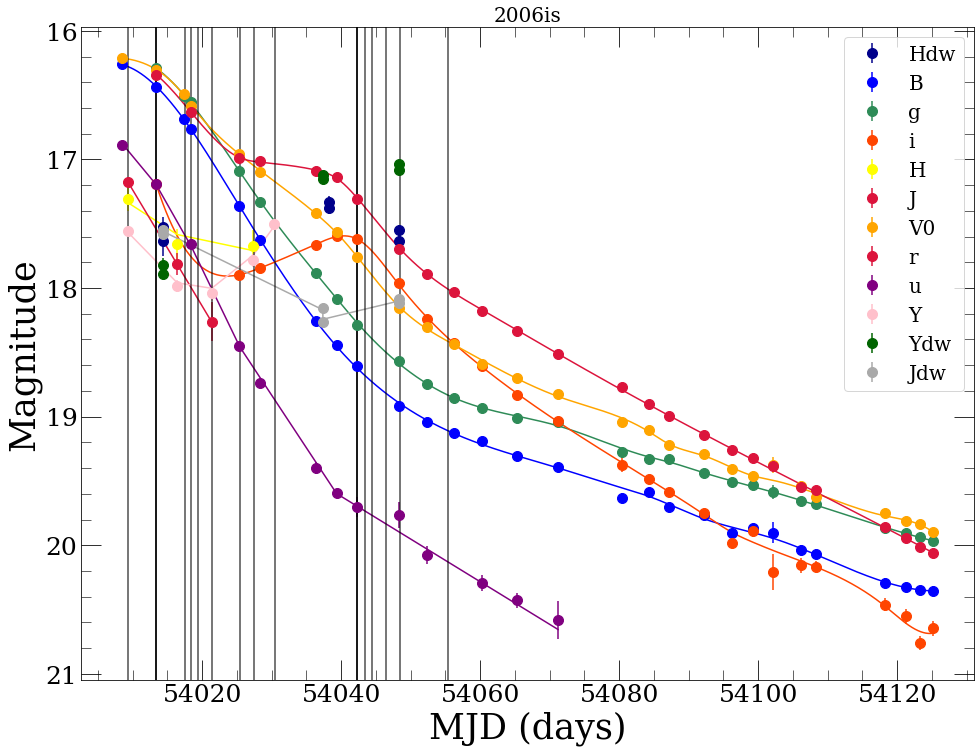

No light curve info!
No light curve info!
No light curve info!
No light curve info!


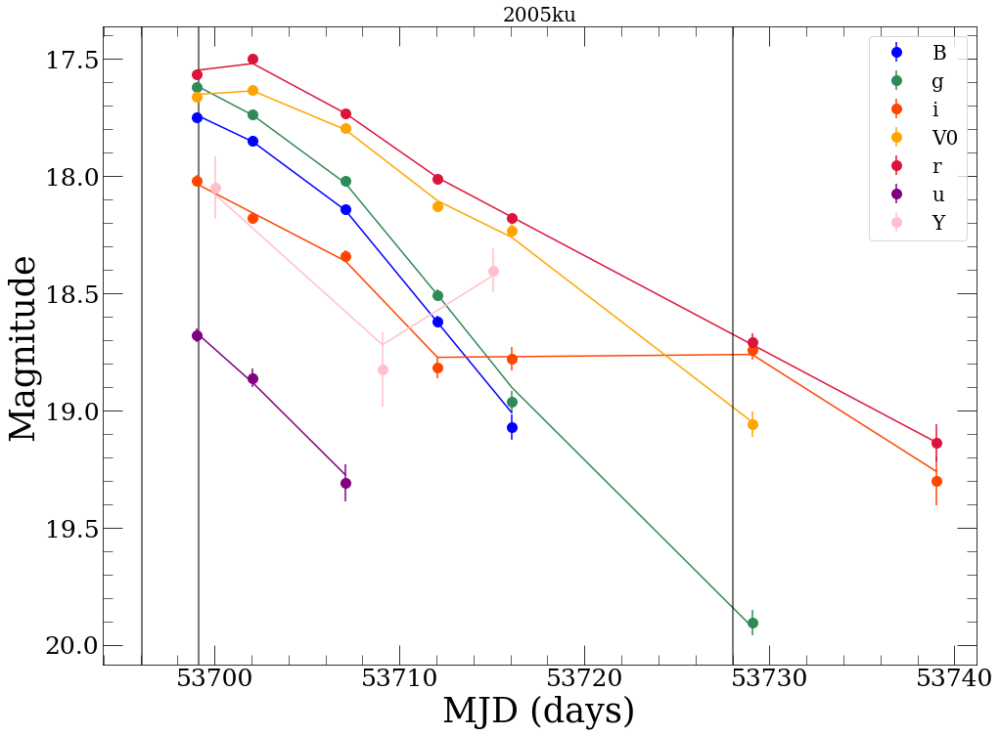

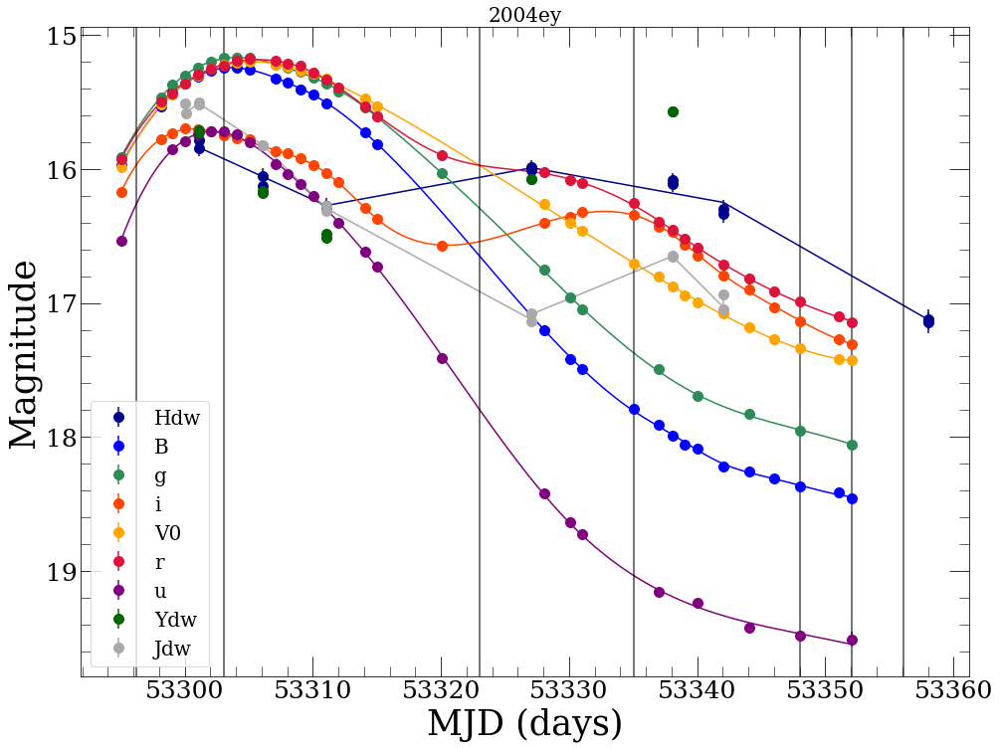

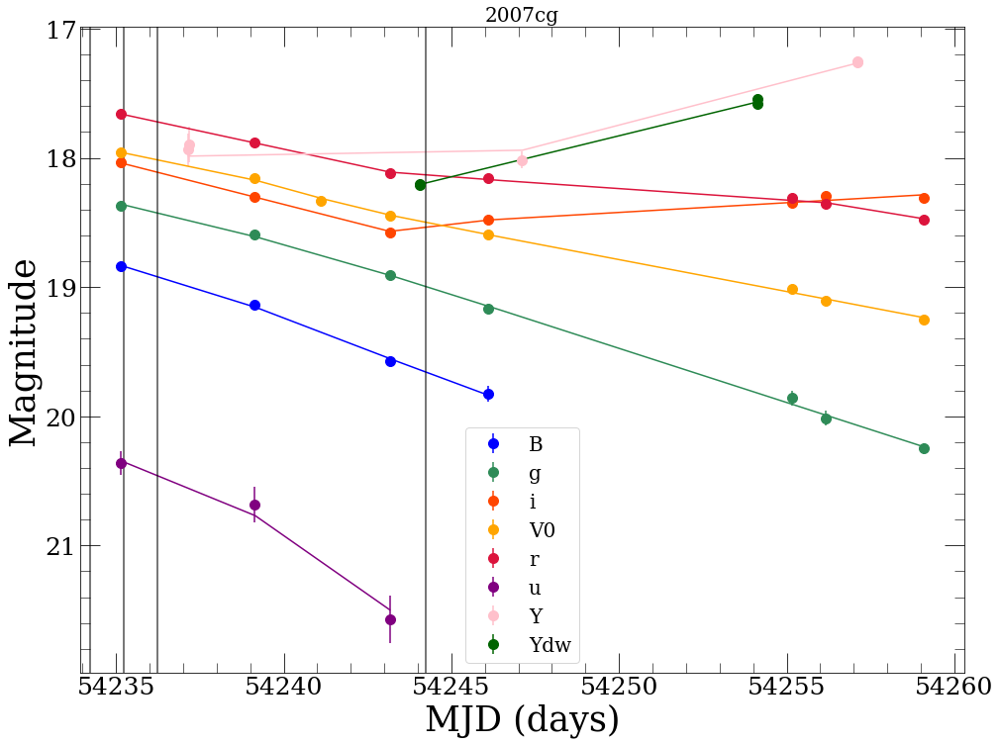

No light curve info!
No light curve info!
No light curve info!


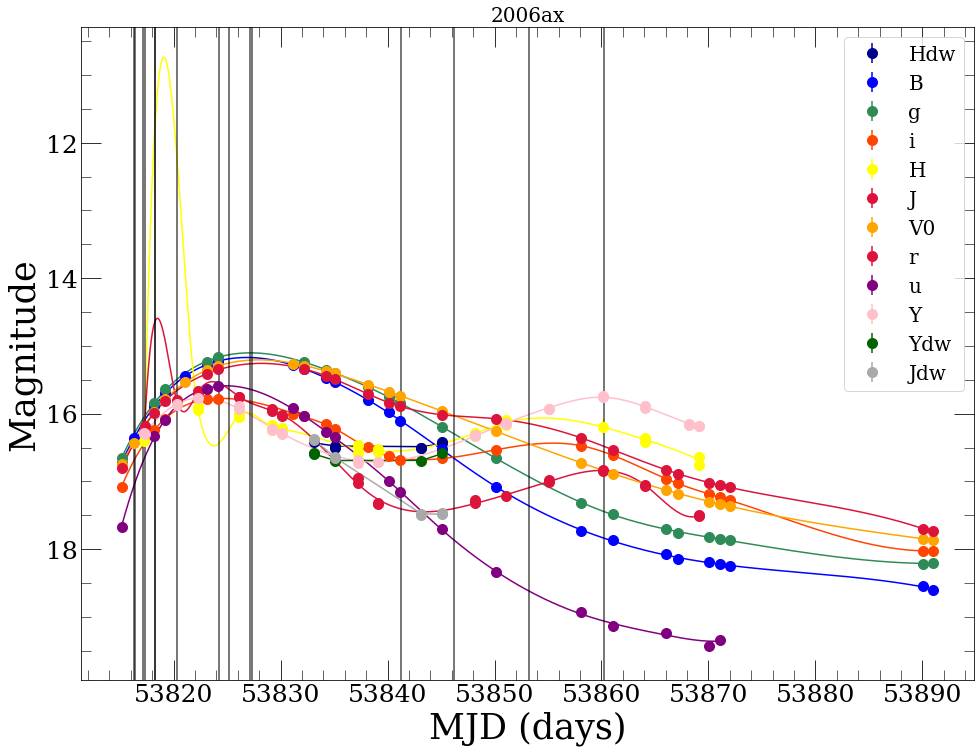

No light curve info!
No light curve info!


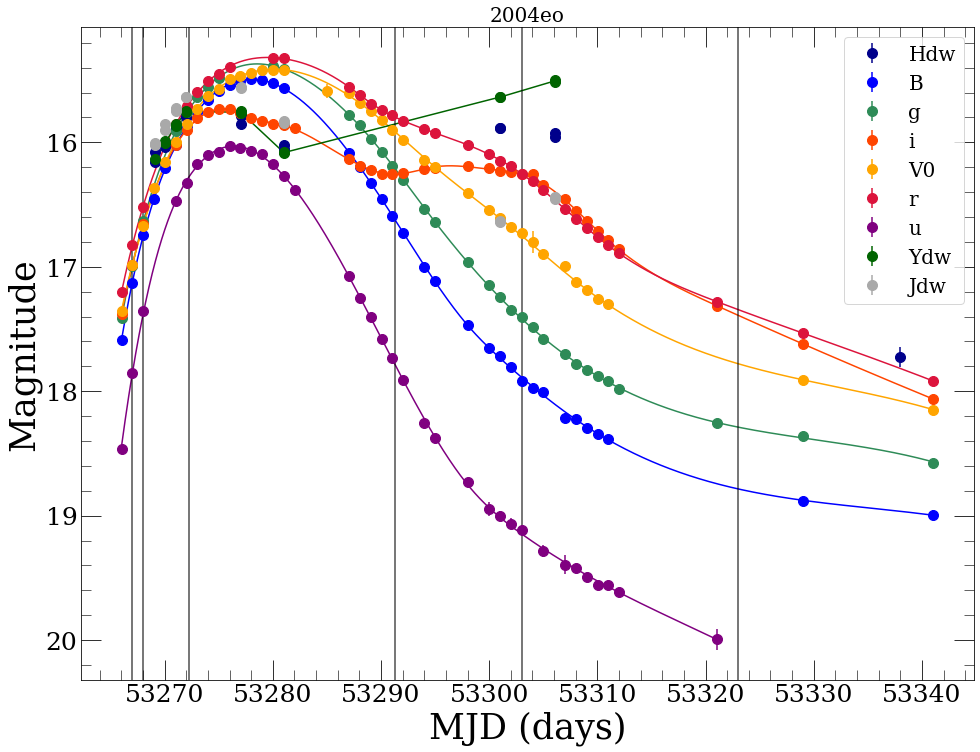

No light curve info!


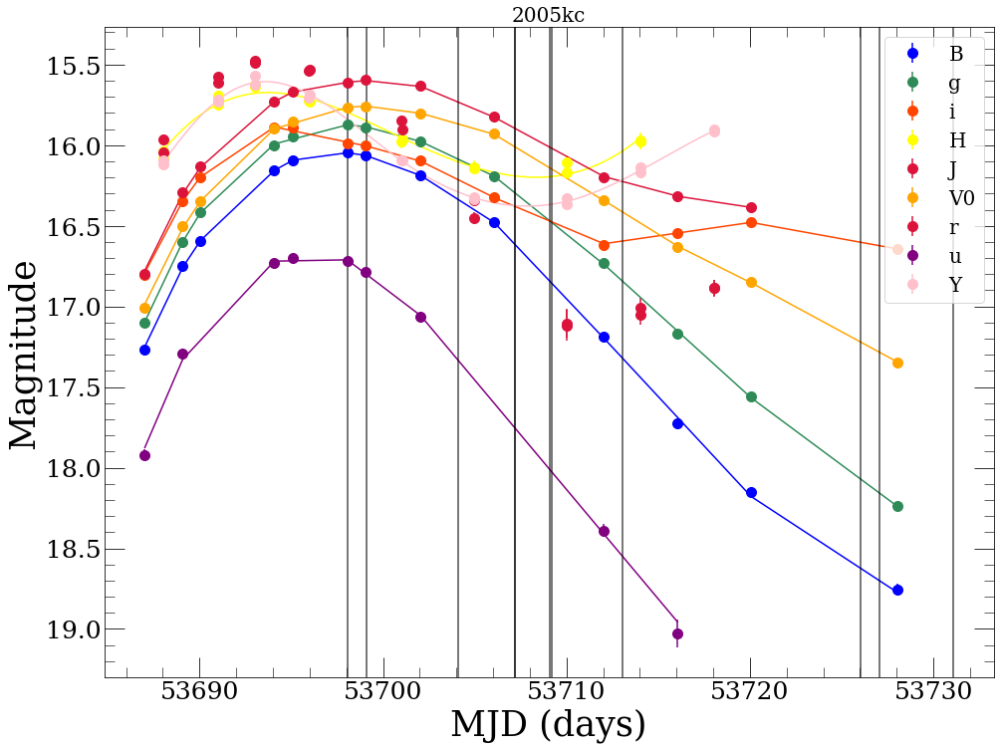

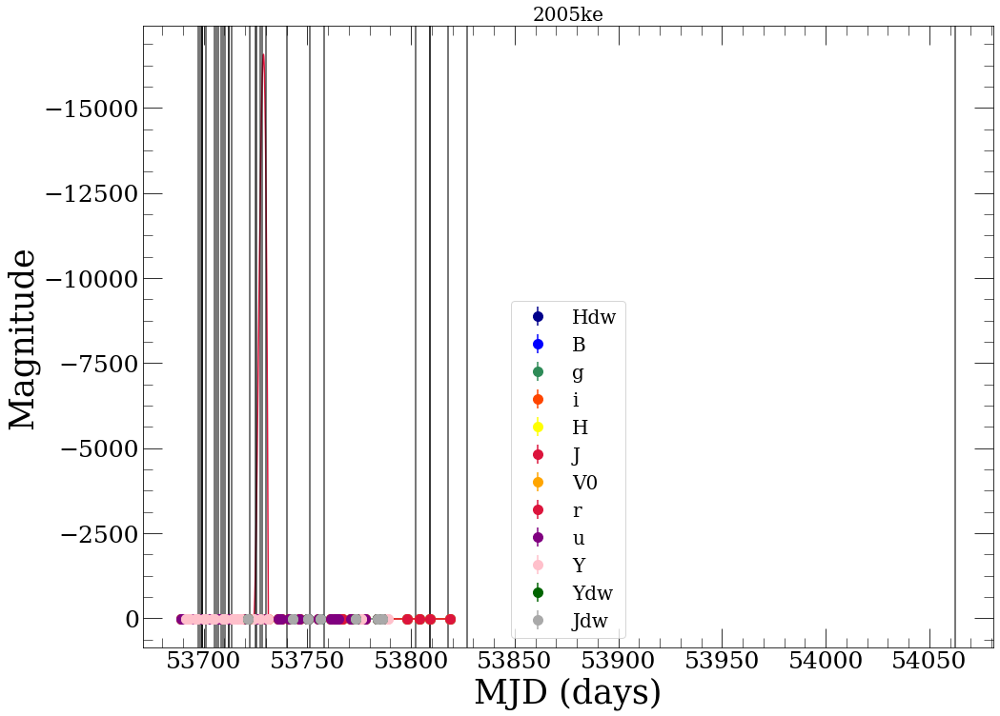

No light curve info!


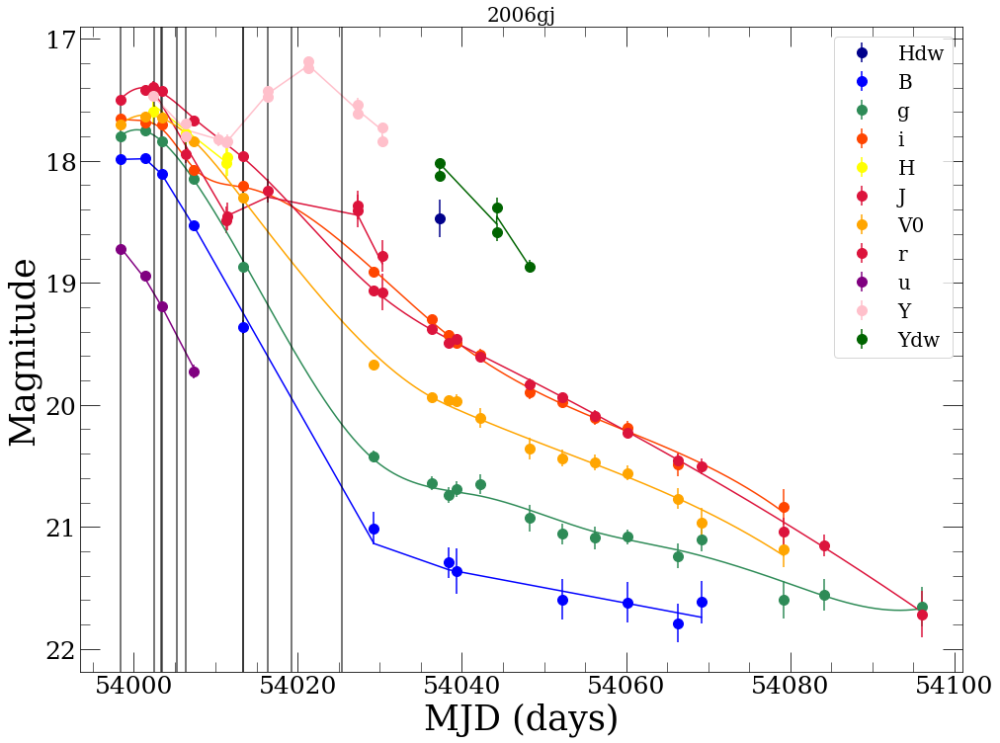

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


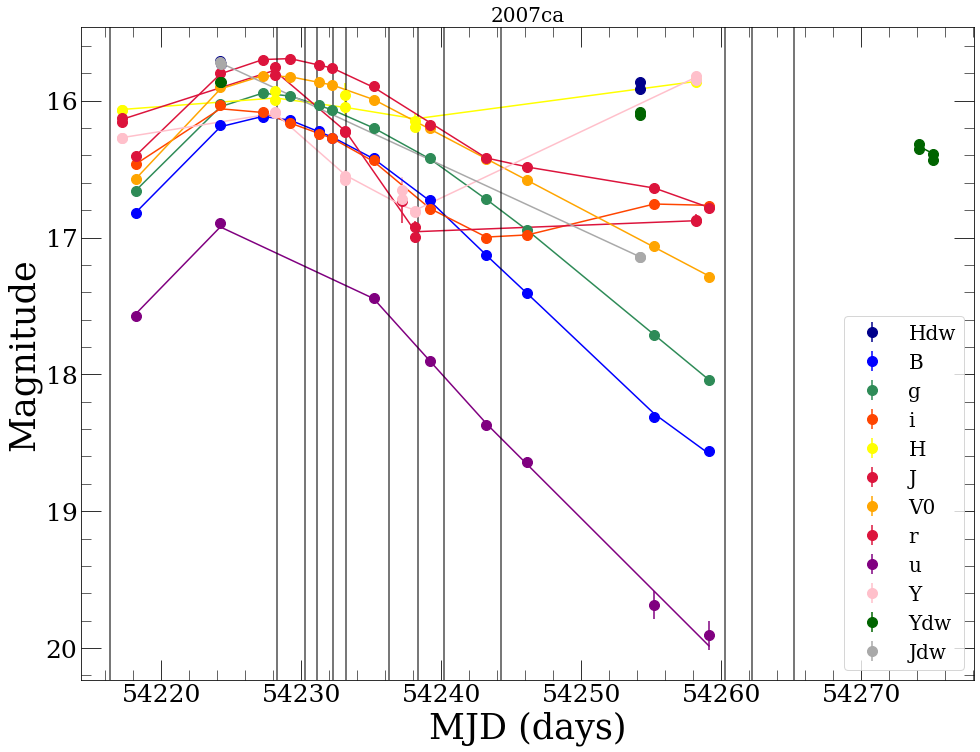

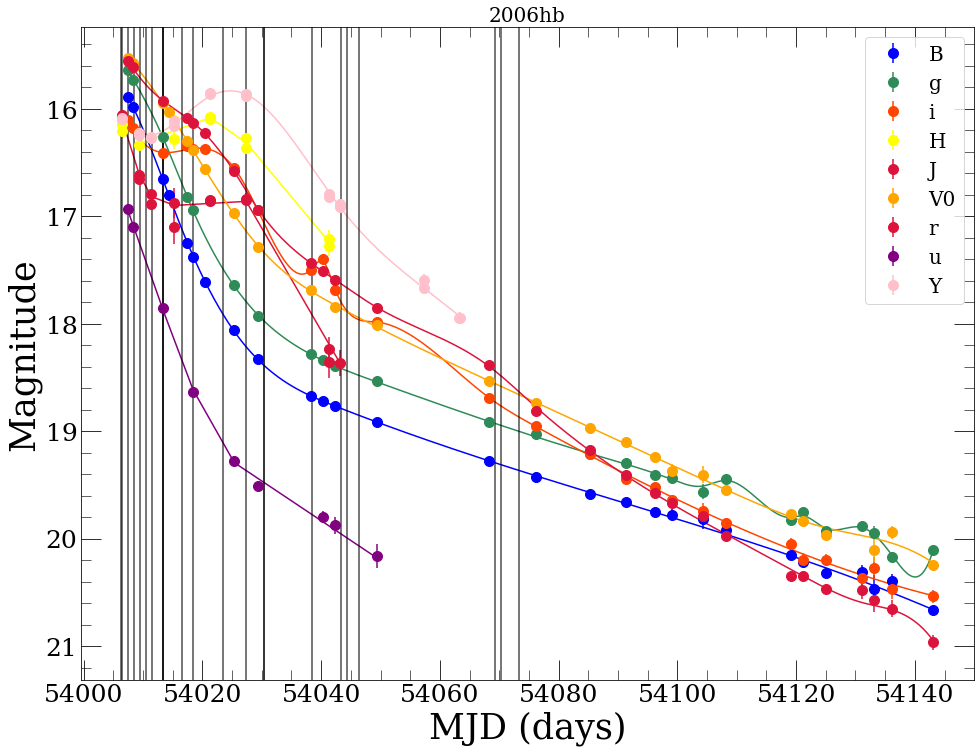

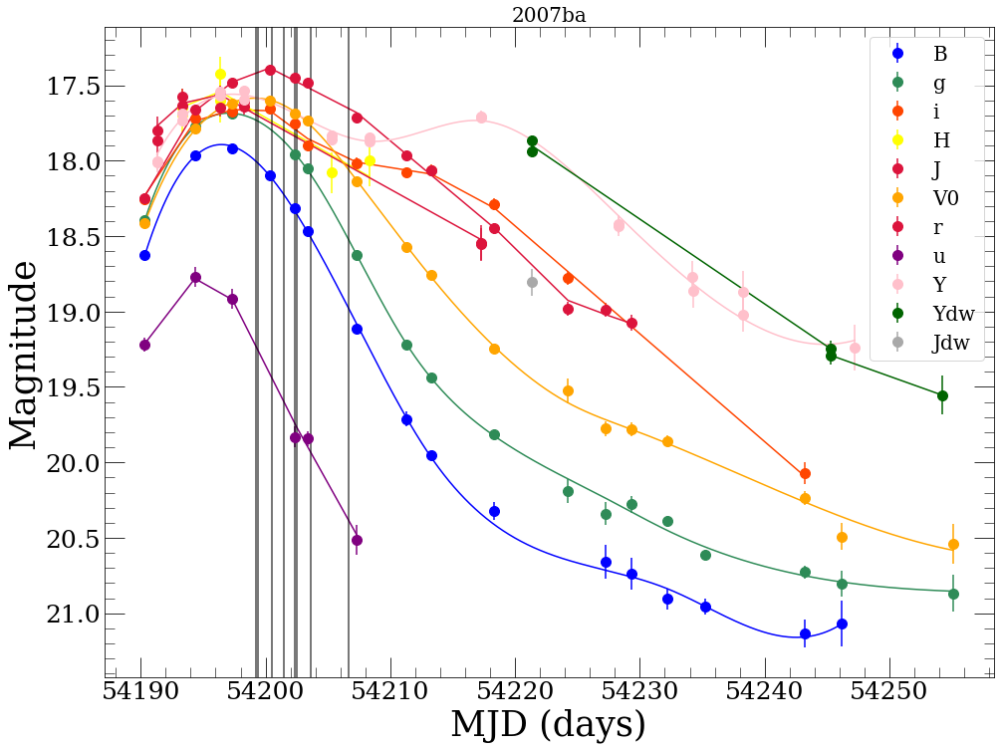

No light curve info!
No light curve info!


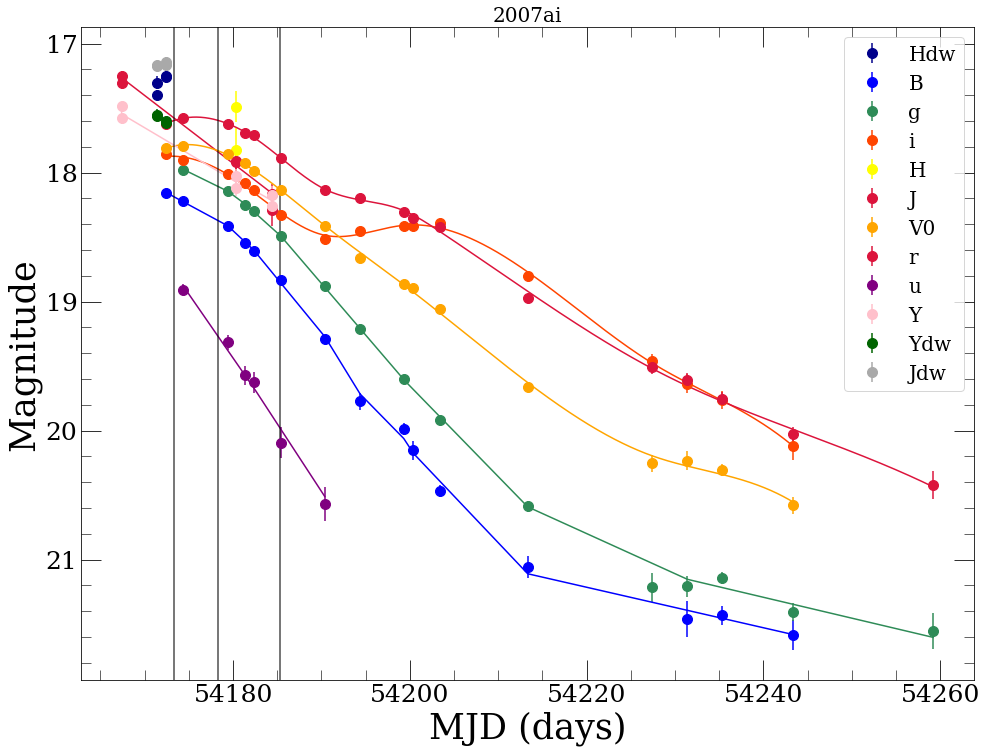

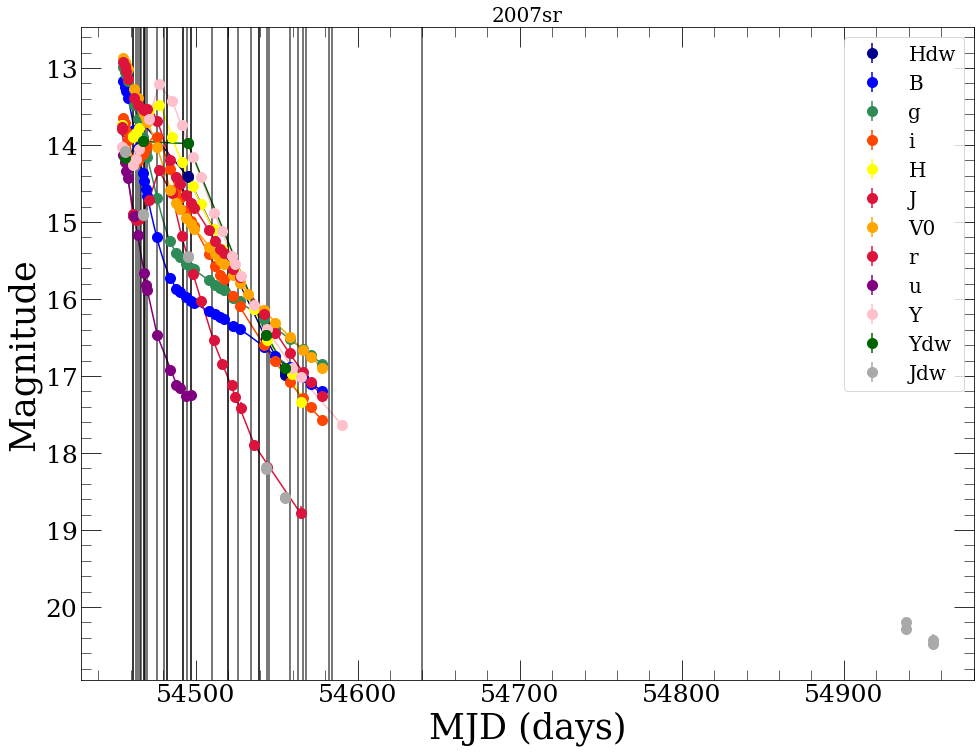

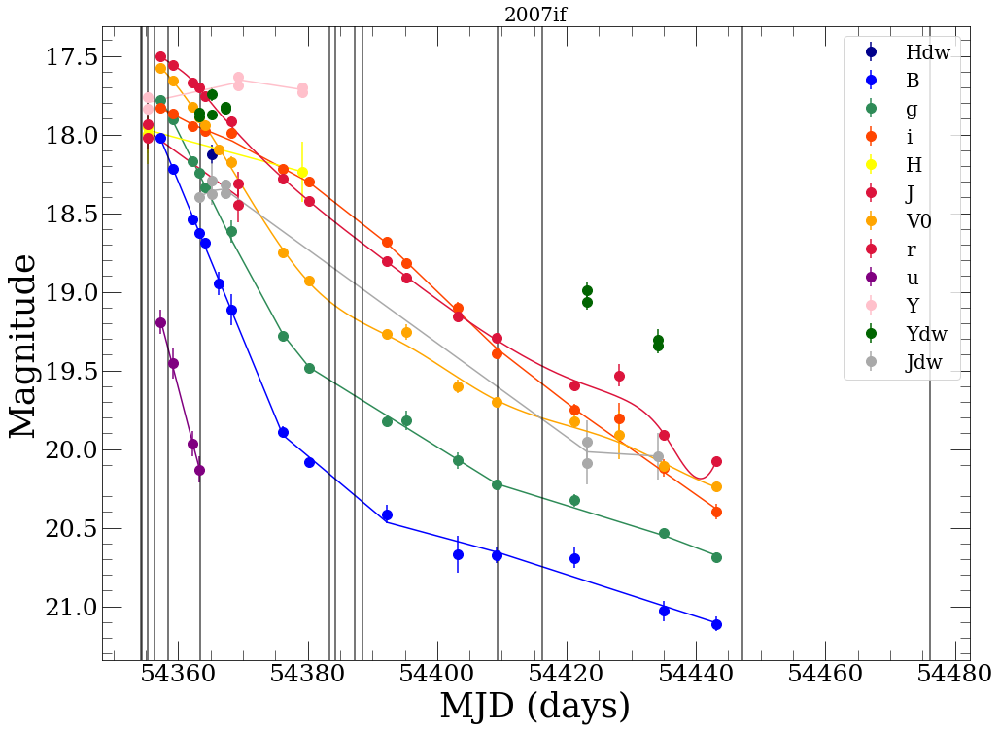

No light curve info!
No light curve info!
No light curve info!


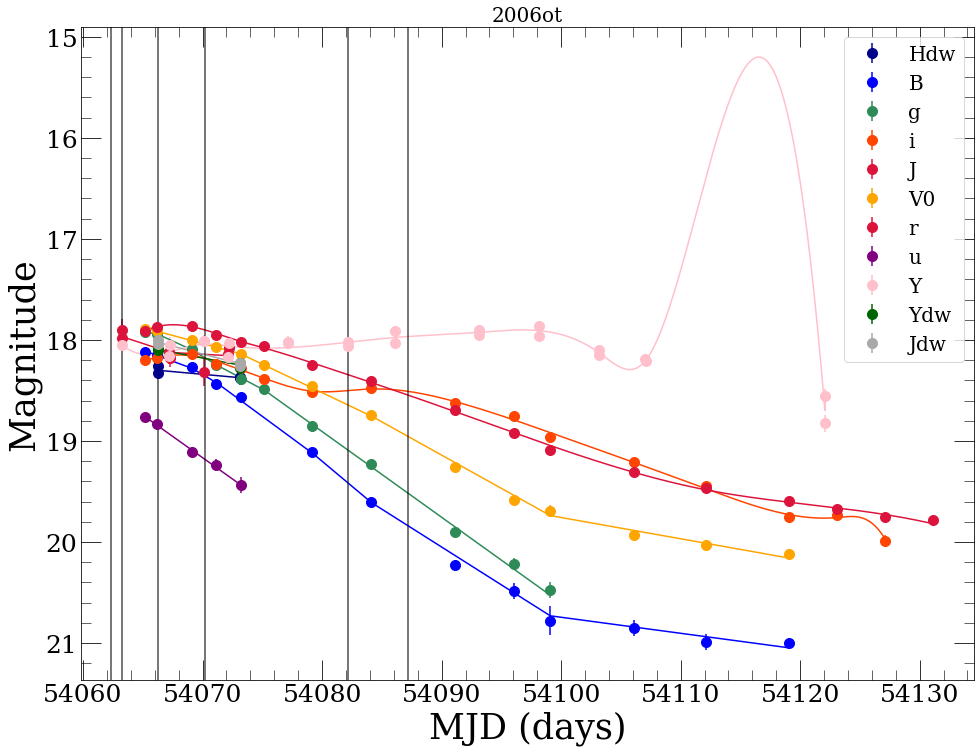

No light curve info!


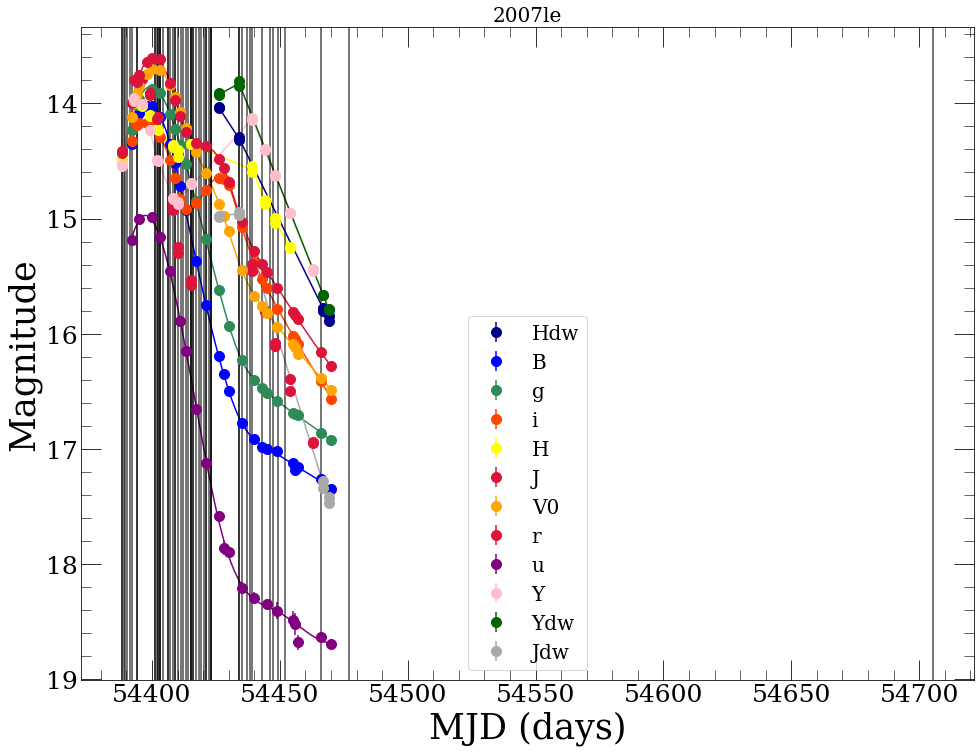

No light curve info!
No light curve info!


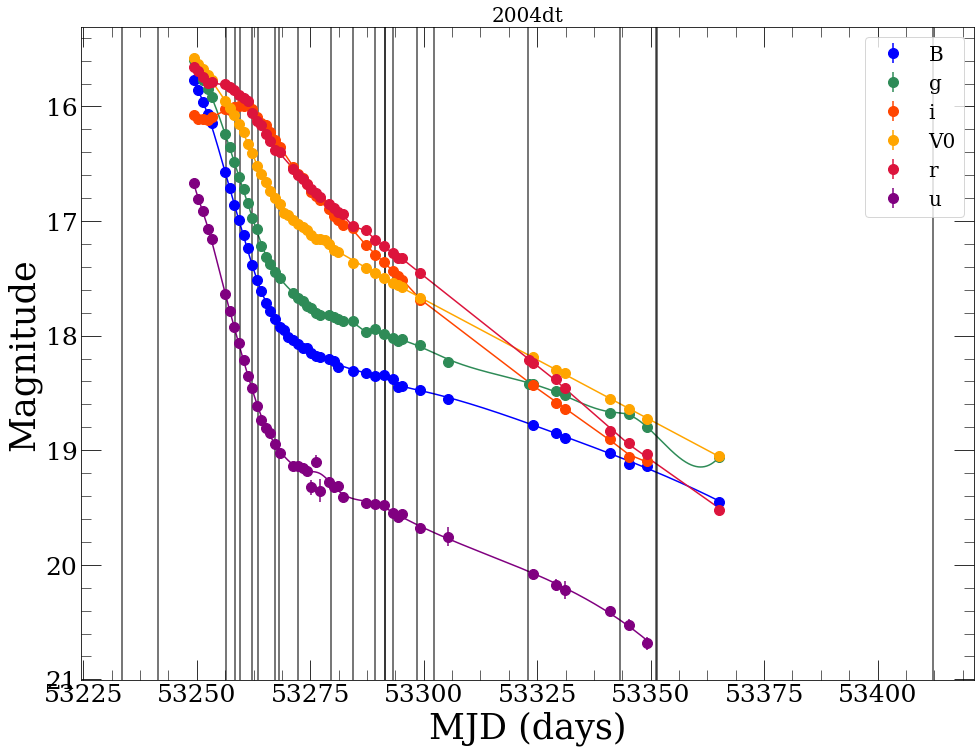

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


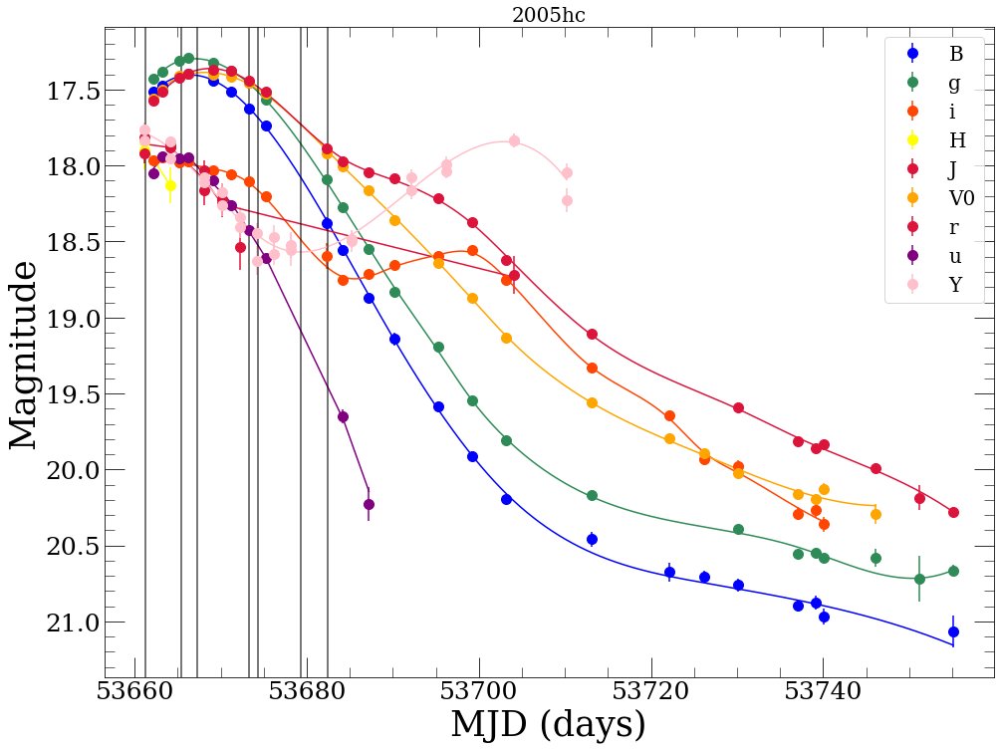

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


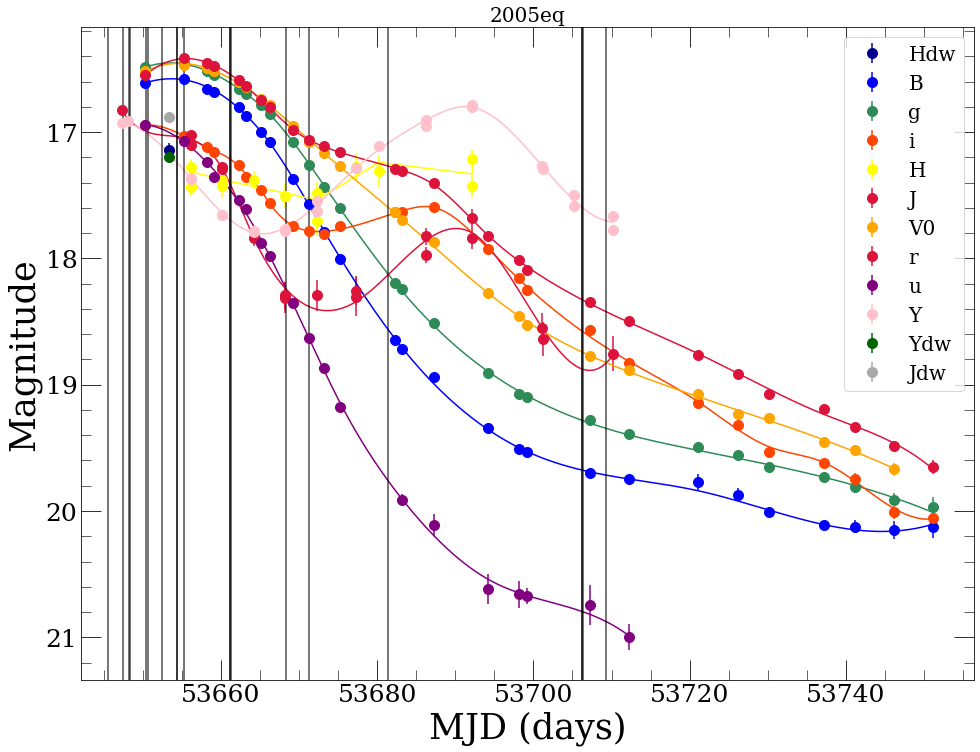

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


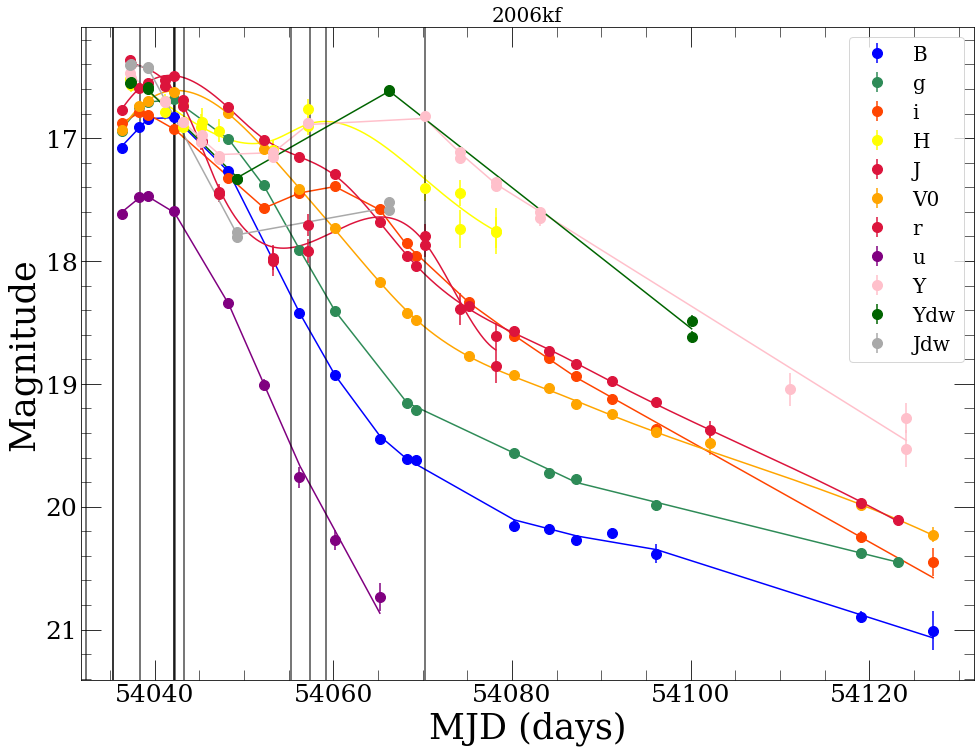

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


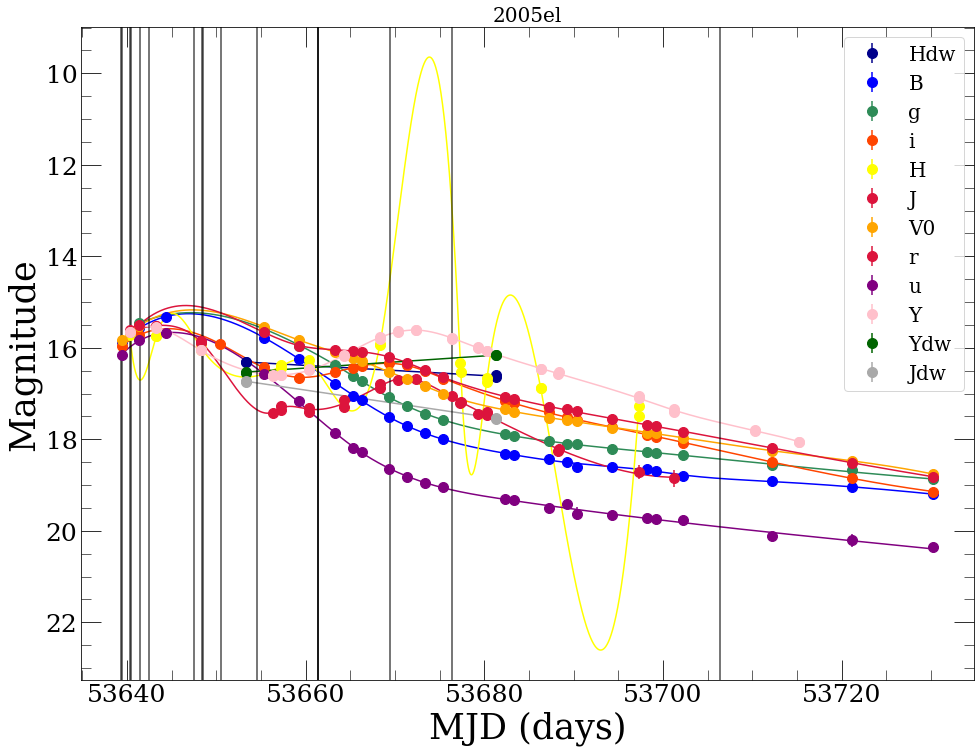

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


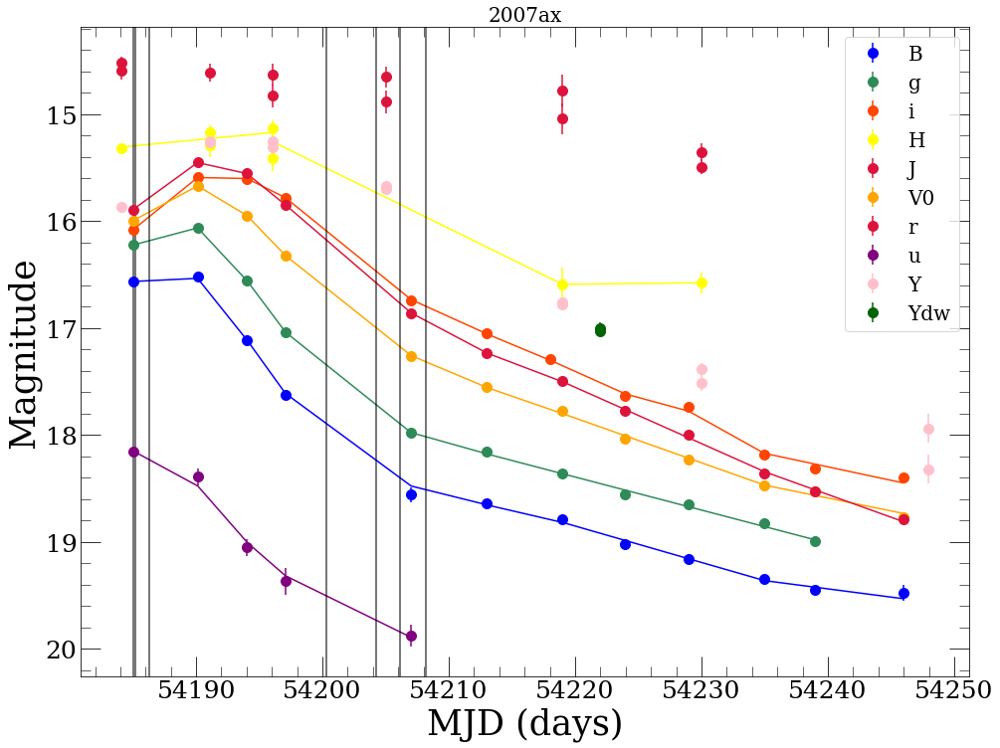

No light curve info!
No light curve info!
No light curve info!
No light curve info!


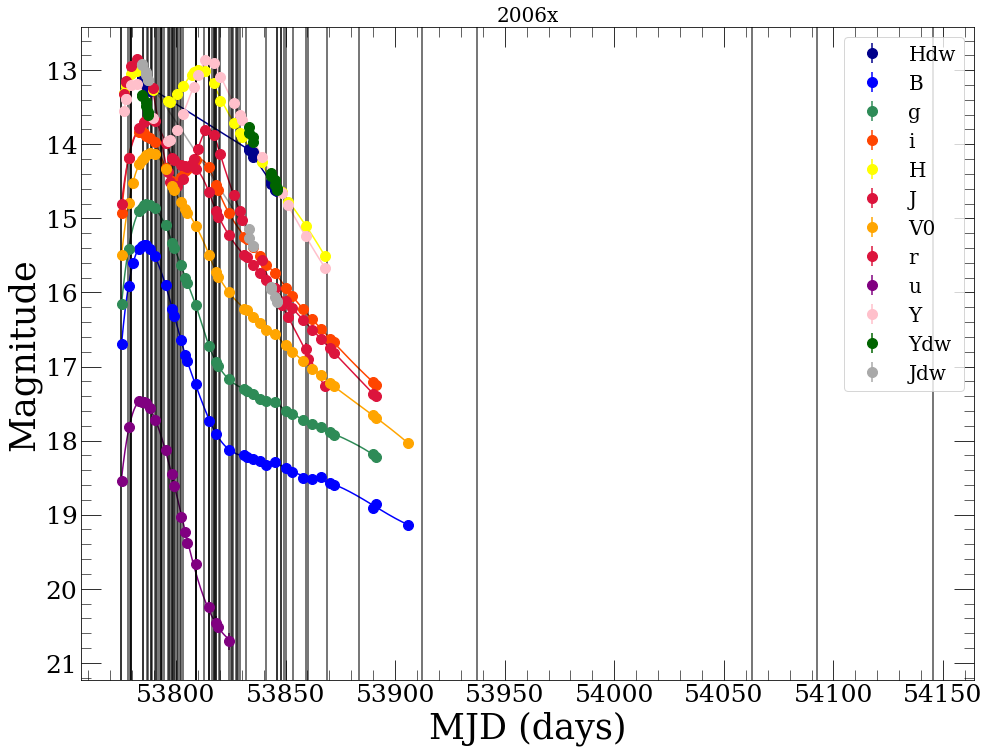

No light curve info!
No light curve info!


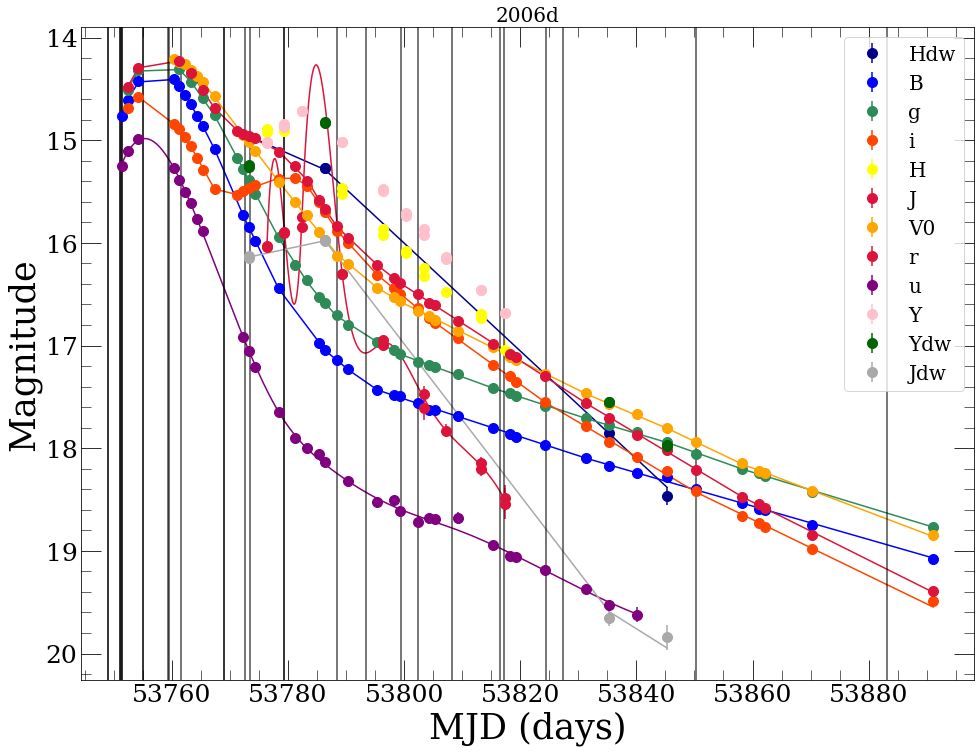

No light curve info!
No light curve info!


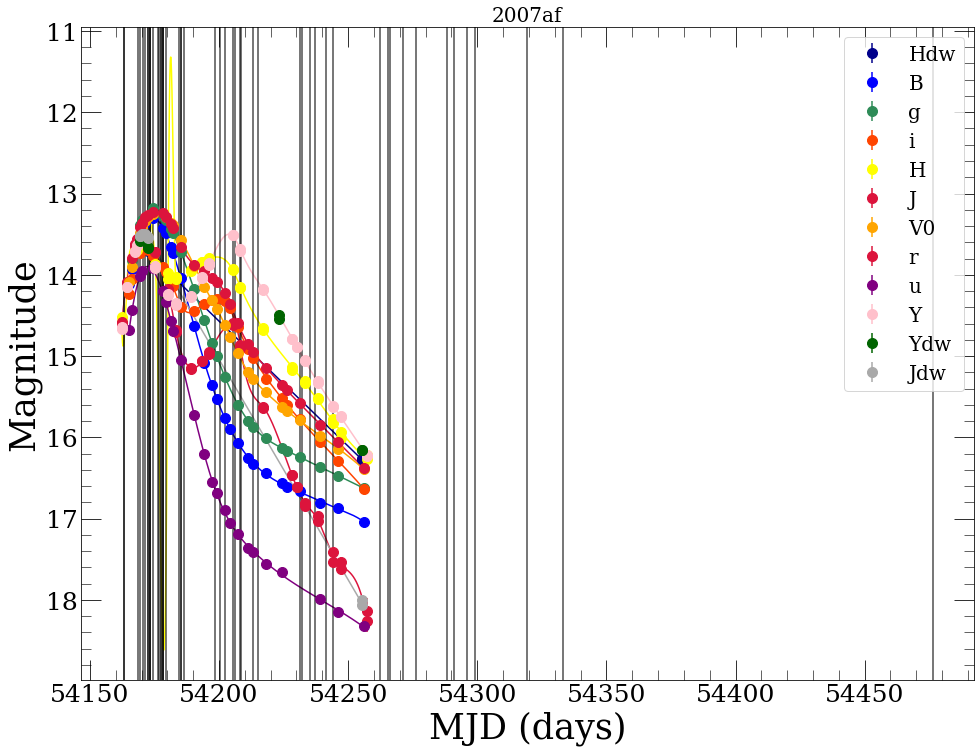

No light curve info!


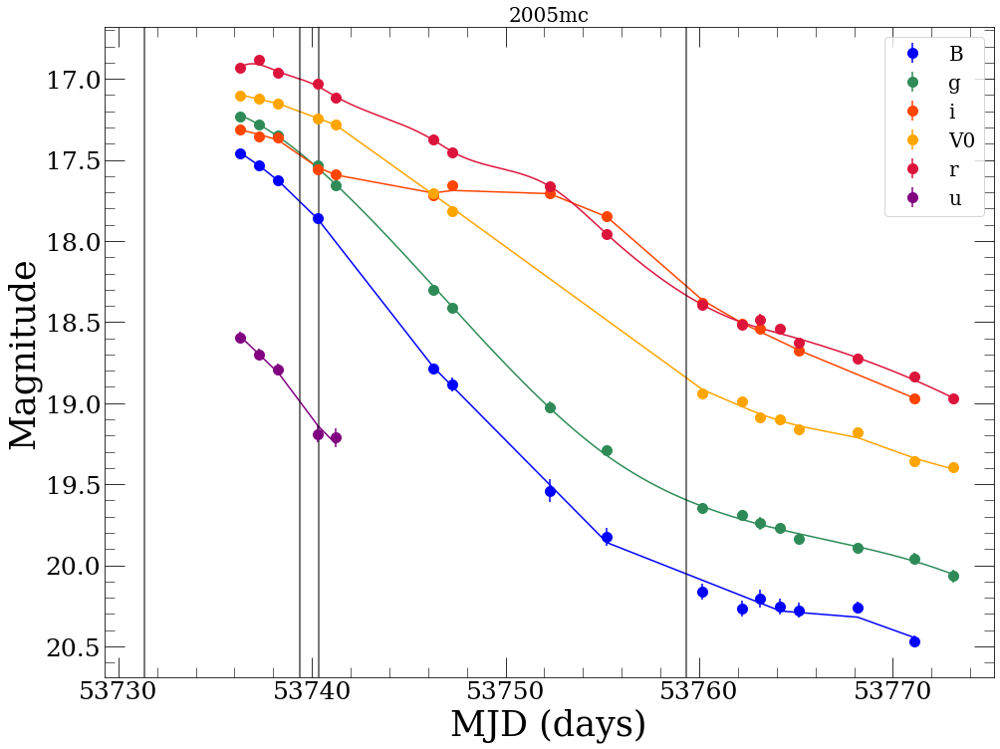

No light curve info!
No light curve info!


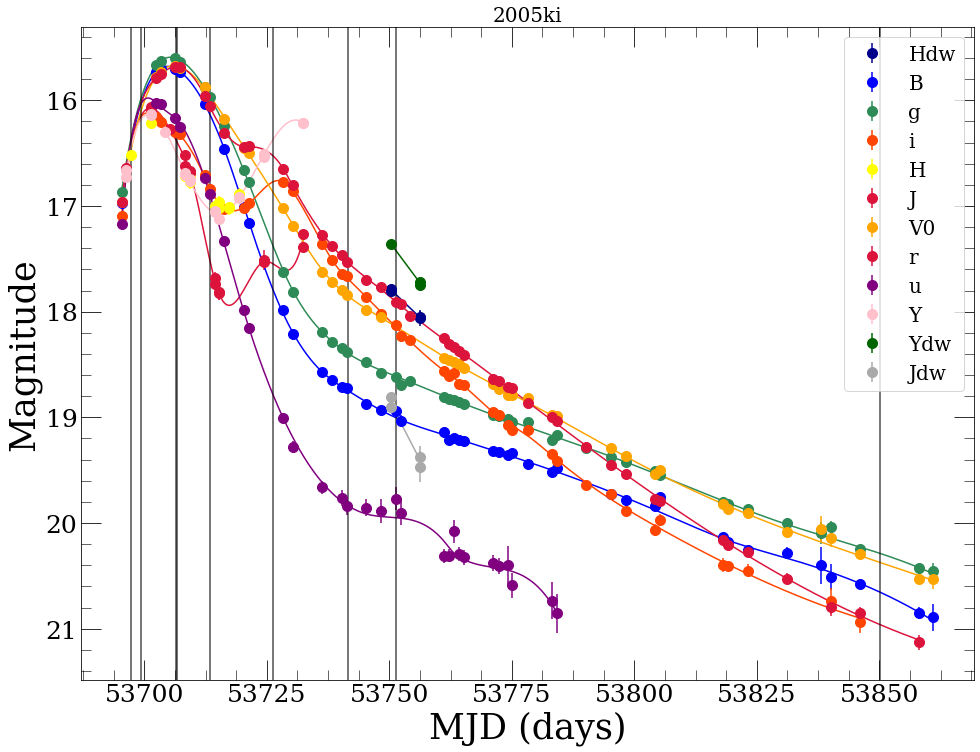

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


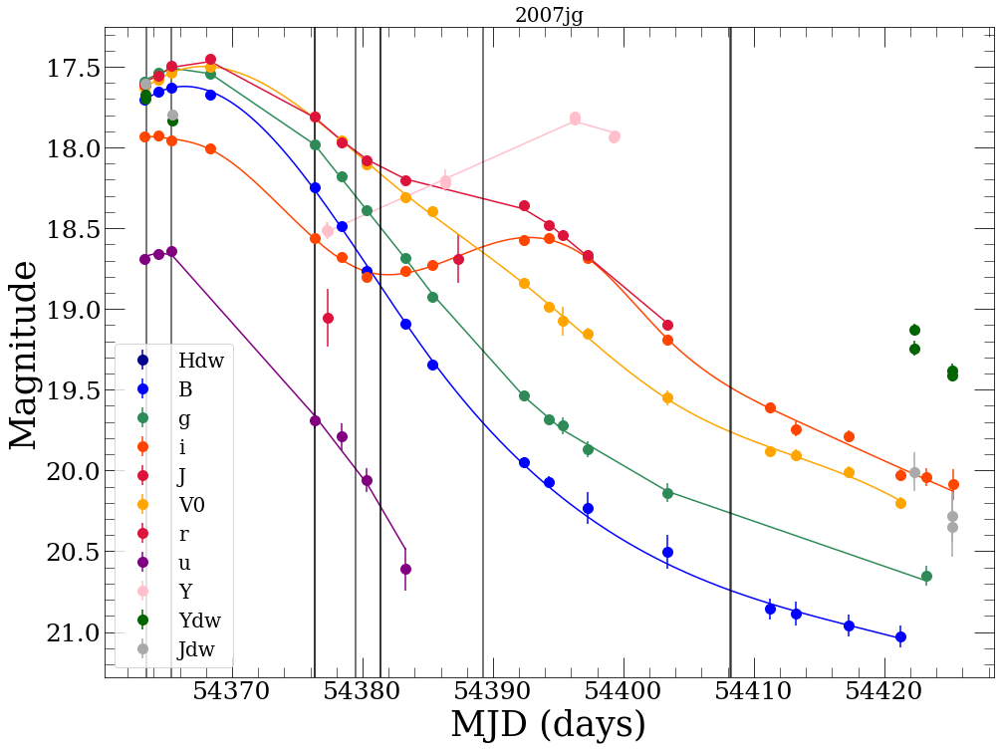

No light curve info!
No light curve info!
No light curve info!


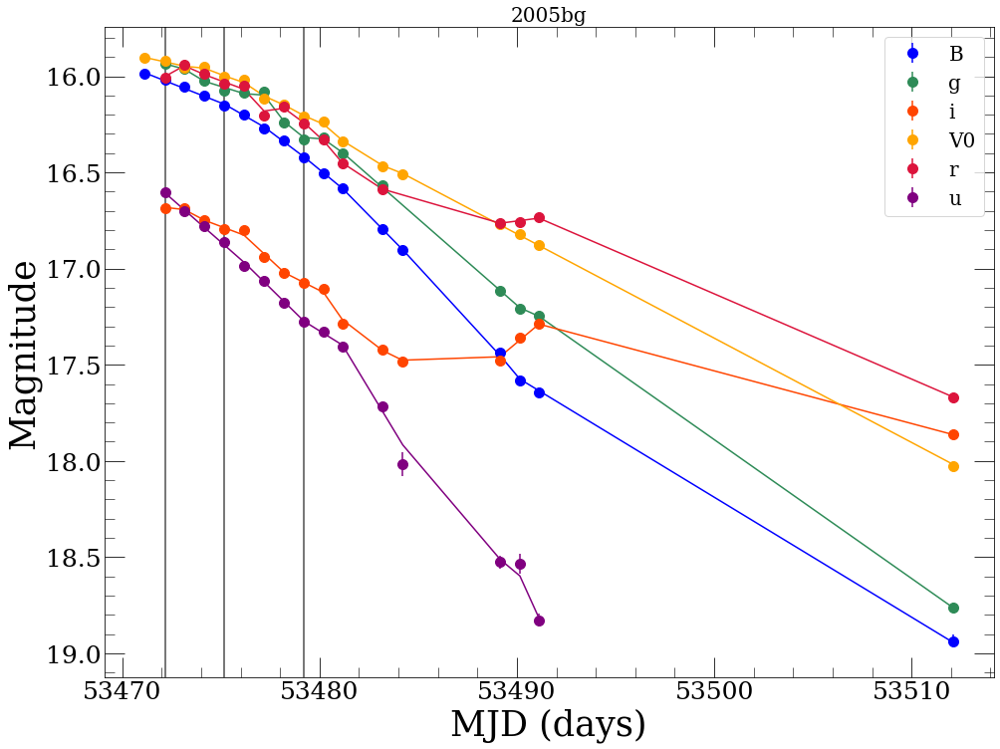

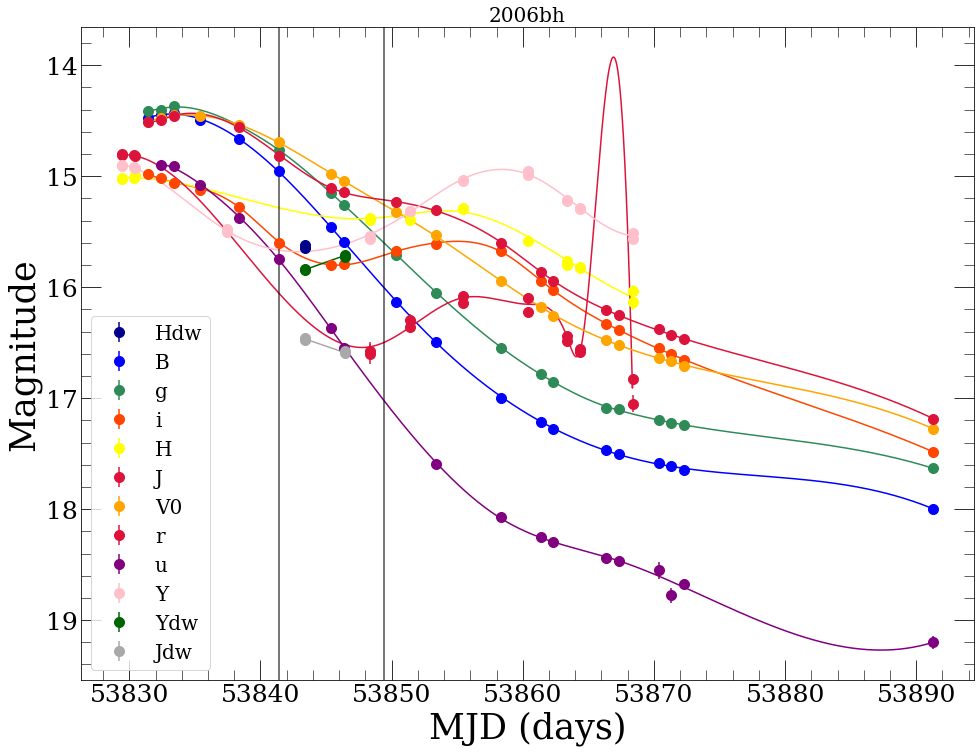

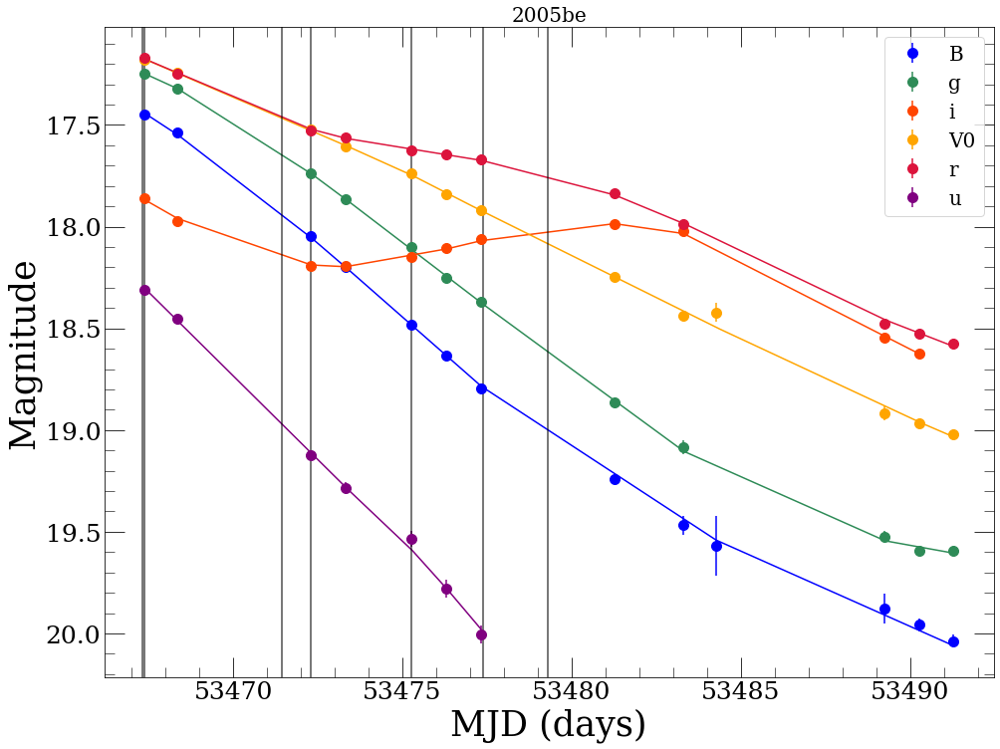

No light curve info!
No light curve info!
No light curve info!


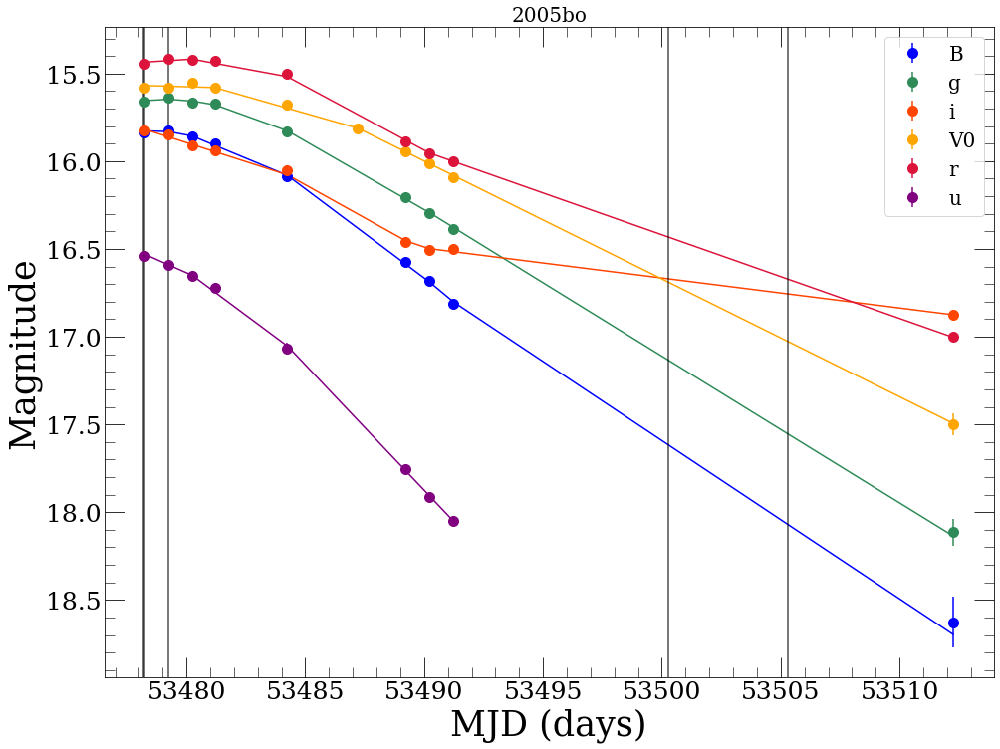

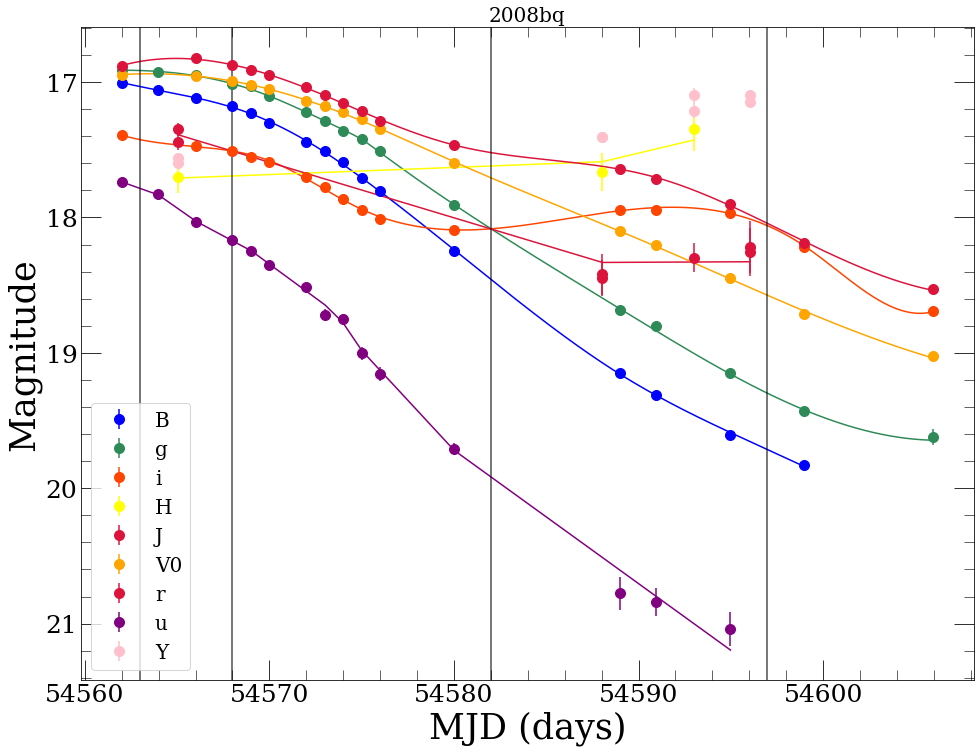

No light curve info!


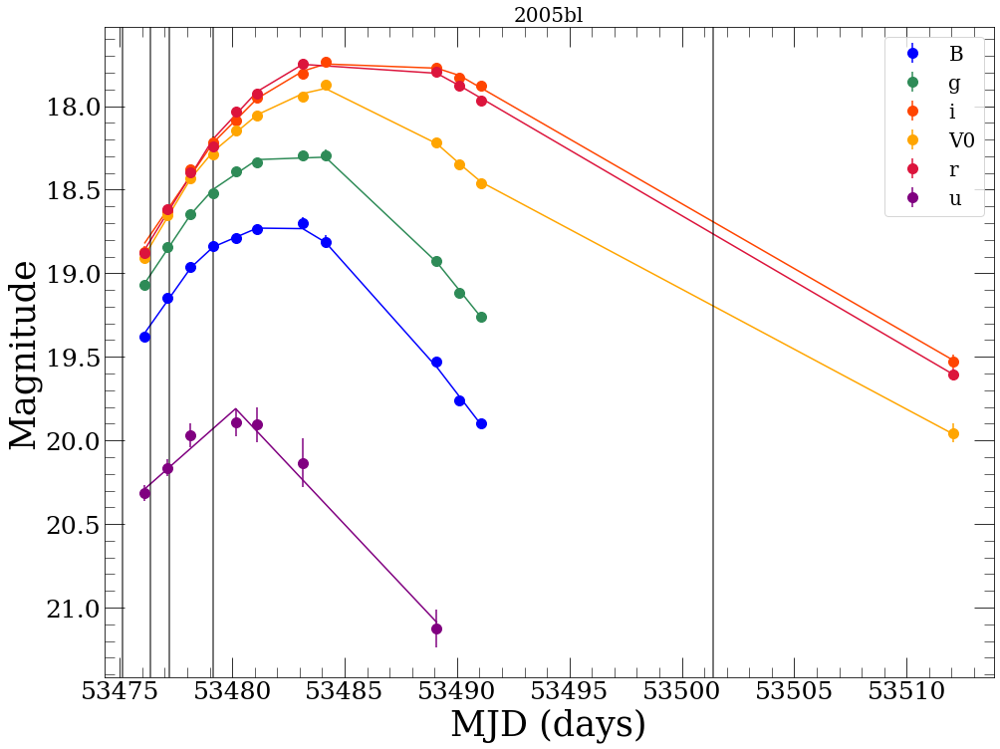

No light curve info!


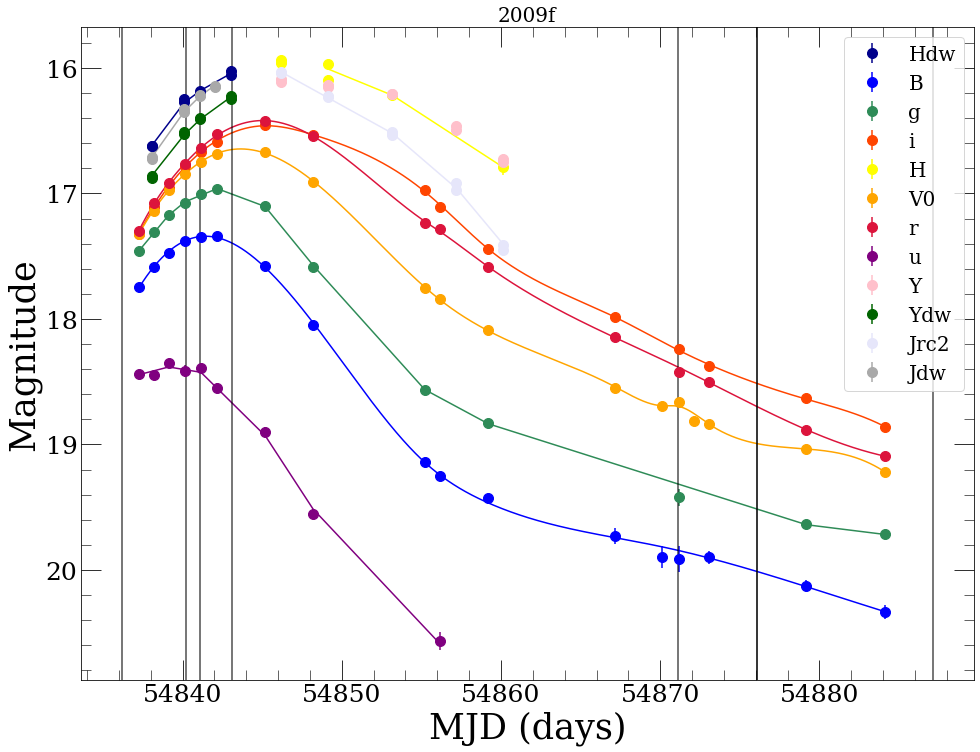

No light curve info!
No light curve info!
No light curve info!


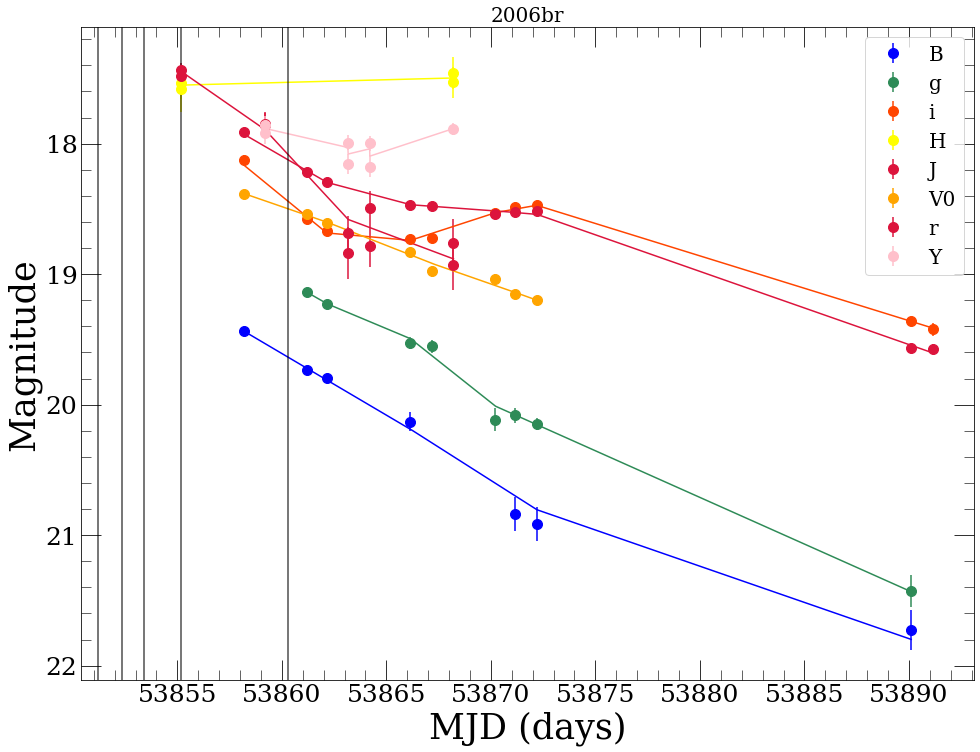

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


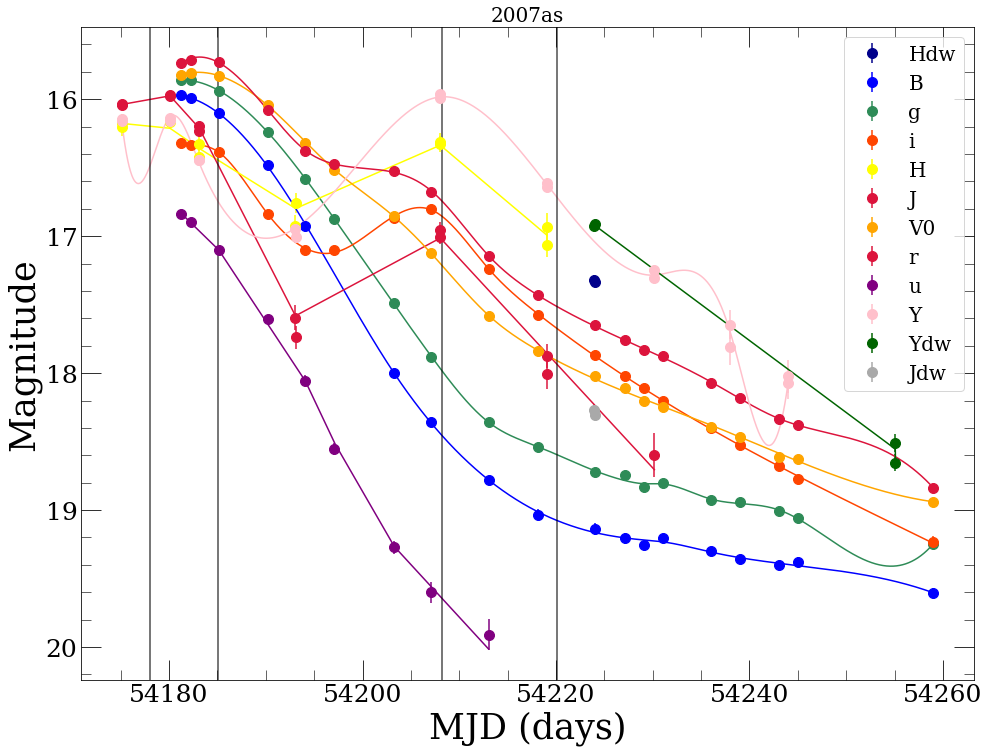

No light curve info!


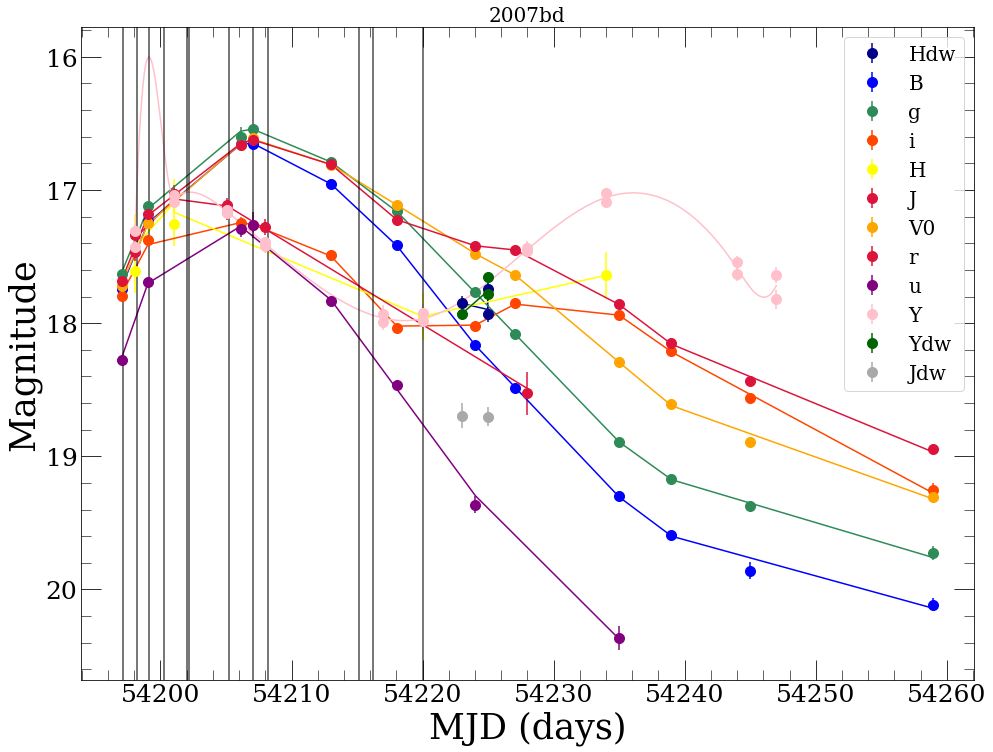

No light curve info!
No light curve info!
No light curve info!


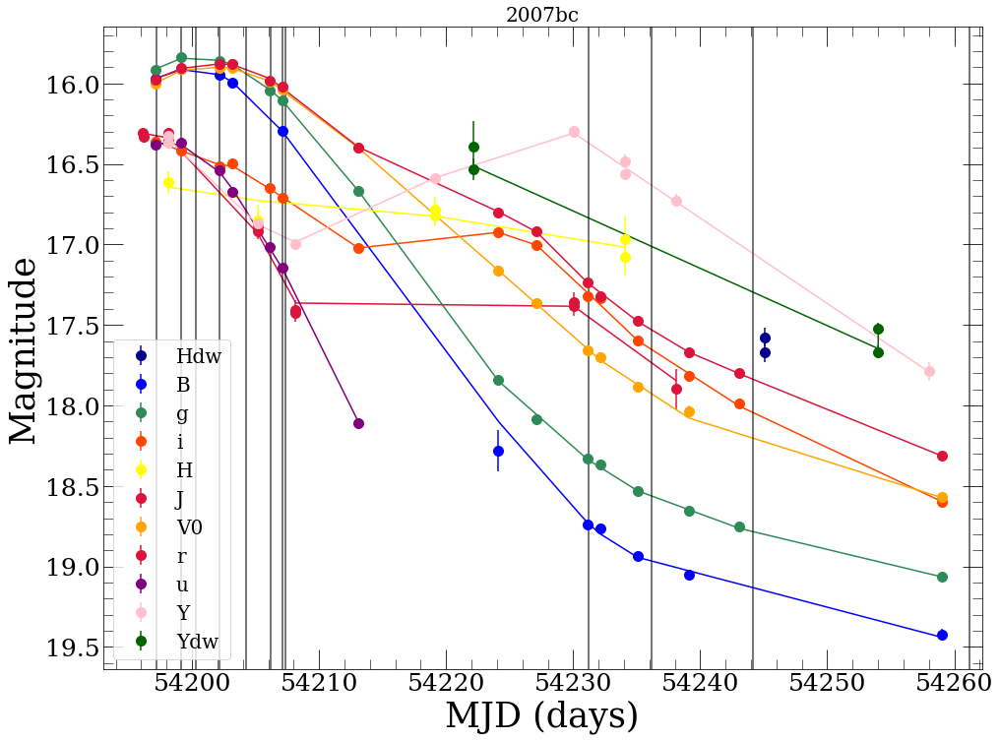

No light curve info!


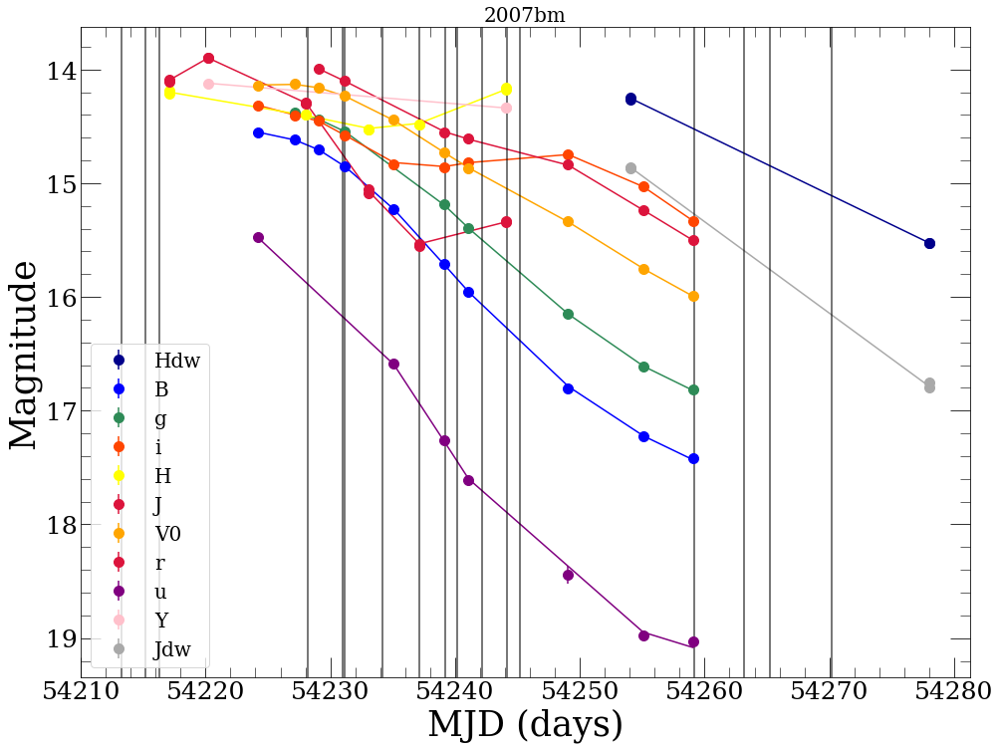

No light curve info!
No light curve info!
No light curve info!
No light curve info!
No light curve info!


In [143]:
for i, sn in enumerate(lcs.keys()):
    phot = lcs[sn]
    if phot is not None:
#         if sn == '2007le':
        fc.plot_light_curves(phot, sn, spec_dates = mjds[sn], fit=True)
    else:
        print "No light curve info!"

In [51]:
from pyphot import (unit, Filter)

In [ ]:
wave = [4499, 4500, 4700, 4701] * unit['AA']
transmit = [0., 1., 1., 0.]
tophat = Filter(wave, transmit, name='tophat', dtype='photon', unit='Angstrom')
flux_tophat = tophat.get_flux(wavelength, flux)

In [117]:
import composite

In [149]:
query_test = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN = '2004ef'"
spec_array_test = kpora.grab(query_test, multi_epoch = True, make_corr = True, verbose=True, db_file = '../data/kaepora_v1.db')
# spec_array_dered_test = kpora.host_dereddening(spec_array_test, verbose=False, cutoff=2.)

31 Total Spectra found
2 flagged spectra removed 29 spectra left
0 spectra of peculiar Ias removed 29 spectra left
29 spectra of SNe that have host reddening corrections
Arrays cleaned
Name Filename Source SNR Phase MJD MJD_max z Host Morphology Minwave Maxwave
2004ef sn2004ef-20040910.310-ui-corrected.flm bsnip 50.7512194353 -5.1019170987 53258.31 53263.57 0.030985 12.0 3264.0 10134.0
2004ef sn2004ef-20040924.302-ui-corrected.flm bsnip 16.6619407908 8.46957036233 53272.302 53263.57 0.030985 12.0 3274.0 10134.0
2004ef sn2004ef-20041013.373-ui-corrected.flm bsnip 1.48414148279 26.9674146569 53291.373 53263.57 0.030985 12.0 3646.0 9820.0
2004ef sn2004ef-20041018-br-corrected.flm bsnip 50.9171754968 31.645465259 53296.196 53263.57 0.030985 12.0 3030.0 9066.0
2004ef sn2004ef-20041114-br.flm bsnip 7.67355545718 57.6439036455 53323.0 53263.57 0.030985 12.0 3196.0 9066.0
2004ef sn2004ef-20041212.217-br.flm bsnip 18.9679898653 85.012876036 53351.217 53263.57 0.030985 12.0 3158.0 8988.0
2004ef 

In [150]:
for spec in spec_array_test:
    spec = fc.undo_MW_correction(spec)

In [151]:
spec_array_test = composite.prelim_norm(spec_array_test)
for spec in spec_array_test:
    vbs = fc.valid_bands(spec)
    scale, mags_from_phot = fc.scale_flux_to_photometry(spec, vbs)
    if ~np.isnan(scale):
        spec.scale_to_phot = scale
    else:
        spec.scale_to_phot = None

1.203124999999968e-15 {'i': 17.24777749926957, 'B': 17.367618673796226, 'r': 17.230944109905053, 'g': 17.458550199470466} {'i': 17.423364651862638, 'r': 17.2135730667933, 'B': 17.379467846456503, 'g': 17.282441363648832}


9.765624999999674e-16 {'i': 17.70224913233024, 'B': 17.609632748674553, 'r': 17.113614034164826, 'g': 17.478347814511594} {'i': 17.831809784108795, 'r': 17.114694559975142, 'B': 17.60709203197237, 'g': 17.345055027012517}
1.0390624999999676e-15 {'i': 18.548531752104747, 'r': 17.575691303135535} {'i': 18.06988678822795, 'r': 18.050928862618726}


2.0507812499996447e-16 {'i': 18.26058226318065, 'B': 20.01685111336798, 'r': 18.413489890413302, 'g': 19.728961712437993} {'i': 18.473714534888316, 'r': 18.370477523526088, 'B': 20.004085799295183, 'g': 19.58877992757571}
2.4023437499996456e-16 {'i': 19.455246445668475, 'r': 19.427967833800295, 'g': 20.26530270515743} {'i': 19.68908452791232, 'r': 19.32087189341241, 'B': nan, 'g': 20.15002276169999}
nan mjd of spectrum outside photometric coverage


1.1171874999999676e-15 {'B': 17.960511662482464, 'r': 17.60657188799025, 'g': 17.988585019545603} {'r': 17.775290913118024, 'B': 17.94396317082705, 'g': 17.82926731820013}
2.062499999999971e-15 {'B': 17.728579147627524, 'r': 17.385634370271575, 'g': 17.79706641982512} {'r': 17.54636659793983, 'B': 17.711381157085572, 'g': 17.605348141027847}
1.4999999999999692e-15 {'B': 17.533697982728373, 'r': 17.27188615980525, 'g': 17.577256963846352} {'r': 17.378309327793968, 'B': 17.54464629795374, 'g': 17.44398577639711}


1.203124999999968e-15 {'B': 17.38099636985061, 'r': 17.103025499895956, 'g': 17.41086436356934} {'r': 17.218933233039344, 'B': 17.384970427703347, 'g': 17.287869002680452}
1.2812499999999683e-15 {'B': 17.232287033705855, 'r': 16.97776630418641, 'g': 17.289955781032532} {'r': 17.094923204164246, 'B': 17.25515421090208, 'g': 17.158269831370404}
1.3749999999999687e-15 {'B': 17.16886457751873, 'r': 16.89958926140671, 'g': 17.219470185954584} {'r': 17.013132716787297, 'B': 17.169926467311896, 'g': 17.069913443507808}


1.4999999999999692e-15 {'B': 17.07298998970695, 'r': 16.74771061818987, 'g': 17.1081250174174} {'r': 16.893315246009553, 'B': 17.073849955741757, 'g': 16.957165870819527}
1.6249999999999696e-15 {'B': 17.018327628314, 'r': 16.74800524525844, 'g': 17.056307562031463} {'r': 16.84385077128482, 'B': 17.057873711356365, 'g': 16.927551431957628}


1.515624999999969e-15 {'B': 17.033896523040244, 'r': 16.697702325462224, 'g': 17.05279430222121} {'r': 16.813507122493093, 'B': 17.06358522697174, 'g': 16.921509986907235}
1.5312499999999692e-15 {'B': 17.04612954939582, 'r': 16.68541724299967, 'g': 17.05048243712283} {'r': 16.800282726927684, 'B': 17.08187900190519, 'g': 16.931736829926113}
1.7656249999999702e-15 {'B': 17.07492489262945, 'r': 16.71732039676254, 'g': 17.067051182005983} {'r': 16.802031659435286, 'B': 17.113371741577783, 'g': 16.9576289105069}


1.0937499999999677e-15 {'B': 17.374821576128735, 'r': 16.876647857188388, 'g': 17.29557536100164} {'r': 16.968361594180887, 'B': 17.399439095209914, 'g': 17.173239724668512}
4.531249999999653e-16 {'B': 18.991486473714144, 'r': 17.547590373022544, 'g': 18.72174693362779} {'r': 17.541798397964584, 'B': 19.082953835114022, 'g': 18.632100225589703}


3.1249999999996485e-16 {'B': 19.524347998179227, 'r': 17.963288181272844, 'g': 19.275218406001486} {'r': 17.94117056196887, 'B': 19.628119799200547, 'g': 19.20123116284427}
3.710937499999651e-16 {'B': 19.8712102361534, 'r': 18.62651188370579, 'g': 19.71088785667237} {'r': 18.462759472922833, 'B': 20.069003764156825, 'g': 19.673915023465526}
nan mjd of spectrum outside photometric coverage


1.515624999999969e-15 {'B': 17.39256868035014, 'g': 17.57694199638307} {'B': 17.53949781827471, 'g': 17.43898317711662}
1.3124999999999684e-15 {'i': 17.304008349468592, 'r': 16.922403654095994} {'i': 17.330443648132903, 'r': 16.896945513584033}
1.1249999999999678e-15 {'i': 17.37037298271269, 'r': 16.855819194045573} {'i': 17.38066176168095, 'r': 16.815912656898625}
1.2187499999999682e-15 {'i': 17.425035056840738, 'r': 16.87231302212912} {'i': 17.434313875998022, 'r': 16.852111542967723}


1.445312499999969e-15 {'i': 18.54713469353401, 'B': 20.077128700552922, 'r': 18.782873569896935, 'g': 19.991561459593854} {'i': 18.80409161134467, 'r': 18.61879212623277, 'B': 20.172081809657847, 'g': 19.799494521520923}


In [152]:
for spec in spec_array_test:
    print spec.scale_to_phot

1.203124999999968e-15
9.765624999999674e-16
1.0390624999999676e-15
2.0507812499996447e-16
2.4023437499996456e-16
None
1.1171874999999676e-15
2.062499999999971e-15
1.4999999999999692e-15
1.203124999999968e-15
1.2812499999999683e-15
1.3749999999999687e-15
1.4999999999999692e-15
1.6249999999999696e-15
1.515624999999969e-15
1.5312499999999692e-15
1.7656249999999702e-15
1.0937499999999677e-15
4.531249999999653e-16
3.1249999999996485e-16
3.710937499999651e-16
None
None
1.515624999999969e-15
None
1.3124999999999684e-15
1.1249999999999678e-15
1.2187499999999682e-15
1.445312499999969e-15


-8.021455210305483 57.64390364554313


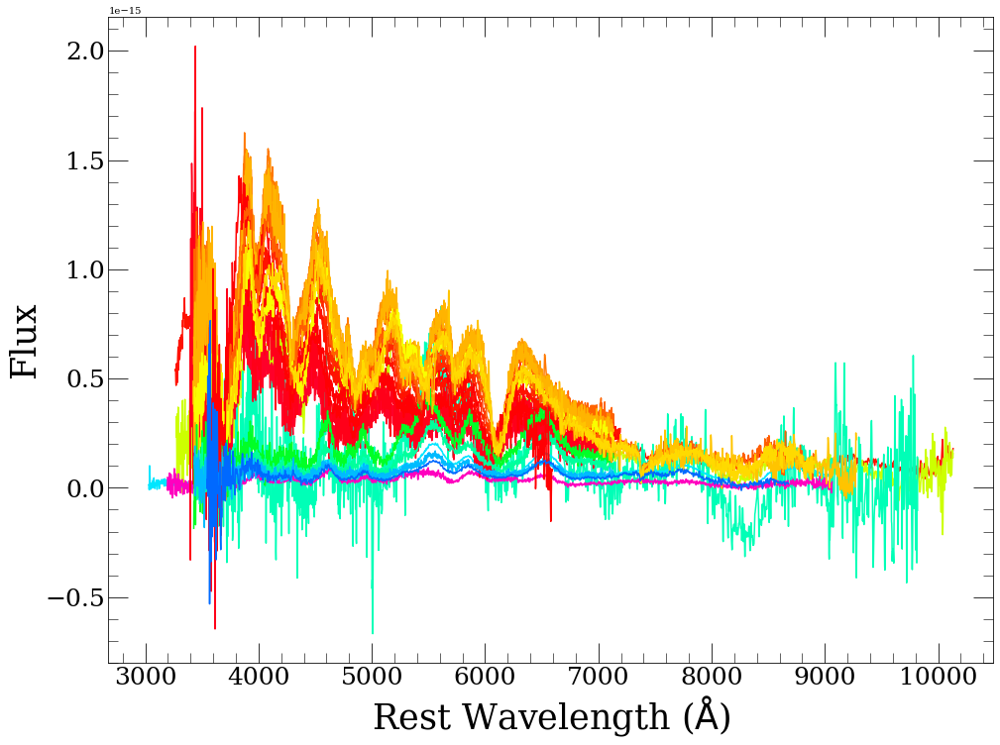

In [153]:
fc.plot_calibrated_spectra(spec_array_test)

In [154]:
all_query = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN"
spec_array_all = kpora.grab(all_query, multi_epoch = True, make_corr = True, verbose=True, db_file = '../data/kaepora_v1.db')

4975 Total Spectra found
128 flagged spectra removed 4847 spectra left
109 spectra of peculiar Ias removed 4738 spectra left
3433 spectra of SNe that have host reddening corrections
Arrays cleaned
Name Filename Source SNR Phase MJD MJD_max z Host Morphology Minwave Maxwave
1989b sn1989b-19890221.flm bsnip 12.070823537 13.455370726 47578.0 47564.512 0.002425 12.0 3494.0 6932.0
1989b sn1989b-19890427-o1i1.flm bsnip 56.3399611556 78.2981270419 47643.0 47564.512 0.002425 12.0 3346.0 8978.0
1989b sn1989b-19890710-o.flm bsnip 14.0949846812 152.119111155 47717.0 47564.512 0.002425 12.0 3944.0 6160.0
1990n sn1990n-19900717-oi.flm bsnip 196.252213907 7.33808719397 48089.0 48081.637 0.003395 13.0 3960.0 9788.0
1990n sn1990n-19900731-oi.flm bsnip 246.978555483 21.4830649943 48103.193 48081.637 0.003395 13.0 3940.0 9816.0
1990n sn1990n-19900829-oi.flm bsnip 64.1857438142 50.3450784586 48132.153 48081.637 0.003395 13.0 3980.0 9766.0
1990n sn1990n-19900830-ir2.flm bsnip 47.2109537391 51.1892126231 4

2001en sn2001en-20011020-ui-corrected.flm bsnip 69.1626464337 10.9246154285 52202.453 52191.355 0.015871 12.0 3302.0 10186.0
2001en sn2001en-20011025-ui-corrected.flm bsnip 62.7140709482 15.5502027324 52207.152 52191.355 0.015871 12.0 3282.0 10186.0
2001en sn2001en-20011115-ui.flm bsnip 31.1016950673 36.4721504994 52228.406 52191.355 0.015871 12.0 3282.0 10186.0
2001ep sn2001ep-20011020-ui-corrected.flm bsnip 125.594532268 2.68475189241 52202.47 52199.75 0.013129 12.0 3310.0 10214.0
2001ep sn2001ep-20011022.654-joined-corrected.flm bsnip 67.5195519486 4.84044973543 52204.654 52199.75 0.013129 12.0 3932.0 10016.0
2001ep sn2001ep-20011023.652-joined-corrected.flm bsnip 115.301377473 5.82551679007 52205.652 52199.75 0.013129 12.0 3932.0 10016.0
2001ep sn2001ep-20011025-ui-corrected.flm bsnip 64.5866213848 7.70484311474 52207.556 52199.75 0.013129 12.0 3290.0 10214.0
2001ep sn2001ep-20011115-ui.flm bsnip 56.8052566269 28.3063657244 52228.428 52199.75 0.013129 12.0 3290.0 10214.0
2001ep sn2

2005ke sn2005ke-20051209.363-ui.flm bsnip 23.2880844794 14.0872541995 53713.363 53699.207 0.00488 10.0 3370.0 10498.0
2005ke sn2005ke-20060105.242-ui.flm bsnip 11.2169348012 40.8357216782 53740.242 53699.207 0.00488 10.0 3346.0 10398.0
2005ke sn2005ke-20060123.221-ui.flm bsnip 3.93694531636 58.727410238 53758.221 53699.207 0.00488 10.0 3352.0 10498.0
2005ke sn2005ke-20061123.377-br.flm bsnip 1.61687478175 361.406337075 54062.377 53699.207 0.00488 10.0 3104.0 9154.0
2005ki sn2005ki-20051202.649-deimos.flm bsnip 229.40842933 1.25784065455 53706.649 53705.367 0.019207 8.0 3830.0 8846.0
2005ki sn2005ki-20051209.514-ui.flm bsnip 22.820997516 7.99346943261 53713.514 53705.367 0.019207 8.0 3310.0 10350.0
2005ki sn2005ki-20060106.498-ui.flm bsnip 5.17027243413 35.4501097422 53741.498 53705.367 0.019207 8.0 3300.0 10252.0
2005ls sn2005ls-20060106.246-ui.flm bsnip 15.170073414 26.016581825 53741.246 53714.68 0.021118 None 3294.0 10232.0
2005ls sn2005ls-20060130.220-ui.flm bsnip 2.53403413516 49.

2007cq sn2007cq-20070814.346-ui-corrected.flm bsnip 23.3075581789 44.5653868642 54326.346 54280.613 0.0262 None 3572.0 9986.0
2007f sn2007f-20070113.658-br.flm bsnip 146.454565596 -9.42466278035 54113.658 54123.305 0.023591 15.0 3294.0 8990.0
2007f sn2007f-20070126.534-ui.flm bsnip 73.1916291229 3.15458029623 54126.534 54123.305 0.023591 15.0 3306.0 10208.0
2007f sn2007f-20070218.420-ui.flm bsnip 42.0527828497 25.5131199864 54149.42 54123.305 0.023591 15.0 3310.0 10208.0
2007f sn2007f-20070317.636-deimos.flm bsnip 62.4799026314 52.101864905 54176.636 54123.305 0.023591 15.0 4444.0 9308.0
2007if sn2007if-20071015.393-br.flm bsnip 39.0650927947 42.591696146 54388.393 54342.641 0.0742 None 3032.0 8528.0
2007if sn2007if-20071112.204-br.flm bsnip 35.5102014346 68.4816607708 54416.204 54342.641 0.0742 None 2974.0 8486.0
2007if sn2007if-20071213.245-br.flm bsnip 21.1971454652 97.3785142432 54447.245 54342.641 0.0742 None 3098.0 8468.0
2007le sn2007le-20071015.325-br-corrected.flm bsnip 97.314

1996x sn1996X-19960420.31-fast.flm cfa 129.573209954 2.38741937245 50193.31 50190.906 0.006945 2.0 3728.0 7452.0
1996x sn1996X-19960425.29-fast.flm cfa 72.514533029 7.33307181623 50198.29 50190.906 0.006945 2.0 3728.0 7450.0
1996x sn1996X-19960426.28-fast.flm cfa 97.1371753646 8.31624368759 50199.28 50190.906 0.006945 2.0 3728.0 7450.0
1996x sn1996X-19960508.26-fast.flm cfa 105.533910377 20.2136164339 50211.26 50190.906 0.006945 2.0 3728.0 7450.0
1996x sn1996X-19960510.25-fast.flm cfa 93.530811258 22.1898912056 50213.25 50190.906 0.006945 2.0 3728.0 7452.0
1996x sn1996X-19960516.24-fast.flm cfa 104.376097127 28.1385775787 50219.24 50190.906 0.006945 2.0 3728.0 7456.0
1996x sn1996X-19960521.22-fast.flm cfa 73.6578852781 33.0842300225 50224.22 50190.906 0.006945 2.0 3728.0 7456.0
1996x sn1996X-19960606.19-fast.flm cfa 47.9083934331 48.9440833412 50240.19 50190.906 0.006945 2.0 3728.0 7454.0
1996x sn1996X-19960615.28-fast.flm cfa 25.8467819489 57.9713887054 50249.28 50190.906 0.006945 2.0

1998de sn1998de-19980726.47-fast.flm cfa 42.2220302713 -6.3012127252 51020.47 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980727.45-fast.flm cfa 31.8277271964 -5.33709274539 51021.45 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980729.50-fast.flm cfa 17.5955934411 -3.32031115497 51023.5 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980730.46-fast.flm cfa 26.1212642122 -2.37586709311 51024.46 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980801.41-fast.flm cfa 29.4215989591 -0.457465092459 51026.41 51026.875 0.016471 8.0 3712.0 7368.0
1998de sn1998de-19980804.46-fast.flm cfa 35.5825376881 2.54311239573 51029.46 51026.875 0.016471 8.0 3712.0 7368.0
1998dh sn1998dh-19980726.44-fast.flm cfa 93.6284727383 -9.00622318426 51020.44 51029.527 0.008969 13.0 3740.0 7422.0
1998dh sn1998dh-19980727.40-fast.flm cfa 103.342721897 -8.05475688549 51021.4 51029.527 0.008969 13.0 3740.0 7422.0
1998dh sn1998dh-19980728.40-fast.flm cfa 73.0234536929 -7.06364615761 510

1999da sn1999da-19990709.45-fast.flm cfa 16.9107983888 -2.60690533675 51368.45 51371.09 0.012695 1.0 3726.0 7394.0
1999dq sn1999dq-19990904.48-fast.flm cfa 178.987425238 -9.52059838691 51425.48 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990905.45-fast.flm cfa 202.564961509 -8.56429928416 51426.45 51435.137 0.014327 14.0 3386.0 8862.0
1999dq sn1999dq-19990906.43-fast.flm cfa 135.191117796 -7.59814142777 51427.43 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990907.48-fast.flm cfa 211.207736349 -6.56297229592 51428.48 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990908.48-fast.flm cfa 145.098947492 -5.57709693225 51429.48 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990909.44-fast.flm cfa 67.3767726774 -4.63065658313 51430.44 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990910.44-fast.flm cfa 61.9317989496 -3.64478121947 51431.44 51435.137 0.014327 14.0 3720.0 7382.0
1999dq sn1999dq-19990911.46-fast.flm cfa 168.120518193 -2.63918834

2001en sn2001en-20011024.25-fast.flm cfa 57.6499949829 14.6622947205 52206.25 52191.355 0.015871 12.0 3714.0 7372.0
2001en sn2001en-20011117.19-fast.flm cfa 36.2763711063 38.2282789842 52230.19 52191.355 0.015871 12.0 3714.0 7372.0
2001ep sn2001ep-20011010.49-fast.flm cfa 60.2948647974 -7.16591865399 52192.49 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011014.45-fast.flm cfa 98.7860311866 -3.25723575182 52196.45 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011015.45-fast.flm cfa 106.669649074 -2.2701946149 52197.45 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011016.45-fast.flm cfa 95.2957190283 -1.28315347799 52198.45 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011017.42-fast.flm cfa 108.099963513 -0.325723575183 52199.42 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011018.43-fast.flm cfa 106.658020508 0.671187973101 52200.43 52199.75 0.013129 12.0 3724.0 7392.0
2001ep sn2001ep-20011019.44-fast.flm cfa 105.161646537 1.66809952139 522

2002bo sn2002bo-20020404.37-fast.flm cfa 96.6636001737 11.8397992512 52368.37 52356.48 0.00424 19.0 3758.0 7458.0
2002bo sn2002bo-20020405.23-fast.flm cfa 124.739262531 12.6961682466 52369.23 52356.48 0.00424 19.0 3758.0 7458.0
2002bo sn2002bo-20020406.23-fast.flm cfa 129.979813533 13.6919461483 52370.23 52356.48 0.00424 19.0 3758.0 7458.0
2002bo sn2002bo-20020407.30-fast.flm cfa 97.4576821551 14.7574285031 52371.3 52356.48 0.00424 19.0 3758.0 7438.0
2002bo sn2002bo-20020408.20-fast.flm cfa 114.182908658 15.6536286147 52372.2 52356.48 0.00424 19.0 3758.0 7438.0
2002bo sn2002bo-20020409.20-fast.flm cfa 109.43952722 16.6494065164 52373.2 52356.48 0.00424 19.0 3758.0 7458.0
2002bo sn2002bo-20020410.27-fast.flm cfa 93.0104970561 17.7148888712 52374.27 52356.48 0.00424 19.0 3758.0 7458.0
2002bo sn2002bo-20020411.19-fast.flm cfa 107.430731058 18.6310045407 52375.19 52356.48 0.00424 19.0 3758.0 7458.0
2002bo sn2002bo-20020412.24-fast.flm cfa 116.029623051 19.6765713375 52376.24 52356.48 0.004

2003ae sn2003ae-20030209.37-fast.flm cfa 23.2473936876 None None 52664.914 0.032857 None 3654.0 7250.0
2003ae sn2003ae-20030210.34-fast.flm cfa 22.1310480432 None None 52664.914 0.032857 None 3654.0 7250.0
2003ae sn2003ae-20030310.26-fast.flm cfa 19.1062412082 None None 52664.914 0.032857 None 3654.0 7250.0
2003ai sn2003ai-20030210.40-fast.flm cfa 19.7751053507 None None 52689.602 0.036177 19.0 3644.0 7226.0
2003ai sn2003ai-20030329.40-mmt.flm cfa 43.3847627196 None None 52689.602 0.036177 19.0 3142.0 7862.0
2003cg sn2003cg-20030325.24-fast.flm cfa 81.1335000873 -6.01615328693 52723.24 52729.281 0.00413 10.0 3758.0 7458.0
2003cg sn2003cg-20030326.30-fast.flm cfa 97.2548294473 -4.96051308098 52724.3 52729.281 0.00413 10.0 3758.0 7458.0
2003cg sn2003cg-20030327.27-fast.flm cfa 96.0990790713 -3.99450270384 52725.27 52729.281 0.00413 10.0 3758.0 7458.0
2003cg sn2003cg-20030328.26-fast.flm cfa 86.7315594062 -3.00857458696 52726.26 52729.281 0.00413 10.0 3758.0 7458.0
2003cg sn2003cg-2003032

2004as sn2004as-20040323.26-fast.flm cfa 59.5188872143 1.46068799763 53087.26 53085.754 0.031021 None 3662.0 7262.0
2004as sn2004as-20040324.34-fast.flm cfa 62.3287511876 2.50819333456 53088.34 53085.754 0.031021 None 3662.0 7262.0
2004as sn2004as-20040327.35-fast.flm cfa 20.420612574 5.42762950512 53091.35 53085.754 0.031021 None 3662.0 7262.0
2004as sn2004as-20040328.22-fast.flm cfa 32.2100459395 6.27145324877 53092.22 53085.754 0.031021 None 3662.0 7262.0
2004as sn2004as-20040329.23-fast.flm cfa 53.786120338 7.25106472128 53093.23 53085.754 0.031021 None 3662.0 7262.0
2004as sn2004as-20040330.24-fast.flm cfa 23.8802385098 8.23067619379 53094.24 53085.754 0.031021 None 3662.0 7262.0
2004as sn2004as-20040416.27-fast.flm cfa 32.3357865087 24.7482834976 53111.27 53085.754 0.031021 None 3662.0 7262.0
2004as sn2004as-20040419.26-fast.flm cfa 12.6260059716 27.6483214212 53114.26 53085.754 0.031021 None 3662.0 7262.0
2004as sn2004as-20040422.33-fast.flm cfa 9.63563441916 30.6259523327 53117

2006al sn2006al-20060225.32-fast.flm cfa 22.8372844154 6.49623682749 53791.32 53784.383 0.067849 None 3324.0 6892.0
2006al sn2006al-20060226.29-fast.flm cfa 16.1247431178 7.40460495819 53792.29 53784.383 0.067849 None 3326.0 6896.0
2006al sn2006al-20060227.42-fast.flm cfa 22.4468537434 8.46280700735 53793.42 53784.383 0.067849 None 3324.0 6892.0
2006al sn2006al-20060228.38-fast.flm cfa 15.4865929792 9.36181051815 53794.38 53784.383 0.067849 None 3572.0 6884.0
2006al sn2006al-20060303.35-fast.flm cfa 6.87765817691 12.1431026297 53797.35 53784.383 0.067849 None 3660.0 6888.0
2006ax sn2006ax-20060323.31-fast.flm cfa 50.7960203694 -9.26491459461 53817.31 53826.73 0.016739 13.0 3480.0 7232.0
2006ax sn2006ax-20060324.30-fast.flm cfa 65.8456772889 -8.29121337925 53818.3 53826.73 0.016739 13.0 3482.0 7234.0
2006ax sn2006ax-20060326.29-fast.flm cfa 105.393348705 -6.33397558272 53820.29 53826.73 0.016739 13.0 3482.0 7236.0
2006ax sn2006ax-20060402.30-fast.flm cfa 114.098555881 0.560615851265 538

2006s sn2006S-20060202.47-fast.flm cfa 65.913615182 -1.08903964918 53768.47 53769.594 0.032102 19.0 3436.0 7132.0
2006s sn2006S-20060203.47-fast.flm cfa 69.2890472609 -0.120143164141 53769.47 53769.594 0.032102 19.0 3436.0 7132.0
2006s sn2006S-20060204.47-fast.flm cfa 74.8532993701 0.848753320896 53770.47 53769.594 0.032102 19.0 3436.0 7132.0
2006s sn2006S-20060206.48-fast.flm cfa 34.8564774814 2.79623525582 53772.48 53769.594 0.032102 19.0 3436.0 7132.0
2006s sn2006S-20060207.43-mmt.flm cfa 47.6031448806 3.71668691661 53773.43 53769.594 0.032102 19.0 3542.0 8040.0
2006s sn2006S-20060224.39-fast.flm cfa 16.3331083254 20.1491713028 53790.39 53769.594 0.032102 19.0 3724.0 7138.0
2006sr sn2006sr-20061222.12-fast.flm cfa 68.3747315558 -0.573163825258 54091.12 54091.707 0.02414 19.0 3450.0 7190.0
2006sr sn2006sr-20061224.09-fast.flm cfa 72.327716167 1.35040131232 54093.09 54091.707 0.02414 19.0 3448.0 7188.0
2006sr sn2006sr-20061225.12-fast.flm cfa 62.8691736224 2.35612318628 54094.12 54091

2007le sn2007le-20071031.17-fast.flm cfa 197.469722286 6.21820742787 54404.17 54397.91 0.006721 14.0 3504.0 7316.0
2007le sn2007le-20071102.13-fast.flm cfa 230.578246916 8.1651222136 54406.13 54397.91 0.006721 14.0 3502.0 7316.0
2007le sn2007le-20071103.17-fast.flm cfa 205.186686558 9.19817903868 54407.17 54397.91 0.006721 14.0 3506.0 7316.0
2007le sn2007le-20071104.31-fast.flm cfa 219.948764372 10.3305682508 54408.31 54397.91 0.006721 14.0 3504.0 7314.0
2007le sn2007le-20071105.16-fast.flm cfa 216.01170734 11.1748935405 54409.16 54397.91 0.006721 14.0 3504.0 7318.0
2007le sn2007le-20071106.14-fast.flm cfa 209.190480875 12.1483509334 54410.14 54397.91 0.006721 14.0 3506.0 7318.0
2007le sn2007le-20071107.16-fast.flm cfa 202.041840598 13.1615412811 54411.16 54397.91 0.006721 14.0 3506.0 7316.0
2007le sn2007le-20071108.16-fast.flm cfa 76.2680519512 14.1548651513 54412.16 54397.91 0.006721 14.0 3506.0 7318.0
2007le sn2007le-20071109.18-fast.flm cfa 164.525280203 15.168055499 54413.18 54397

2005m SN05M_050403_b01_DUP_WF.dat csp 18.5352812238 56.137964775 53462.08 53404.707 0.022 19.0 3772.0 8986.0
2005m SN05M_050412_b01_DUP_WF.dat csp 9.6895630148 65.8835616439 53472.04 53404.707 0.022 19.0 3772.0 8986.0
2005m SN05M_050415_b01_DUP_WF.dat csp 7.58655794714 68.8189823875 53475.04 53404.707 0.022 19.0 3772.0 8986.0
2005na SN05na_060116_b01_NTT_EM.dat csp 19.3899782017 11.0092154314 53751.19 53739.891 0.026322 10.0 3170.0 5114.0
2005na SN05na_060116_g01_NTT_EM.dat csp 19.1728125589 11.0189589624 53751.2 53739.891 0.026322 10.0 3950.0 9888.0
2005na SN05na_060116_r01_NTT_EM.dat csp 17.254805505 11.0287024929 53751.21 53739.891 0.026322 10.0 5704.0 9888.0
2005na SN05na_060124_g01_CLA_LD.dat csp 48.9102123581 18.8137835886 53759.2 53739.891 0.026322 10.0 4648.0 9674.0
2005na SN05na_060213_g01_NTT_EM.dat csp 6.9558100583 38.2326404383 53779.13 53739.891 0.026322 10.0 3950.0 9888.0
2005na SN05na_060308_b01_DUP_WF.dat csp 17.5860158256 60.6622483001 53802.15 53739.891 0.026322 10.0 

2007le SN07le_071021_r01_DUP_BC.dat csp 93.3971381408 -3.78456394563 54394.1 54397.91 0.006721 14.0 4726.0 9446.0
2007le SN07le_071028_b01_CLA_LD.dat csp 444.940101575 3.1587699073 54401.09 54397.91 0.006721 14.0 3810.0 5998.0
2007le SN07le_071028_g01_CLA_LD.dat csp 208.447132239 3.13890342988 54401.07 54397.91 0.006721 14.0 4102.0 9190.0
2007le SN07le_071029_b01_NTT_EM.dat csp 103.297320638 4.19182673242 54402.13 54397.91 0.006721 14.0 3232.0 5214.0
2007le SN07le_071029_g01_NTT_EM.dat csp 137.32064663 4.21169320984 54402.15 54397.91 0.006721 14.0 4026.0 10080.0
2007le SN07le_071029_r01_NTT_EM.dat csp 92.4996105629 4.23155968726 54402.17 54397.91 0.006721 14.0 5814.0 10080.0
2007le SN07le_071030_b01_NTT_EM.dat csp 171.795499541 5.18515060268 54403.13 54397.91 0.006721 14.0 3232.0 5214.0
2007le SN07le_071030_g01_NTT_EM.dat csp 138.464019155 5.20501708011 54403.15 54397.91 0.006721 14.0 4026.0 10080.0
2007le SN07le_071030_r01_NTT_EM.dat csp 134.456769651 5.22488355753 54403.17 54397.91 0

1994d 1994D_19940407_3606_7459_00.dat other 186.077637043 16.3802893645 49449.0 49432.586 0.002058 8.0 3652.0 7394.0
1994d 1994D_19940409_3595_7459_00.dat other 166.918731535 18.3761818178 49451.0 49432.586 0.002058 8.0 3640.0 7392.0
1994d 1994D_19940414_3045_10117_00.dat other 102.694689649 23.3659129511 49456.0 49432.586 0.002058 8.0 3092.0 10046.0
1994d 1994D_19940416_4657_11030_00.dat other 113.439829736 25.3618054045 49458.0 49432.586 0.002058 8.0 4700.0 10958.0
1994d 1994D_19940508_3698_6887_00.dat other 18.4806946871 47.3166223911 49480.0 49432.586 0.002058 8.0 3744.0 6822.0
1994d 1994D_19940510_3701_9842_00.dat other 95.5892093797 49.3125148444 49482.0 49432.586 0.002058 8.0 3748.0 9772.0
1994d 1994D_19940514_3492_7142_00.dat other 200.175459842 53.3042997511 49486.0 49432.586 0.002058 8.0 3538.0 7076.0
1994d 1994D_19940605_3499_9798_00.dat other 128.874566958 75.2591167378 49508.0 49432.586 0.002058 8.0 3546.0 9728.0
1994d 1994D_19940705_3496_9797_00.dat other 96.652203259 105

2006x 2006X_20060227_4212_6826_00.dat other 257.946794135 7.01026620508 53793.0 53785.953 0.00524 13.0 4244.0 6740.0
2006x 2006X_20060303_4217_6836_00.dat other 270.032341631 10.989415463 53797.0 53785.953 0.00524 13.0 4248.0 6750.0
2006x 2006X_20060304_3783_8272_00.dat other 43.0889193605 11.9842027774 53798.0 53785.953 0.00524 13.0 3816.0 8178.0
2006x 2006X_20060304_4215_6833_00.dat other 202.48721277 11.9842027774 53798.0 53785.953 0.00524 13.0 4246.0 6748.0
2006x 2006X_20060307_3861_8130_00.dat other 27.6814061123 14.9685647209 53801.0 53785.953 0.00524 13.0 3894.0 8038.0
2006x 2006X_20060308_4223_6842_00.dat other 186.869456879 15.9633520353 53802.0 53785.953 0.00524 13.0 4254.0 6756.0
2006x 2006X_20060319_4213_6833_00.dat other 143.102447618 26.9060124945 53813.0 53785.953 0.00524 13.0 4244.0 6746.0
2006x 2006X_20060321_3979_8921_00.dat other 84.6924259323 28.8955871235 53815.0 53785.953 0.00524 13.0 4012.0 8824.0
2006x 2006X_20060321_4222_6839_00.dat other 20.4467909161 28.89558

In [155]:
for spec in spec_array_all:
    spec = fc.undo_MW_correction(spec)
    
spec_array_all = composite.prelim_norm(spec_array_all)
filenames = []
scales = []
for spec in spec_array_all:
    if spec.homog_light_curves:
        vbs = fc.valid_bands(spec)
        scale, mags_from_phot = fc.scale_flux_to_photometry(spec, vbs)
        if ~np.isnan(scale):
            spec.scale_to_phot = scale
            filenames.append(spec.filename)
            scales.append(scale)
        else:
            spec.scale_to_phot = None

nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
2.609374999999973e-15 {'i': 15.818137814816286, 'B': 16.810485273813054, 'r': 15.954401114387622, 'g': 16.63525222840326} {'i': 16.004797845790545, 'r': 15.860371856687603, 'B': 16.866960839340326, 'g': 16.496297173563878}


1.1015624999999677e-15 {'i': 16.344251869204786, 'B': 18.13908270573103, 'r': 16.56591388985531, 'g': 17.87882815898621} {'i': 16.592219297599936, 'r': 16.596990676081127, 'B': 18.077394133244535, 'g': 17.671029552756057}
1.1093749999999677e-15 {'i': 16.841084593863375, 'B': 18.127130699816984, 'r': 16.93108821436995, 'g': 17.92558440747183} {'i': 16.918209798306986, 'r': 16.860932693881498, 'B': 18.227814239187232, 'g': 17.832231290411116}


1.3046874999999684e-15 {'i': 17.78557926298068, 'B': 18.116833003799403, 'r': 17.055022270681235, 'g': 17.994379022511737} {'i': 17.36844439743487, 'r': 17.22485765376242, 'B': 18.370911452581787, 'g': 17.999196926293227}
3.7695312499996506e-16 {'i': 18.119300927499044, 'B': 18.83867557580351, 'r': 18.2206242158261, 'g': 18.61098638384064} {'i': 18.402466715572526, 'r': 18.200535280293348, 'B': 18.76467638812909, 'g': 18.41077563820118}


2.695312499999647e-16 {'B': 19.21108377971569, 'r': 19.032163631295816, 'g': 18.96174995598819} {'i': nan, 'r': 19.12226050282131, 'B': 19.193884668768685, 'g': 18.879875625874227}
nan mjd of spectrum outside photometric coverage
1.203124999999968e-15 {'i': 17.24777749926957, 'B': 17.367618673796226, 'r': 17.230944109905053, 'g': 17.458550199470466} {'i': 17.423364651862638, 'r': 17.2135730667933, 'B': 17.379467846456503, 'g': 17.282441363648832}


9.765624999999674e-16 {'i': 17.70224913233024, 'B': 17.609632748674553, 'r': 17.113614034164826, 'g': 17.478347814511594} {'i': 17.831809784108795, 'r': 17.114694559975142, 'B': 17.60709203197237, 'g': 17.345055027012517}
1.0390624999999676e-15 {'i': 18.548531752104747, 'r': 17.575691303135535} {'i': 18.06988678822795, 'r': 18.050928862618726}


2.0507812499996447e-16 {'i': 18.26058226318065, 'B': 20.01685111336798, 'r': 18.413489890413302, 'g': 19.728961712437993} {'i': 18.473714534888316, 'r': 18.370477523526088, 'B': 20.004085799295183, 'g': 19.58877992757571}
2.4023437499996456e-16 {'i': 19.455246445668475, 'r': 19.427967833800295, 'g': 20.26530270515743} {'i': 19.68908452791232, 'r': 19.32087189341241, 'B': nan, 'g': 20.15002276169999}
nan mjd of spectrum outside photometric coverage


4.687499999999981e-15 {'i': 15.712997562073841, 'B': 15.852785671787462, 'r': 15.6812824883472, 'g': 15.899090799742801} {'i': 15.880025648429553, 'r': 15.688126690132597, 'B': 15.844995528886601, 'g': 15.735657481141766}
3.093749999999975e-15 {'i': 16.015218113161392, 'B': 16.679851868845947, 'r': 15.782172190480637, 'g': 16.415356440422265} {'i': 16.25703908303788, 'r': 15.797226711541928, 'B': 16.622950960354775, 'g': 16.211627176878803}


5.820312499999658e-16 {'i': 17.168058315597467, 'B': 18.79136681540557, 'r': 17.342048239294215, 'g': 18.493465093124016} {'i': 17.389785485633084, 'r': 17.343958588184744, 'B': 18.784894673375533, 'g': 18.288488136712125}
5.6874999999999844e-15 {'i': 15.751316008997808, 'B': 15.818822032658549, 'r': 15.72647090255142, 'g': 15.901481027203083} {'i': 15.973266863752777, 'r': 15.736371639210521, 'B': 15.782689087065965, 'g': 15.717436383256796}


2.812499999999974e-15 {'i': 16.25334898167065, 'B': 16.74844002650219, 'r': 15.931684556375018, 'g': 16.50084071159423} {'i': 16.542261911888552, 'r': 15.972631939667195, 'B': 16.648342503721892, 'g': 16.29250329462676}
nan mjd of spectrum outside photometric coverage
1.8261718749996436e-16 {'i': 17.964277284010674, 'B': 20.129881426988458, 'r': 18.543766238327514, 'g': 19.816602690952813} {'i': 18.245005933270058, 'r': 18.27489399566656, 'B': 20.205257200172912, 'g': 19.71989055825145}


1.0781249999999676e-15 {'i': 17.199755381723282, 'B': 17.338488661265043, 'r': 16.96571654706164, 'g': 17.312796977333583} {'i': 17.39493995307662, 'r': 17.005413288950347, 'B': 17.294093763906485, 'g': 17.115141977236632}
nan mjd of spectrum outside photometric coverage
6.328124999999659e-16 {'i': 17.09071048531212, 'B': 18.6212999735441, 'r': 16.891505994307558, 'g': 18.13555373927951} {'i': 17.311167832524568, 'r': 16.93902976027763, 'B': 18.511911847172435, 'g': 17.97489611644286}


4.140624999999652e-16 {'i': 18.78889222765063, 'B': 18.579737485723523, 'r': 18.49280727585466, 'g': 18.64713286318659} {'i': 18.968165755336337, 'r': 18.512149323668687, 'B': 18.55909738136474, 'g': 18.47642540292722}
2.100000000000005e-14 {'i': 14.217786324067422, 'B': 14.111701354553123, 'r': 13.803120827705847, 'g': 14.096913130312394} {'i': 14.48466520353897, 'r': 13.782961033109222, 'B': 14.05737048245903, 'g': 13.927431279429857}


1.6500000000000028e-14 {'i': 14.512550218928897, 'r': 14.045740987253708} {'i': 14.648343885787241, 'r': 13.878062867916967}
2.8281249999999737e-15 {'i': 15.43482801092529, 'B': 17.02170741433594, 'r': 15.550747907050457, 'g': 16.76716781986152} {'i': 15.725514969367246, 'r': 15.60542450892426, 'B': 16.94794864577739, 'g': 16.500287956602783}


2.4999999999999728e-15 {'i': 15.798930077186856, 'B': 17.135437194557003, 'r': 15.763497290953588, 'g': 16.903570725428942} {'i': 16.0153340792017, 'r': 15.822983829662686, 'B': 17.087607661535728, 'g': 16.673228905415304}
6.953124999999663e-16 {'i': 17.852674580536362, 'B': 17.97290292681512, 'r': 17.52753600572207, 'g': 17.833778781239552} {'i': 18.13859893504608, 'r': 17.460434041745984, 'B': 17.943188697767955, 'g': 17.647622108859213}


3.55468749999965e-16 {'i': 17.738920731948685, 'B': 18.89805106620695, 'r': 17.677970310963687, 'g': 18.598851001336314} {'i': 18.067419478024764, 'r': 17.6767506114268, 'B': 18.791620187570906, 'g': 18.382712925690683}
4.0234374999996515e-16 {'i': 18.276295068775323, 'B': 19.246057755468154, 'r': 18.556567108527297, 'g': 19.123482223222183} {'i': 18.601815772641302, 'r': 18.618660715675567, 'B': 19.147345186693546, 'g': 18.838148009064973}


1.1328124999996412e-16 {'i': 18.52449500281583, 'r': 18.93394058652818} {'i': 18.69286280971741, 'r': 18.76576408306586, 'B': nan, 'g': nan}
1.1249999999999678e-15 {'i': 16.101321044448657, 'B': 18.403756381237084, 'r': 16.410647917773353, 'g': 18.009163466989293} {'i': 16.75574313492931, 'r': 16.671194071285505, 'B': 18.068594010554484, 'g': 17.552936249873913}
4.62499999999998e-15 {'i': 15.810867300345894, 'B': 16.00134826274761} {'i': 15.950596524299, 'r': nan, 'B': 15.847452920289307, 'g': nan}


7.187499999999988e-15 {'i': 15.516521977139217, 'B': 15.291683294387237, 'r': 15.112792829701547, 'g': 15.329265170623167} {'i': 15.67581826479663, 'r': 15.08707490515495, 'B': 15.258563825669142, 'g': 15.233262356902914}
4.49999999999998e-15 {'i': 16.116852839614925, 'B': 15.792348301919635, 'r': 15.570719288353494, 'g': 15.740280377808709} {'i': 16.357630164873495, 'r': 15.587283144484907, 'B': 15.69077236934989, 'g': 15.525216537039222}
nan mjd of spectrum outside photometric coverage


2.2031249999999717e-15 {'i': 16.7720716364671, 'B': 16.578819494562882, 'r': 16.583450768884376, 'g': 16.624033392914242} {'i': 16.943994992100432, 'r': 16.534661960489, 'B': 16.604896931308993, 'g': 16.480412331660172}
2.1249999999999712e-15 {'i': 16.816096285522153, 'B': 16.608781349314715, 'r': 16.41025293266982, 'g': 16.640369566957354} {'i': 17.002486614411215, 'r': 16.424323010810337, 'B': 16.579509624932463, 'g': 16.454583618283802}
1.5722656249996428e-16 {'i': 18.41597544447949, 'r': 18.500538348132615} {'i': 18.581211949656883, 'r': 18.330598592559767}


4.453124999999654e-16 {'i': 18.478406816887297, 'r': 18.08886215335835} {'i': 18.674672389846837, 'r': 17.886158529335052}
3.55468749999965e-16 {'i': 18.218507787906614, 'r': 18.18108029078362} {'i': 18.512417354910095, 'r': 17.89054736656741}
nan mjd of spectrum outside photometric coverage
2.0781249999999714e-15 {'i': 16.30927952441122, 'r': 15.971529822267577} {'i': 16.37936449981299, 'r': 15.89560961051437}


2.0468749999999708e-15 {'i': 16.254315785552567, 'B': 16.924798204134614, 'r': 15.990240392672774, 'g': 16.67046232480373} {'i': 16.474808919726602, 'r': 16.018484370471434, 'B': 16.853653597080477, 'g': 16.47734892080163}
6.7499999999999886e-15 {'i': 14.269276705248227, 'r': 14.373747509413988} {'i': 14.431345950667314, 'r': 14.231905615807104}
6.999999999999989e-15 {'i': 14.16381028884847, 'B': 16.238785946082256, 'r': 14.345116153123016, 'g': 15.754643636497441} {'i': 14.517655742984642, 'r': 14.387429142486724, 'B': 16.083728590273488, 'g': 15.507827902503385}


5.0624999999999816e-15 {'i': 14.53452731895732, 'B': 16.688043944048186, 'r': 14.822732998792482, 'g': 16.29359906452899} {'i': 14.787363301073455, 'r': 14.824375394250488, 'B': 16.661436098665966, 'g': 16.091169016279117}
1.5078124999999691e-15 {'i': 16.19792321023174, 'B': 17.733351394914134, 'r': 16.487273626165496, 'g': 17.39099710254917} {'i': 16.50774623551602, 'r': 16.53150534309747, 'B': 17.613273252119278, 'g': 17.161633451830262}


3.3124999999999756e-15 {'i': 16.97869527216803, 'B': 18.030654678437305, 'r': 17.348032281348317, 'g': 17.790515251475732} {'i': 17.19878508684129, 'r': 17.335495831482937, 'B': 18.011617710886092, 'g': 17.582960161746524}
nan mjd of spectrum outside photometric coverage
4.249999999999979e-15 {'i': 16.169970612428006, 'r': 15.800627842999354} {'i': 16.30173420250637, 'r': 15.6818936068825}
3.124999999999975e-15 {'i': 16.60166630492039, 'B': 16.227149360142878, 'r': 16.022766850675666, 'g': 16.189061096075648} {'i': 16.845306066749835, 'r': 16.073428917658227, 'B': 16.145507870336623, 'g': 15.97728576497139}


9.06249999999967e-16 {'i': 17.492251728065188, 'B': 18.788998892076716, 'r': 17.507064068433202, 'g': 18.571824981747746} {'i': 17.68675692022868, 'r': 17.532436340577025, 'B': 18.74560828775926, 'g': 18.39252048838319}
5.390624999999657e-16 {'i': 17.767053633420065, 'B': 19.425413464295485, 'r': 18.151580564573727, 'g': 19.234294920671296} {'i': 18.08378946614562, 'r': 17.86189279431168, 'B': 19.579997872440746, 'g': 19.024273567093218}


1.5937499999999695e-15 {'i': 16.64333504519288, 'r': 16.200693188068726} {'i': 16.76712613363565, 'r': 16.08499865993043}
2.5312499999999726e-15 {'i': 16.72234016478983, 'r': 16.219889060250935} {'i': 16.810906914373795, 'r': 16.12112169214428}
7.109374999999663e-16 {'i': 16.917767406962763, 'B': 18.30654179345102, 'r': 16.920349131225947, 'g': 18.03122506974588} {'i': 17.142349236235695, 'r': 16.92072019584693, 'B': 18.279900505917684, 'g': 17.856065175382565}


6.40624999999966e-16 {'i': 17.04504501995324, 'B': 18.53761630450953, 'r': 17.130647525589886, 'g': 18.269133590225863} {'i': 17.240161715093553, 'r': 17.101767901190385, 'B': 18.539382934997835, 'g': 18.113867146640565}
7.304687499999663e-16 {'i': 17.20004427173382, 'B': 17.97244296406105, 'r': 17.096194340661576, 'g': 17.75237245867013} {'i': 17.54928160509691, 'r': 17.049754050738482, 'B': 17.87455900678169, 'g': 17.557012644728037}


6.874999999999662e-16 {'i': 18.31435742103518, 'B': 19.838237286889143, 'r': 18.445625635225312, 'g': 19.680559253912435} {'i': 18.280028341842264, 'r': 18.336755822019654, 'B': 20.054038145384943, 'g': 19.59800968600979}
2.9999999999999746e-15 {'i': 16.536828626889896, 'B': 16.283575591757025, 'r': 16.27135129923058, 'g': 16.36170996390466} {'i': 16.783909149775894, 'r': 16.23683365301411, 'B': 16.247935547454002, 'g': 16.16472032348904}


3.7812499999999776e-15 {'i': 16.653039696695227, 'B': 16.24995534893304, 'r': 16.222034177307812, 'g': 16.344983449227392} {'i': 16.802697997978562, 'r': 16.226862439184885, 'B': 16.262967788460134, 'g': 16.174107039981823}
1.1874999999999681e-15 {'i': 17.393353001875713, 'B': 17.67051627173684, 'r': 16.94129590023779, 'g': 17.484065243276532} {'i': 17.540394438715428, 'r': 16.957614953004104, 'B': 17.67104781758523, 'g': 17.31668212556543}


1.3437499999999686e-15 {'i': 17.222714320508853, 'B': 18.483735498524513, 'r': 17.034976766468446, 'g': 18.19284984099552} {'i': 17.29477608719316, 'r': 17.086175131270938, 'B': 18.501904020074715, 'g': 18.07451545660292}


4.140624999999652e-16 {'i': 17.23974258918898, 'B': 18.94872202907985, 'r': 17.68915512642036, 'g': 18.717972835893356} {'i': 17.435406081029186, 'r': 17.45770442895584, 'B': 19.059732875556037, 'g': 18.640675033250766}
7.999999999999993e-15 {'i': 14.665805535880988, 'r': 14.270493704811201} {'i': 14.732188533011684, 'r': 14.19705573805968}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
2.562499999999973e-15 {'i': 16.365430703046147, 'B': 16.464862609525664, 'r': 16.34016671939623, 'g': 16.533969616534257} {'i': 16.664045319769993, 'r': 16.413438433482096, 'B': 16.332629144494277, 'g': 16.271138760123478}


1.6249999999999696e-15 {'i': 16.21128499467059, 'B': 17.42621675555989, 'r': 16.121703826705208, 'g': 17.134021263358328} {'i': 16.456281436510054, 'r': 16.146778762774268, 'B': 17.361023082496203, 'g': 16.931502946656128}
1.2187499999999682e-15 {'i': 16.289167975509113, 'B': 17.939283060813228, 'r': 16.44009743560398, 'g': 17.66759467040503} {'i': 16.564134500554655, 'r': 16.479453515311743, 'B': 17.83600719460287, 'g': 17.44300921390319}


2.5781249999996464e-16 {'i': 18.285014613945496, 'B': 19.830017306512946, 'r': 18.109530156457602} {'i': 18.44122350326714, 'r': 18.123947292982123, 'B': 19.635954420416297, 'g': nan}
1.987500000000004e-14 {'i': 14.7420446790594, 'B': 14.380338002635614, 'r': 14.294580006347175, 'g': 14.35205042317773} {'i': 14.801182713616667, 'r': 14.246033170810772, 'B': 14.4121575889051, 'g': 14.315816888855114}
5.937499999999985e-15 {'i': 15.082387134124534, 'B': 15.991373983709554, 'r': 14.778775885259485, 'g': 15.641372122615856} {'i': 15.487486813990097, 'r': 14.941263716680648, 'B': 15.762694449657072, 'g': 15.310092933940629}


3.2499999999999755e-15 {'i': 15.501006378520021, 'B': 17.08190702107326, 'r': 15.951911729130835, 'g': 16.88677216939635} {'i': 15.88434181029472, 'r': 15.846093657490213, 'B': 17.147592529690392, 'g': 16.7170112146799}
9.179687499999669e-16 {'i': 16.93304825012868, 'B': 17.933733562966136, 'r': 16.978830728821436, 'g': 17.656000088840813} {'i': 17.232285830743063, 'r': 17.0182835469137, 'B': 17.823466544531854, 'g': 17.436232693731725}


3.4374999999996496e-16 {'i': 18.898370440080175, 'B': 19.220493365214477, 'r': 19.106401076610304, 'g': 18.908490157793906} {'i': 19.331126001334876, 'r': 19.18097921805979, 'B': 18.94139851075709, 'g': 18.63315208454293}
nan mjd of spectrum outside photometric coverage
9.960937499999674e-16 {'i': 16.641288708297783, 'B': 18.336707312223464, 'r': 16.748257866961076, 'g': 18.115446281523212} {'i': 16.957611015226334, 'r': 16.83032553736523, 'B': 18.227645923249952, 'g': 17.83412715795491}


6.17187499999966e-16 {'i': 16.917625051108974, 'B': 18.802488870480506, 'r': 17.10848942243809, 'g': 18.537794903400673} {'i': 17.34460401750318, 'r': 17.196821033163864, 'B': 18.60122429458002, 'g': 18.19802570796566}
nan mjd of spectrum outside photometric coverage
4.187499999999979e-15 {'g': 15.882353925135654} {'i': nan, 'r': nan, 'B': nan, 'g': 15.884303813753395}


9.453124999999672e-16 {'i': 16.679849953776984, 'B': 18.142111405676953, 'r': 16.667034913356474, 'g': 17.85037090299688} {'i': 17.016060379421013, 'r': 16.842033442425656, 'B': 17.94354505243918, 'g': 17.533953677259014}
7.109374999999663e-16 {'i': 16.879724701207248, 'B': 18.617811083340865, 'r': 17.04875555383287, 'g': 18.40514724977463} {'i': 17.174397304435068, 'r': 17.14652507353102, 'B': 18.49126356670143, 'g': 18.129829466720892}


3.0624999999999747e-15 {'i': 16.187271880068497, 'B': 16.209193096630788, 'r': 15.795404189100246, 'g': 16.181654910715764} {'i': 16.452657722008425, 'r': 15.822863133475556, 'B': 16.140729460762252, 'g': 15.97825210626288}
2.624999999999973e-15 {'i': 16.62984509231917, 'B': 16.469529882805933, 'r': 16.04063505058432, 'g': 16.312176112928306} {'i': 16.702291128271373, 'r': 16.050715003477286, 'B': 16.47938031413657, 'g': 16.245275019943147}


4.941406249999656e-16 {'i': 17.293086671759088, 'B': 19.186111424482352, 'r': 17.451169809990688, 'g': 18.826483887688525} {'i': 17.639719868146923, 'r': 17.505899629090916, 'B': 19.01200552818814, 'g': 18.60685113024746}
6.914062499999663e-16 {'i': 17.768093870814216, 'B': 17.915783523694845, 'r': 17.309335781147688, 'g': 17.77636920938687} {'i': 17.94770665286044, 'r': 17.34202435529316, 'B': 17.870306478895305, 'g': 17.600735695871105}


4.726562499999654e-16 {'i': 18.076264421324726, 'B': 18.58524720604341, 'r': 17.751751252764947, 'g': 18.37620125409699} {'i': 18.29543737249847, 'r': 17.72061748508935, 'B': 18.58892541608836, 'g': 18.20148842829847}


4.511718749999653e-16 {'i': 17.28619976758279, 'B': 18.401327810377293, 'r': 17.281918491693347, 'g': 18.171802687807393} {'i': 17.742936532017193, 'r': 17.44567488402386, 'B': 18.118041607095083, 'g': 17.843015176059946}
4.531249999999653e-16 {'i': 18.115747941534618, 'B': 18.450621102455788, 'r': 18.080432642509003, 'g': 18.400834752772873} {'i': 18.35717295110811, 'r': 18.12788021590204, 'B': 18.39326593984871, 'g': 18.174757401318274}


5.507812499999657e-16 {'i': 17.215864344666603, 'B': 18.81334865106994, 'r': 17.377399148421702, 'g': 18.50140419918054} {'i': 17.485175343541002, 'r': 17.44461011066092, 'B': 18.677778288074233, 'g': 18.291228235694366}
nan mjd of spectrum outside photometric coverage
2.3749999999999725e-15 {'i': 16.67716718208094, 'B': 16.850758120220068, 'r': 16.652700844531495, 'g': 16.891550448736645} {'i': 16.794842545518506, 'r': 16.59103370406084, 'B': 16.90919409068039, 'g': 16.750341745284974}


5.390624999999657e-16 {'i': 17.165118647772882, 'B': 18.843937967393412, 'r': 17.26427057796233, 'g': 18.479509771210424} {'i': 17.406530705488045, 'r': 17.25703322899722, 'B': 18.807027609094924, 'g': 18.286557148266578}
5.175781249999656e-16 {'i': 17.819337678066976, 'B': 18.431223897580995, 'r': 17.55146804922635, 'g': 18.253372138626837} {'i': 17.984543189940524, 'r': 17.549709856375664, 'B': 18.407415293038238, 'g': 18.10620594381683}


2.265624999999645e-16 {'i': 18.090121960481827, 'B': 20.441250711530326, 'r': 18.353960303760957, 'g': 20.039770416851205} {'i': 18.342134085470946, 'r': 18.316438732056426, 'B': 20.42916177267331, 'g': 19.855164469645928}
nan mjd of spectrum outside photometric coverage


4.570312499999653e-16 {'i': 17.576734874146762, 'B': 18.658401456577312, 'r': 17.926905781312556, 'g': 18.475252131487167} {'i': 18.181207470586774, 'r': 17.90237516357836, 'B': 18.358671021183277, 'g': 18.18036636895228}
1.2500000000000008e-14 {'i': 13.597299884788722, 'B': 15.551642982068397, 'r': 13.579878479831436, 'g': 15.049646207100508} {'i': 13.914841802309338, 'r': 13.649303454712104, 'B': 15.419123124074027, 'g': 14.813614117319837}
7.156249999999988e-15 {'i': 14.048810857263891, 'B': 17.921435625811416, 'r': 14.630937600698779, 'g': 17.16389105784505} {'i': 14.40228020055674, 'r': 14.754319246278623, 'B': 17.798357460463457, 'g': 16.81805233195206}


1.437499999999969e-15 {'i': 15.732566383044965, 'B': 18.553292756608716, 'r': 16.086773194629792, 'g': 17.964553182375653} {'i': 16.05715270611667, 'r': 16.219625103809616, 'B': 18.420011647238816, 'g': 17.6420081386418}
1.1874999999999681e-15 {'i': 15.947092671581895, 'B': 18.688258738627734, 'r': 16.293220311947785, 'g': 18.079421194073603} {'i': 16.29855836530307, 'r': 16.44066734203129, 'B': 18.492871397740153, 'g': 17.75025979699353}


1.3281249999999685e-15 {'i': 16.768969430932852, 'B': 18.921074969811226, 'r': 16.93773000975112, 'g': 18.35689884188111} {'i': 17.02274259348926, 'r': 17.160681021228854, 'B': 18.75615621860219, 'g': 18.070289137133365}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
3.390624999999976e-15 {'i': 15.95020873116096, 'B': 16.05918945708613, 'r': 15.655950471427431, 'g': 16.056932109792598} {'i': 16.146979897425094, 'r': 15.70373805084488, 'B': 16.003354878805204, 'g': 15.877784922092584}


2.031249999999971e-15 {'i': 16.600325865247047, 'B': 16.796152886976902, 'r': 16.164128304033056, 'g': 16.620079889211674} {'i': 16.863880610324166, 'r': 16.215166170854513, 'B': 16.71099288593771, 'g': 16.422601048649703}
nan mjd of spectrum outside photometric coverage
4.650000000000017e-14 {'i': 13.474442487358946, 'B': 13.363624432673095, 'r': 13.23233703606433, 'g': 13.423711714975234} {'i': 13.700202579468524, 'r': 13.262212486669005, 'B': 13.317014160639667, 'g': 13.212746269975101}
3.050000000000009e-14 {'i': 13.724065687942794, 'r': 13.30296892619144} {'i': 13.835976861920642, 'r': 13.206307803083744}


4.075000000000014e-14 {'i': 13.606175045430032, 'B': 13.472213202740864, 'r': 13.18068360068925, 'g': 13.46921228813273} {'i': 13.874276779004683, 'r': 13.21860445116668, 'B': 13.387617322580738, 'g': 13.23793048898255}
3.050000000000009e-14 {'i': 13.359465162889709, 'B': 16.98261201872106, 'r': 13.196722338561607, 'g': 15.62456228588237} {'i': 14.285620993320974, 'r': 14.126724569736977, 'B': 15.627091870330418, 'g': 15.107385402755002}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
9.609374999999671e-16 {'B': 17.650614542281968} {'B': 17.653714634401346}


1.445312499999969e-15 {'i': 15.69079755721501, 'B': 18.102175755703744, 'r': 16.07403115982904, 'g': 17.633661469056875} {'i': 16.0881788080179, 'r': 16.1733662523229, 'B': 17.89081622314918, 'g': 17.341346462564196}


7.226562499999664e-16 {'i': 17.682510082132044, 'B': 18.013534385607183, 'r': 17.43416937808913, 'g': 17.858938830412804} {'i': 17.67646386758117, 'r': 17.39114638538776, 'B': 18.114838560534874, 'g': 17.797464344961384}
4.531249999999653e-16 {'i': 17.7952995582357, 'r': 17.63029238481355} {'i': 17.864083765859775, 'r': 17.525234344036242}
3.55468749999965e-16 {'i': 17.853791327913573, 'r': 17.7795231977732} {'i': 17.983454865823344, 'r': 17.65252012342531}
4.49999999999998e-15 {'i': 16.303577614967335, 'B': 15.91854680649502, 'r': 15.912242172609048, 'g': 15.996220674948908} {'i': 16.452797336964895, 'r': 15.895961092893799, 'B': 15.926448611845554, 'g': 15.848775414282393}


1.3671874999999685e-15 {'i': 17.164552335950592, 'B': 17.18624265985441, 'r': 17.072376949369378, 'g': 17.251085146624426} {'i': 17.381953985813077, 'r': 17.098705025133796, 'B': 17.14630767533039, 'g': 17.0410244591857}


1.2890624999999685e-15 {'i': 17.508606695723554, 'B': 17.332600668170368, 'r': 17.06719306972162, 'g': 17.26622682204909} {'i': 17.83337995348372, 'r': 17.07398316061338, 'B': 17.251115975572525, 'g': 17.027148939701714}
nan mjd of spectrum outside photometric coverage
6.812499999999988e-15 {'i': 14.50566683025271, 'B': 15.884986596785193, 'r': 14.482910643083507, 'g': 15.466358105465616} {'i': 14.851979476126917, 'r': 14.550411371378646, 'B': 15.728207845461359, 'g': 15.203017306286444}
5.406249999999983e-15 {'i': 14.43831510980353, 'B': 16.447134687688678, 'r': 14.61604306246145, 'g': 15.973392825021001} {'i': 14.791278105682494, 'r': 14.702030820065946, 'B': 16.280039761147805, 'g': 15.690455383489814}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage


1.5937499999999695e-15 {'i': 16.725220874373807, 'B': 17.297192659831143, 'r': 16.396925726010714, 'g': 17.007458913794913} {'i': 16.990984997813815, 'r': 16.44274670851058, 'B': 17.231893030174717, 'g': 16.803452641367322}
nan mjd of spectrum outside photometric coverage
2.343749999999646e-16 {'B': 19.661186419337117} {'B': 19.65708471474949}


1.396484374999642e-16 {'i': 18.454370779232082, 'B': 20.248323898270794, 'r': 18.632086072287805, 'g': 19.93140624888361} {'i': 18.567034510022083, 'r': 18.69070988842813, 'B': 20.33331471831761, 'g': 19.688964645901986}
6.762695312496397e-17 {'i': 19.477265417965786, 'B': 20.67279582935819, 'r': 19.566558644136755, 'g': 20.404558778826853} {'i': 19.58460634367337, 'r': 19.471766259100274, 'B': 20.747329449284813, 'u': nan, 'g': 20.3099767861875}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage


1.687500000000003e-14 {'i': 14.18226065129949, 'B': 14.379453939434196, 'r': 13.731994383326395, 'g': 14.244216997142722} {'i': 14.439374437273443, 'r': 13.768272206196693, 'B': 14.283802186313968, 'g': 14.041011349384947}
1.2000000000000006e-14 {'i': 14.720479750878564, 'B': 15.223310930217185, 'r': 14.265954138883558, 'g': 14.900358722158295} {'i': 14.928290425892333, 'r': 14.320207257291722, 'B': 15.153687075794037, 'g': 14.688779351499294}
1.1500000000000005e-14 {'i': 14.732804460717023, 'B': 15.328237703118052, 'r': 14.22602782168346, 'g': 14.977631340253346} {'i': 14.908607882936385, 'r': 14.34030808964094, 'B': 15.256630173455404, 'g': 14.770895279391894}


8.874999999999997e-15 {'i': 14.395361858318406, 'B': 16.042717226275325, 'r': 14.214392722543728, 'g': 15.577903950567197} {'i': 14.715002782411185, 'r': 14.384592512620998, 'B': 15.852930484964345, 'g': 15.283161265818737}
4.234374999999979e-15 {'i': 14.750001261050333, 'B': 16.89463278322742, 'r': 14.929721921102797, 'g': 16.546552033840022} {'i': 15.075125151008438, 'r': 15.03275862951881, 'B': 16.77426801022495, 'g': 16.231373092998503}
2.9062499999999742e-15 {'i': 15.405911754624302, 'B': 17.09424557090465, 'r': 15.413170111721492, 'g': 16.781365925707988} {'i': 15.659775757118288, 'r': 15.501696210325456, 'B': 17.00787046637566, 'g': 16.53362027520328}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage


2.499999999999646e-16 {'i': 18.046972949501043, 'B': 20.33403571686345, 'r': 18.473288578721636, 'g': 19.923315251619606} {'i': 18.202802999273217, 'r': 18.445031251914244, 'B': 20.36397971882215, 'g': 19.754066173800148}


5.1500000000000184e-14 {'i': 13.209215073917829, 'B': 13.235155179828173, 'r': 13.183836881118218, 'g': 13.278740446750867} {'i': 13.411330110925704, 'r': 13.117722153925122, 'B': 13.242141796805152, 'g': 13.140883946354593}
1.262500000000001e-14 {'i': 13.614201312273796, 'r': 13.777080475938938} {'i': 13.762093407471525, 'r': 13.634071849144927}
6.374999999999987e-15 {'i': 14.349823540177578, 'B': 15.9959191203646, 'r': 14.589032592255293, 'g': 15.730477459809585} {'i': 14.670684679996263, 'r': 14.65553664233653, 'B': 15.861052480381554, 'g': 15.459016650955977}


2.843749999999974e-15 {'i': 15.703938146340437, 'B': 16.174958072423895, 'r': 15.381227411825002, 'g': 16.05145618304133} {'i': 15.951435546028934, 'r': 15.42026544021478, 'B': 16.12827848144091, 'g': 15.814947101241687}
1.1874999999999681e-15 {'i': 16.07687893773765, 'B': 18.41017085844894, 'r': 16.28304366946012, 'g': 17.981802632383115} {'i': 16.3971174496301, 'r': 16.390320891892497, 'B': 18.254681911761836, 'g': 17.697941367808998}


7.109374999999663e-16 {'i': 17.89592222858626, 'B': 18.70861469583379, 'r': 17.90547442642577, 'g': 18.493972356911435} {'i': 17.7622035593364, 'r': 17.57571900321988, 'B': 19.060522021309133, 'g': 18.59793782760337}
1.5000000000000024e-14 {'B': 15.52160728740559} {'B': 15.522926677272414}
nan mjd of spectrum outside photometric coverage
8.046874999999666e-16 {'B': 18.0922275829753} {'B': 18.09490565228186}
1.5937499999999695e-15 {'B': 18.796514695900765} {'B': 18.798829795856662}
1.0156249999999673e-15 {'B': 18.830682544762983} {'B': 18.833961351501213}


1.953124999999971e-15 {'i': 16.511352358721755, 'B': 17.056662590504448, 'r': 16.35255990273169, 'g': 16.84901985858965} {'i': 16.83170287036722, 'r': 16.280661331863445, 'B': 17.008447370415446, 'g': 16.66061682394582}
5.312499999999983e-15 {'B': 16.548745710359942, 'r': 15.742166714335184, 'g': 16.397606129453898} {'r': 15.815647671604896, 'B': 16.60762048730999, 'g': 16.269809751925614}
2.1249999999999712e-15 {'B': 16.993598788652843, 'r': 15.794174900207011, 'g': 16.74532770227679} {'r': 15.897443399040117, 'B': 17.011645314535834, 'g': 16.626757722276345}


1.73437499999997e-15 {'B': 17.515076429134478, 'r': 16.002645477492578, 'g': 17.262622819550792} {'r': 16.122422814877588, 'B': 17.531851305716632, 'g': 17.112523299190908}
8.749999999999669e-16 {'B': 18.247044099017014, 'r': 16.93484824742493, 'g': 18.044882857631542} {'r': 17.043123571994304, 'B': 18.295353873205304, 'g': 17.8856278880121}
8.98437499999967e-16 {'B': 18.3049547056394, 'r': 17.069604229800028, 'g': 18.102697135967702} {'r': 17.16154729471849, 'B': 18.345947658773916, 'g': 17.956028573995113}


7.968749999999666e-16 {'B': 18.32452094752642, 'r': 17.12992590416188, 'g': 18.13059452864848} {'r': 17.22330592927596, 'B': 18.370040440476355, 'g': 17.99820853499657}
7.187499999999664e-16 {'B': 18.450688003898588, 'r': 17.125271501284622, 'g': 18.15878750074954} {'r': 17.285258305773873, 'B': 18.409462271207946, 'g': 18.023229832917323}


9.453124999999672e-16 {'B': 18.40351008668009, 'r': 17.382844237732407, 'g': 18.195256748300665} {'r': 17.42959336290992, 'B': 18.47236250172687, 'g': 18.084202595772876}
3.5937499999996504e-16 {'B': 19.058315989141445, 'r': 19.244614720323426, 'g': 18.87662355136566} {'r': 19.11636174140325, 'B': 19.19035674221179, 'g': 18.871564414009338}
1.1171874999999676e-15 {'B': 17.960511662482464, 'r': 17.60657188799025, 'g': 17.988585019545603} {'r': 17.775290913118024, 'B': 17.94396317082705, 'g': 17.82926731820013}


2.062499999999971e-15 {'B': 17.728579147627524, 'r': 17.385634370271575, 'g': 17.79706641982512} {'r': 17.54636659793983, 'B': 17.711381157085572, 'g': 17.605348141027847}
1.4999999999999692e-15 {'B': 17.533697982728373, 'r': 17.27188615980525, 'g': 17.577256963846352} {'r': 17.378309327793968, 'B': 17.54464629795374, 'g': 17.44398577639711}


1.203124999999968e-15 {'B': 17.38099636985061, 'r': 17.103025499895956, 'g': 17.41086436356934} {'r': 17.218933233039344, 'B': 17.384970427703347, 'g': 17.287869002680452}
1.2812499999999683e-15 {'B': 17.232287033705855, 'r': 16.97776630418641, 'g': 17.289955781032532} {'r': 17.094923204164246, 'B': 17.25515421090208, 'g': 17.158269831370404}
1.3749999999999687e-15 {'B': 17.16886457751873, 'r': 16.89958926140671, 'g': 17.219470185954584} {'r': 17.013132716787297, 'B': 17.169926467311896, 'g': 17.069913443507808}


1.4999999999999692e-15 {'B': 17.07298998970695, 'r': 16.74771061818987, 'g': 17.1081250174174} {'r': 16.893315246009553, 'B': 17.073849955741757, 'g': 16.957165870819527}
1.6249999999999696e-15 {'B': 17.018327628314, 'r': 16.74800524525844, 'g': 17.056307562031463} {'r': 16.84385077128482, 'B': 17.057873711356365, 'g': 16.927551431957628}
1.515624999999969e-15 {'B': 17.033896523040244, 'r': 16.697702325462224, 'g': 17.05279430222121} {'r': 16.813507122493093, 'B': 17.06358522697174, 'g': 16.921509986907235}


1.5312499999999692e-15 {'B': 17.04612954939582, 'r': 16.68541724299967, 'g': 17.05048243712283} {'r': 16.800282726927684, 'B': 17.08187900190519, 'g': 16.931736829926113}
1.7656249999999702e-15 {'B': 17.07492489262945, 'r': 16.71732039676254, 'g': 17.067051182005983} {'r': 16.802031659435286, 'B': 17.113371741577783, 'g': 16.9576289105069}
1.0937499999999677e-15 {'B': 17.374821576128735, 'r': 16.876647857188388, 'g': 17.29557536100164} {'r': 16.968361594180887, 'B': 17.399439095209914, 'g': 17.173239724668512}


4.531249999999653e-16 {'B': 18.991486473714144, 'r': 17.547590373022544, 'g': 18.72174693362779} {'r': 17.541798397964584, 'B': 19.082953835114022, 'g': 18.632100225589703}
3.1249999999996485e-16 {'B': 19.524347998179227, 'r': 17.963288181272844, 'g': 19.275218406001486} {'r': 17.94117056196887, 'B': 19.628119799200547, 'g': 19.20123116284427}


3.710937499999651e-16 {'B': 19.8712102361534, 'r': 18.62651188370579, 'g': 19.71088785667237} {'r': 18.462759472922833, 'B': 20.069003764156825, 'g': 19.673915023465526}
2.695312499999647e-16 {'B': 19.436150624117854, 'r': 17.826067870132746, 'g': 19.091084211639973} {'r': 17.831436122157324, 'B': 19.491971791080417, 'g': 19.024725599162956}


1.0781249999999676e-15 {'B': 17.395092596963035, 'r': 17.088520598732345, 'g': 17.413295601399852} {'r': 17.184825110161754, 'B': 17.422590815870286, 'g': 17.28051740739726}
1.2968749999999684e-15 {'B': 17.24232071668754, 'r': 16.99221983124955, 'g': 17.276969155635335} {'r': 17.066930152130293, 'B': 17.30195815811146, 'g': 17.14768134341719}


1.195312499999968e-15 {'B': 17.261488612526545, 'r': 16.928208599206208, 'g': 17.25340086360307} {'r': 17.028987222158808, 'B': 17.285785988419818, 'g': 17.120172887518525}
1.2656249999999682e-15 {'B': 17.268686670416205, 'r': 16.92975660304154, 'g': 17.254102851783408} {'r': 16.993499900493315, 'B': 17.325588282473717, 'g': 17.130266847942845}
1.3046874999999684e-15 {'B': 17.30086262251429, 'r': 16.957050736998923, 'g': 17.269720794641707} {'r': 16.994509657953785, 'B': 17.37478611256624, 'g': 17.162284963586}


1.1874999999999681e-15 {'B': 17.361950363003334, 'r': 16.995680980263458, 'g': 17.307290331953347} {'r': 17.00861389600353, 'B': 17.445301976874216, 'g': 17.213281701790077}
1.1640624999999678e-15 {'B': 19.217337251864965, 'r': 18.10907859189396, 'g': 19.130304986405292} {'r': 17.818544445164623, 'B': 19.536908076660254, 'g': 19.097564058025423}


2.9101562499996474e-16 {'B': 19.728366620477143, 'r': 18.030846158267373, 'g': 19.482732273720906} {'r': 18.065569322012163, 'B': 19.808487016036345, 'g': 19.374540591365303}
2.109374999999645e-16 {'B': 20.18710935257705, 'r': 18.618197726855875, 'g': 19.93868507436877} {'r': 18.672626101055425, 'B': 20.22006788971694, 'g': 19.848506928042887}


3.7890624999996506e-16 {'B': 20.114356026992038, 'r': 18.78556624329292, 'g': 19.982541591580564} {'r': 18.725088164194315, 'B': 20.252088497306563, 'g': 19.888746701414533}
7.382812499999665e-16 {'B': 18.42020483590075, 'r': 16.679000804823502, 'g': 18.040493995879828} {'r': 16.878125491418064, 'B': 18.348410768063392, 'g': 17.9183136389223}
7.343749999999664e-16 {'i': 17.1591565519787, 'r': 16.869372186152454} {'i': 17.188321787466087, 'r': 16.836175610246514}
nan mjd of spectrum outside photometric coverage


2.6000000000000072e-14 {'B': 13.882370011893709, 'r': 13.639425848709926, 'g': 13.908425462485006} {'r': 13.737894592068132, 'B': 13.875044712140703, 'g': 13.788639914823651}
2.6625000000000076e-14 {'B': 13.88011700411391, 'r': 13.654923939378051, 'g': 13.900374441229502} {'r': 13.73472371290505, 'B': 13.898970957623236, 'g': 13.807759806441867}
2.6750000000000075e-14 {'B': 13.933197778945416, 'r': 13.681184283218954, 'g': 13.964969556654339} {'r': 13.749035123170207, 'B': 13.9730759984819, 'g': 13.863746460471193}
2.212500000000005e-14 {'B': 14.053921684741713, 'r': 13.679980287365161, 'g': 14.01578021947136} {'r': 13.780210054315654, 'B': 14.051812604394616, 'g': 13.923232280377643}


1.9750000000000042e-14 {'B': 14.189807586242392, 'r': 13.802904311364095, 'g': 14.13153973825964} {'r': 13.877300370215293, 'B': 14.204654251165433, 'g': 14.038704754312997}
1.8250000000000036e-14 {'B': 14.28138184466778, 'r': 13.826509820698838, 'g': 14.193400162010008} {'r': 13.940722510926362, 'B': 14.28339085707815, 'g': 14.09819057421945}
1.5625000000000028e-14 {'B': 14.603588308774466, 'r': 13.753670475763322, 'g': 14.40935251060479} {'r': 14.077492790145786, 'B': 14.482074713486945, 'g': 14.217196050863404}
1.700000000000003e-14 {'B': 14.586569710345845, 'r': 14.064608111085057, 'g': 14.416995963019723} {'r': 14.148120511889644, 'B': 14.62618965819545, 'g': 14.315190738228257}


1.625000000000003e-14 {'B': 14.710262852161495, 'r': 14.17630382705564, 'g': 14.524272820174126} {'r': 14.212047296400566, 'B': 14.761743319059196, 'g': 14.425158664172937}
1.1437500000000005e-14 {'B': 15.182494902337194, 'r': 14.262642215570182, 'g': 14.887112293635958} {'r': 14.372753955103178, 'B': 15.192661272542706, 'g': 14.774740912966204}
5.937499999999985e-15 {'B': 16.269424022368906, 'r': 14.69087130968878, 'g': 15.98275288636335} {'r': 14.789632189842939, 'B': 16.3024470327899, 'g': 15.837167216218575}
5.9999999999999855e-15 {'B': 16.597188382478773, 'r': 14.790545024295511, 'g': 16.324430174952937} {'r': 15.061135475980002, 'B': 16.541859056968296, 'g': 16.09584620744761}


3.343749999999976e-15 {'B': 16.77579205665943, 'r': 15.336483722357414, 'g': 16.537236314560012} {'r': 15.418971263515084, 'B': 16.835543548370197, 'g': 16.38236543090711}
3.343749999999976e-15 {'B': 16.94139173614926, 'r': 15.423242424025425, 'g': 16.701987395400607} {'r': 15.604874551160353, 'B': 16.947553647945057, 'g': 16.499887802726196}
2.812499999999974e-15 {'B': 17.005598274541985, 'r': 15.596253381792877, 'g': 16.759499721720466} {'r': 15.715461121149037, 'B': 17.031438555724705, 'g': 16.597608309901204}
1.968749999999971e-15 {'B': 17.242179527729984, 'g': 17.040301561260137} {'r': nan, 'B': 17.3398425205905, 'g': 16.94626488152592}


1.71874999999997e-15 {'B': 17.34110647496796, 'g': 17.121275655812802} {'r': nan, 'B': 17.40690888194607, 'g': 17.04781293224795}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
7.734374999999665e-16 {'B': 19.23006309545315, 'r': 18.79312290818602, 'g': 19.112521776402147} {'r': 18.8071790993132, 'B': 19.312762231019196, 'g': 19.01263827857296}
nan mjd of spectrum outside photometric coverage


1.515624999999969e-15 {'B': 17.73731629105696, 'r': 16.07632922537769, 'g': 17.378462210305543} {'r': 16.43301407580249, 'B': 17.617871484168013, 'g': 17.134842068796974}
8.624999999999995e-15 {'B': 15.685449430043132} {'r': nan, 'B': 15.692596194974872, 'g': nan}
9.874999999999999e-15 {'B': 15.520346642947853, 'r': 15.383080958611252, 'g': 15.58767979927655} {'r': 15.482163694117343, 'B': 15.560231685218989, 'g': 15.455452847279835}
1.0812500000000001e-14 {'B': 15.416940295170573, 'r': 15.27100955470793, 'g': 15.47915122455916} {'r': 15.3280039687154, 'B': 15.452575047255246, 'g': 15.38040730734151}
7.624999999999993e-15 {'B': 15.274442016416796, 'r': 15.072683786766184, 'g': 15.304629296107386} {'r': 15.118099605861318, 'B': 15.277490607859589, 'g': 15.243435603371188}
6.499999999999987e-15 {'B': 15.39808040821168, 'r': 15.107342604724167, 'g': 15.39573690425329} {'r': 15.234265185058195, 'B': 15.363185596792682, 'g': 15.297801673621352}


1.5937499999999695e-15 {'B': 17.55365159526541, 'r': 16.02216034389189, 'g': 17.24857484052577} {'r': 16.206735313357715, 'B': 17.53294870063846, 'g': 17.09902000830235}
1.0390624999999676e-15 {'B': 18.04511514112996, 'r': 16.608032479777094, 'g': 17.770242881982362} {'r': 16.720025393865747, 'B': 18.058378986447615, 'g': 17.63644922862741}


3.9453124999996514e-16 {'B': 18.862977799887002, 'r': 17.791430475051158, 'g': 18.601250177747325} {'r': 17.97792112498902, 'B': 18.857508273914146, 'g': 18.432613707599558}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
2.7499999999999737e-15 {'B': 16.568322748365684, 'r': 16.457773623615722, 'g': 16.614015491537906} {'r': 16.546477385832073, 'B': 16.609180124555856, 'g': 16.485160480850066}
6.343749999999987e-15 {'B': 16.5697665070637, 'r': 16.321913282864088, 'g': 16.603422146964817} {'r': 16.463911522228976, 'B': 16.582478188901916, 'g': 16.456607263671007}
2.453124999999972e-15 {'B': 16.51474920510503, 'r': 16.380710423564395, 'g': 16.56816907083941} {'r': 16.42417355260686, 'B': 16.57957110666049, 'g': 16.454654167770272}


2.312499999999972e-15 {'B': 16.582262815500183, 'r': 16.288037953447038, 'g': 16.59422968310684} {'r': 16.418272976476256, 'B': 16.586426155834474, 'g': 16.46201741364689}
1.3593749999999686e-15 {'B': 17.393664826477508, 'r': 16.673875307520476, 'g': 17.157988935672755} {'r': 16.934319685712502, 'B': 17.27898731572549, 'g': 17.00993048890831}


1.171874999999968e-15 {'B': 17.50314071616842, 'r': 17.02773606618858, 'g': 17.352320610380502} {'r': 17.063797462088097, 'B': 17.584154957413478, 'g': 17.25608296820616}
8.593749999999669e-16 {'B': 18.53384520035033, 'r': 17.20309044947632, 'g': 18.21918783820555} {'r': 17.26719902643753, 'B': 18.56096955885516, 'g': 18.121729420446755}
1.5624999999996428e-16 {'i': 18.456079094732278, 'r': 18.55353873370226} {'i': 18.578003383543464, 'r': 18.328242144362562}


2.421874999999646e-16 {'B': 19.586107549931913, 'r': 18.34963957360671, 'g': 19.35839939227811} {'r': 18.328565280283804, 'B': 19.676802663958437, 'g': 19.283628481096752}
2.187499999999645e-16 {'r': 18.380054791326316} {'r': 18.42004450376697}
8.632812499999669e-16 {'B': 17.605045227172308, 'r': 17.318126930710918, 'g': 17.602767244452387} {'r': 17.445679371824987, 'B': 17.62327846836996, 'g': 17.463198477557434}


8.593749999999669e-16 {'B': 17.679233773775483, 'r': 17.33241211313228, 'g': 17.655645350809344} {'r': 17.482583574622772, 'B': 17.684035242744216, 'g': 17.514323638425726}
6.28906249999966e-16 {'B': 18.049906473553964, 'r': 17.66922353152804, 'g': 17.956828451528793} {'r': 17.72968813871451, 'B': 18.079997794036224, 'g': 17.85850049989852}
nan mjd of spectrum outside photometric coverage


2.7499999999999737e-15 {'B': 16.337568473727497, 'r': 15.6081328577814, 'g': 16.206393850709375} {'r': 15.733183571966793, 'B': 16.337556115458057, 'g': 16.087402225665787}
2.3906249999999725e-15 {'B': 16.61706845192968, 'r': 15.752965606081048, 'g': 16.4260627498101} {'r': 15.894499853525067, 'B': 16.61256003978386, 'g': 16.293596097832904}
2.249999999999972e-15 {'B': 16.81584367441341, 'r': 15.934533927668568, 'g': 16.579862094384133} {'r': 16.01287393235996, 'B': 16.84274384386611, 'g': 16.469033899971087}


3.843749999999977e-15 {'B': 17.125017581304565, 'r': 16.31502097559001, 'g': 16.946003881833114} {'r': 16.226111436684732, 'B': 17.323876893843007, 'g': 16.846061845444332}
8.90624999999967e-16 {'B': 18.597062106148055, 'g': 18.247310349524987} {'r': nan, 'B': 18.70208830131899, 'g': 18.15897466231997}
nan mjd of spectrum outside photometric coverage
1.2687500000000009e-14 {'B': 14.935011324269713, 'r': 13.972938782722508, 'g': 14.649728514712116} {'r': 14.117381535673097, 'B': 14.911181453877129, 'g': 14.523690161193128}
1.2000000000000009e-14 {'B': 15.072092641496301, 'r': 13.888396513737554, 'g': 14.710312019122817} {'r': 14.062703199295266, 'B': 15.041265420676844, 'g': 14.580993562128512}
9.812499999999999e-15 {'B': 15.615897771006768, 'r': 14.013497607019275, 'g': 15.192216719365469} {'r': 14.16738369207969, 'B': 15.604578441372439, 'g': 15.045822055520626}


8.999999999999996e-15 {'B': 15.972543973783939, 'r': 14.077139820269402, 'g': 15.511168569209367} {'r': 14.298965266820588, 'B': 15.918426817302347, 'g': 15.347005272570522}
6.499999999999987e-15 {'r': 14.463523177178217} {'r': 14.462191002507014}
7.062499999999989e-15 {'B': 16.35002188215591, 'r': 14.388905418612048, 'g': 15.900105835680641} {'r': 14.549713626865444, 'B': 16.33587261469201, 'g': 15.756834663994844}
5.8437499999999846e-15 {'B': 16.52613972389567, 'r': 14.627948218936744, 'g': 16.11485633050122} {'r': 14.729535365892243, 'B': 16.56139163877009, 'g': 15.98590673535325}
2.6874999999999736e-15 {'B': 17.26663731767147, 'r': 15.591158180657501, 'g': 16.898829816111736} {'r': 15.77756547036723, 'B': 17.236211374032592, 'g': 16.747491034239612}


2.4999999999999728e-15 {'B': 17.33395647808634, 'r': 15.726980114823064, 'g': 16.967801052178586} {'r': 15.89481673684982, 'B': 17.30292417124462, 'g': 16.821548654755542}
2.296874999999972e-15 {'B': 17.43769228516587, 'r': 15.854332194011377, 'g': 17.07534455240596} {'r': 16.055057781501752, 'B': 17.389995909260783, 'g': 16.917953531024605}
5.0624999999999816e-15 {'B': 15.711028925113315, 'r': 15.51646438628498, 'g': 15.753445401074963} {'r': 15.681828442929474, 'B': 15.705380769748373, 'g': 15.602773147990666}


4.999999999999655e-16 {'B': 18.34321785371925, 'r': 17.40960385751346, 'g': 18.136137601325167} {'r': 17.60462513668744, 'B': 18.327226341915377, 'g': 17.951376992868795}
4.101562499999652e-16 {'B': 18.485322375280862, 'r': 17.54227791794868, 'g': 18.276183560306798} {'r': 17.650831377732402, 'B': 18.52939205981339, 'g': 18.109739026169304}


3.691406249999651e-16 {'B': 18.654381135331054, 'r': 17.61833265752383, 'g': 18.42218502924142} {'r': 17.683118555912777, 'B': 18.73499731584861, 'g': 18.283306496518076}
4.031249999999978e-15 {'B': 16.055541388446283, 'r': 16.031720551308467, 'g': 16.12608798132569} {'r': 16.13522890790115, 'B': 16.079528534759632, 'g': 15.995010771165122}
3.968749999999978e-15 {'B': 16.00779298608104, 'r': 16.020347287923926, 'g': 16.089128277593737} {'r': 16.100319642657112, 'B': 16.04914277844845, 'g': 15.958956297968989}


3.999999999999978e-15 {'B': 16.003992227561287, 'r': 15.941033673234372, 'g': 16.063414543753247} {'r': 16.054972804129015, 'B': 16.02667740161402, 'g': 15.928618633475159}
3.9374999999999785e-15 {'B': 16.073536875908932, 'r': 15.982883518684858, 'g': 16.106095215233033} {'r': 16.03777572918107, 'B': 16.13666281284669, 'g': 16.01358581155637}
2.593749999999973e-15 {'B': 16.395655192334043, 'r': 16.110533428491763, 'g': 16.36308140542795} {'r': 16.204062662982246, 'B': 16.423510151709817, 'g': 16.233795634816474}


1.210937499999968e-15 {'B': 17.835859033937137, 'r': 16.62613332722419, 'g': 17.53105248764924} {'r': 16.750721204852113, 'B': 17.82272574327627, 'g': 17.42705328263459}
1.968749999999971e-15 {'B': 18.104458283059646, 'r': 16.62566735654854, 'g': 17.844070559789714} {'r': 16.827493246346084, 'B': 18.067292217148108, 'g': 17.654279270665235}
8.515624999999668e-16 {'B': 18.45175233382903, 'r': 16.860092249933736, 'g': 18.116590259378412} {'r': 17.004954167705236, 'B': 18.418497042922624, 'g': 17.99160325008706}


6.21093749999966e-16 {'B': 18.88380949415666, 'r': 17.228718102345923, 'g': 18.57372018631336} {'r': 17.433115860569686, 'B': 18.82661345505217, 'g': 18.420608742695638}
7.773437499999665e-16 {'B': 19.648818146089464, 'r': 17.82098710270649, 'g': 19.114770502462108} {'r': 18.240369641787147, 'B': 19.363549395451393, 'g': 18.97366960428357}
nan mjd of spectrum outside photometric coverage


9.609374999999671e-16 {'B': 17.733434222230105, 'r': 16.915314389905163, 'g': 17.573927728193183} {'r': 17.000783245613807, 'B': 17.757459254991346, 'g': 17.456866291211075}
4.49999999999998e-15 {'B': 16.174424972744564, 'r': 16.18895043933594, 'g': 16.29442234386974} {'r': 16.256995799555305, 'B': 16.24439617100743, 'g': 16.163469983747863}
3.2187499999999752e-15 {'B': 16.229679800377152, 'r': 16.172639633299063, 'g': 16.299057210961045} {'r': 16.227242426539032, 'B': 16.286639100646056, 'g': 16.190129415570084}


2.7187499999999734e-15 {'B': 16.370975882227352, 'r': 16.095939508343257, 'g': 16.39474735972869} {'r': 16.259989153952652, 'B': 16.367572546862668, 'g': 16.249174214212232}
1.2343749999999683e-15 {'B': 17.541281064604117, 'r': 16.779827634241258, 'g': 17.359430632950207} {'r': 16.938309234266296, 'B': 17.540840610011543, 'g': 17.210891516996682}
7.812499999999665e-16 {'B': 18.05568071716016, 'r': 16.91048706268088, 'g': 17.772629653579507} {'r': 16.99891239379609, 'B': 18.07566941059332, 'g': 17.6602869706359}


6.796874999999661e-16 {'B': 18.433509887176566, 'r': 17.042756542477292, 'g': 18.15253192600934} {'r': 17.084314652754923, 'B': 18.494332484016887, 'g': 18.066568180290236}
3.843749999999977e-15 {'B': 16.065688124518484, 'r': 16.09105827470961, 'g': 16.16767700205086} {'r': 16.18108607843654, 'B': 16.093295873119352, 'g': 16.037757802405153}
4.5937499999999804e-15 {'B': 15.873323826032578, 'r': 15.836517734511318, 'g': 15.964828787575833} {'r': 15.97157211018534, 'B': 15.873634603907867, 'g': 15.822928362625458}


6.374999999999987e-15 {'B': 15.530272429259856, 'r': 15.527590315328382, 'g': 15.629020290048224} {'r': 15.662499095492349, 'B': 15.542309490316171, 'g': 15.49623818896876}
8.749999999999996e-15 {'B': 15.154285008981493, 'r': 15.163405829078194, 'g': 15.237580640697033} {'r': 15.26162487343562, 'B': 15.171376014442481, 'g': 15.101716562425532}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
1.700000000000003e-14 {'B': 14.513453384978146, 'r': 14.113103282908476, 'g': 14.43532899396832} {'r': 14.240262015223554, 'B': 14.496342764457278, 'g': 14.324514626529531}
5.499999999999984e-15 {'r': 14.963177587019672} {'r': 14.965730691985435}
nan mjd of spectrum outside photometric coverage


3.874999999999978e-15 {'B': 15.983866179184947, 'r': 15.872248282914185, 'g': 16.021490614538727} {'r': 15.815780781307868, 'B': 16.106900502119554, 'g': 15.950237825338151}
2.8281249999999737e-15 {'B': 16.297613657954674, 'r': 15.75799591642511, 'g': 16.2225420264947} {'r': 15.899493169854377, 'B': 16.289068941865324, 'g': 16.09645826990579}
1.0312499999999674e-15 {'B': 17.533241021744185, 'r': 17.142367774647468, 'g': 17.495237784566264} {'r': 17.16380979416883, 'B': 17.594320022995483, 'g': 17.39089882260502}


6.21093749999966e-16 {'B': 18.02553154151313, 'r': 17.320648874620716, 'g': 17.93110605375496} {'r': 17.492925251413606, 'B': 17.98805262034198, 'g': 17.792037724978194}
5.273437499999656e-16 {'B': 18.08126967266973, 'r': 17.24632603317236, 'g': 17.9381740992564} {'r': 17.41412931254477, 'B': 18.05021688237496, 'g': 17.79121910186184}


5.078124999999655e-16 {'B': 18.3428513919669, 'r': 18.045521009197977, 'g': 18.297328978826542} {'r': 18.127798905712666, 'B': 18.394052167710626, 'g': 18.175235857958324}
4.843749999999655e-16 {'B': 18.40942894557364, 'r': 18.044511724944904, 'g': 18.33763339191308} {'r': 18.120887539617144, 'B': 18.460881535959686, 'g': 18.215904672353858}
7.734374999999665e-16 {'B': 18.45937766000294, 'r': 18.05832582911382, 'g': 18.370690101638026} {'r': 18.11417944899496, 'B': 18.52574533455491, 'g': 18.255377345149853}
nan mjd of spectrum outside photometric coverage


4.812499999999981e-15 {'B': 15.878735497511673, 'r': 15.460943513489141, 'g': 15.768964704097357} {'r': 15.55572035873943, 'B': 15.895104834998898, 'g': 15.651672819167818}
4.187499999999979e-15 {'B': 15.996847403711865, 'r': 15.526375043699389, 'g': 15.869398432705154} {'r': 15.638387796009265, 'B': 16.00452773080993, 'g': 15.740969188301465}
4.687499999999981e-15 {'B': 16.070850406854323, 'r': 15.657300666809405, 'g': 15.931361891308505} {'r': 15.7136132592945, 'B': 16.128714216840777, 'g': 15.838708845400157}


3.749999999999978e-15 {'B': 16.157163585087122, 'r': 15.794778667758791, 'g': 16.003685310447217} {'r': 15.775508734968342, 'B': 16.2528918322208, 'g': 15.935522111764358}
3.624999999999977e-15 {'B': 16.217332316546578, 'r': 15.973296428438495, 'g': 16.088848898350307} {'r': 15.83526223416861, 'B': 16.396071240840993, 'g': 16.04851205898486}
1.4999999999999692e-15 {'B': 17.95810292611981, 'r': 16.25273627877837, 'g': 17.627468293931003} {'r': 16.43393142654261, 'B': 17.912253179992785, 'g': 17.490995608401573}


8.515624999999668e-16 {'B': 18.3967313345112, 'r': 16.907662729966617, 'g': 18.0609645864562} {'r': 17.012829797660274, 'B': 18.38902373083939, 'g': 17.97509708439674}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
7.812499999999665e-16 {'B': 18.086721262853555, 'g': 18.02658544705374} {'B': 18.157509805984084, 'g': 17.94574681461582}
1.3812500000000017e-14 {'B': 15.419610754140049, 'r': 13.480081698853027, 'g': 14.951360898265335} {'r': 13.65237005948826, 'B': 15.38689074480908, 'g': 14.805726789259227}
1.4000000000000018e-14 {'B': 15.444822106022354, 'r': 13.473623927868523, 'g': 14.96402341183029} {'r': 13.649292444391367, 'B': 15.41900979513084, 'g': 14.81357467591555}


1.3000000000000012e-14 {'B': 15.542529549192349, 'r': 13.511313301737673, 'g': 15.000660573563096} {'r': 13.684772800457216, 'B': 15.513453802865843, 'g': 14.857853593742263}
1.2250000000000008e-14 {'B': 15.590141211084951, 'r': 13.562569599177266, 'g': 15.038317584705212} {'r': 13.726331274861813, 'B': 15.576783743419638, 'g': 14.893877147488663}
1.2000000000000006e-14 {'B': 15.688825700564298, 'r': 13.591151237040634, 'g': 15.112657354031299} {'r': 13.7785220560521, 'B': 15.646025253203122, 'g': 14.935964579427583}
1.1500000000000005e-14 {'B': 15.773998240583676, 'r': 13.616465500148905, 'g': 15.153962214519765} {'r': 13.850137786254052, 'B': 15.736231505802712, 'g': 14.993393915328923}
1.0750000000000002e-14 {'B': 15.854346635131595, 'r': 13.701654529695112, 'g': 15.212878474136218} {'r': 13.912662685649092, 'B': 15.815295054452918, 'g': 15.04531293108418}
9.75e-15 {'B': 16.05259537886658, 'r': 13.859312435596536, 'g': 15.366579074175682} {'r': 14.061524236813796, 'B': 16.0217962113

9.187499999999996e-15 {'B': 16.139330041321845, 'r': 13.912541010501052, 'g': 15.444728674841905} {'r': 14.120437234531527, 'B': 16.11951196652066, 'g': 15.25276183553608}
8.937499999999997e-15 {'B': 16.260790293811123, 'r': 13.960729021740597, 'g': 15.536976705074864} {'r': 14.178250388384091, 'B': 16.23702281136502, 'g': 15.335388176709747}
8.812499999999997e-15 {'B': 16.35183046880469, 'r': 13.980593263093127, 'g': 15.622099818943134} {'r': 14.216310649824575, 'B': 16.340024445345808, 'g': 15.408981959815812}
8.749999999999996e-15 {'B': 16.450632710680086, 'r': 14.001923284319744, 'g': 15.698165732820854} {'r': 14.244764674097224, 'B': 16.44437112691917, 'g': 15.484881362151986}
8.999999999999996e-15 {'B': 16.766548197550275, 'r': 14.029015537523463, 'g': 15.953457911920758} {'r': 14.286130263052865, 'B': 16.74779694798947, 'g': 15.716501062143124}


6.937499999999989e-15 {'B': 17.662860987200343, 'r': 14.456549259948133, 'g': 17.002884412328264} {'r': 14.665220861086354, 'B': 17.726015450750783, 'g': 16.735130996505486}
5.9999999999999855e-15 {'B': 17.85208103531995, 'r': 14.579970072805772, 'g': 17.130975956239432} {'r': 14.827651286833696, 'B': 17.853638196787898, 'g': 16.87921031169868}
5.656249999999984e-15 {'B': 17.86351756352938, 'r': 14.685684496992451, 'g': 17.20490410993697} {'r': 14.900519010423976, 'B': 17.907460015748633, 'g': 16.937714501873348}
4.937499999999982e-15 {'B': 17.905873953907342, 'r': 14.7888956419484, 'g': 17.233572092669256} {'r': 14.97319497755533, 'B': 17.961452564487896, 'g': 16.996348584604455}


5.124999999999982e-15 {'B': 17.97784316115806, 'r': 14.767654842480695, 'g': 17.288579369260987} {'r': 15.02146353818588, 'B': 17.99571978701867, 'g': 17.03380519829146}
4.249999999999979e-15 {'B': 18.182432040903375, 'r': 14.969109111014433, 'g': 17.469137699674} {'r': 15.280098071589888, 'B': 18.144106537107536, 'g': 17.203578980490576}
3.9374999999999785e-15 {'B': 18.24924629871897, 'r': 15.065216587901588, 'g': 17.528226887546587} {'r': 15.398834781791765, 'B': 18.187354888205952, 'g': 17.262939816400404}


3.687499999999977e-15 {'B': 18.232626907286456, 'r': 15.120775021434184, 'g': 17.56846835117051} {'r': 15.434185911689383, 'B': 18.196931289326855, 'g': 17.27885544113729}
1.984374999999971e-15 {'B': 18.339626006095575, 'r': 15.733459384102844, 'g': 17.732603949598435} {'r': 15.988910477123236, 'B': 18.315764888593026, 'g': 17.513088579746682}
1.7656249999999702e-15 {'B': 18.376277073187996, 'r': 15.8552608226275, 'g': 17.790076345781372} {'r': 16.086642989659524, 'B': 18.356610156588776, 'g': 17.56694276193338}


1.437499999999969e-15 {'B': 18.55585749470603, 'r': 16.118034718726875, 'g': 17.960565710555734} {'r': 16.406910292932693, 'B': 18.484053400187427, 'g': 17.734793087594404}
nan mjd of spectrum outside photometric coverage
4.062499999999978e-15 {'B': 16.021851572054505, 'r': 15.692355846720943, 'g': 16.044519520307368} {'r': 15.797449325794403, 'B': 16.043737263916537, 'g': 15.940023237773396}
4.218749999999979e-15 {'B': 16.00728636536773, 'r': 15.631134986342857, 'g': 16.01240883963935} {'r': 15.746296527959418, 'B': 16.017423788729392, 'g': 15.882258393498343}
3.2499999999999755e-15 {'B': 16.12118475690089, 'r': 15.666023093369716, 'g': 16.08072730549098} {'r': 15.753960824982528, 'B': 16.12010214083254, 'g': 16.009067929685628}


3.4500000000000105e-14 {'B': 13.644455369274464, 'r': 13.32484396623041, 'g': 13.66087058268991} {'r': 13.49470088155667, 'B': 13.608527482228341, 'g': 13.50481185738896}
4.150000000000014e-14 {'B': 13.489047966838665, 'r': 13.279431053160579, 'g': 13.52731518067948} {'r': 13.408109997593508, 'B': 13.503771965960713, 'g': 13.40174570175163}
4.550000000000016e-14 {'B': 13.390688360635007, 'r': 13.24639774499996, 'g': 13.451252937321208} {'r': 13.345157241374967, 'B': 13.421694725249361, 'g': 13.320391628133498}


4.850000000000017e-14 {'B': 13.28721544660377, 'r': 13.293203640230047, 'g': 13.354010029920616} {'r': 13.299725477442678, 'B': 13.36102128612535, 'g': 13.259185709812508}
4.4000000000000153e-14 {'B': 13.39345155875004, 'r': 12.995554401846839, 'g': 13.418733363579356} {'r': 13.265086138106115, 'B': 13.31985669167213, 'g': 13.215883634845685}
4.425000000000015e-14 {'B': 13.370652442610332, 'r': 12.971681103326155, 'g': 13.379948894322048} {'r': 13.237998601051522, 'B': 13.29853520640792, 'g': 13.190609975061069}


4.850000000000017e-14 {'B': 13.284511044773925, 'r': 13.089827807429337, 'g': 13.327215065121997} {'r': 13.218727381255986, 'B': 13.29459637810643, 'g': 13.180879816427105}
4.7250000000000165e-14 {'B': 13.303498889083269, 'r': 13.12409019178881, 'g': 13.321187620748375} {'r': 13.205086837169386, 'B': 13.335150816157158, 'g': 13.20181829806223}
4.450000000000015e-14 {'B': 13.361406630203259, 'r': 13.094491350917025, 'g': 13.36826153454303} {'r': 13.214751276485742, 'B': 13.376533215359139, 'g': 13.230107500108035}


4.3000000000000145e-14 {'B': 13.416732276775594, 'r': 13.118341463913985, 'g': 13.40824300083154} {'r': 13.23749098667432, 'B': 13.431566267946028, 'g': 13.269467226841414}
4.000000000000013e-14 {'B': 13.487424974632564, 'r': 13.137919545604731, 'g': 13.456354210121006} {'r': 13.276874906528759, 'B': 13.501773714450673, 'g': 13.320765463457002}
2.975000000000009e-14 {'B': 13.918352824833544, 'r': 13.472359676086363, 'g': 13.787046733663274} {'r': 13.593283475117898, 'B': 13.947361897020274, 'g': 13.64937651855615}


2.850000000000008e-14 {'B': 14.028691924351907, 'r': 13.49668043100531, 'g': 13.872342483574862} {'r': 13.661333408190155, 'B': 14.060338933312925, 'g': 13.733939285831822}
2.7000000000000074e-14 {'B': 14.158098526312646, 'r': 13.59472947718995, 'g': 13.977610269179486} {'r': 13.721564785829583, 'B': 14.179001235090642, 'g': 13.824033109956199}
1.2000000000000006e-14 {'B': 15.414955897719114, 'r': 13.917795106116145, 'g': 15.114929254721517} {'r': 14.05748762285669, 'B': 15.45687451461408, 'g': 14.930265205051871}
1.0750000000000002e-14 {'B': 15.747498075313178, 'r': 14.068440089498068, 'g': 15.45219940060472} {'r': 14.231431779343618, 'B': 15.776986318980649, 'g': 15.26901817574451}
8.874999999999997e-15 {'B': 15.987437248579017, 'r': 14.187882094205698, 'g': 15.695792002044612} {'r': 14.445140997726067, 'B': 15.958651129226366, 'g': 15.471679513098428}


8.374999999999994e-15 {'B': 16.004394729555248, 'r': 14.350644670345666, 'g': 15.716139332052158} {'r': 14.52710970927646, 'B': 16.015607401614385, 'g': 15.536486808272292}
7.624999999999993e-15 {'B': 16.115275904822237, 'r': 14.455045582343203, 'g': 15.836073443814662} {'r': 14.670637843903835, 'B': 16.113647536834932, 'g': 15.648776904660957}
6.218749999999986e-15 {'B': 16.391095602992582, 'r': 14.697297416776927, 'g': 16.047679185101735} {'r': 14.950215192495062, 'B': 16.316715489096328, 'g': 15.875687480544164}
3.156249999999975e-15 {'B': 16.686025773572755, 'r': 15.44880150321628, 'g': 16.443294156385228} {'r': 15.61885232135647, 'B': 16.68694508161899, 'g': 16.258986840170262}


2.812499999999974e-15 {'B': 16.717134378258617, 'r': 15.55126641409273, 'g': 16.482113854971992} {'r': 15.71408711028691, 'B': 16.728682333157693, 'g': 16.305313477610547}
2.7187499999999734e-15 {'B': 16.756368075551432, 'r': 15.598613464330938, 'g': 16.51930440752492} {'r': 15.776509094118163, 'B': 16.75656702569139, 'g': 16.33563960255163}
2.6718749999999736e-15 {'B': 16.823555350189732, 'r': 15.709881910680217, 'g': 16.573058515984563} {'r': 15.903182237922884, 'B': 16.81326018569773, 'g': 16.397077743749847}


2.624999999999973e-15 {'B': 16.84596309410726, 'r': 15.855709492673114, 'g': 16.603261891215944} {'r': 15.998898536348936, 'B': 16.855109707685358, 'g': 16.443404323956365}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
9.531249999999671e-16 {'B': 17.57525625427029} {'B': 17.573139560515322}
9.374999999999672e-16 {'B': 17.65542181222617} {'B': 17.648858731072664}
1.0312499999999674e-15 {'B': 17.74016506795662} {'B': 17.733631280717773}
8.437499999999668e-16 {'B': 17.82141431459849} {'B': 17.8247143181659}
7.578124999999664e-16 {'B': 18.33117520771641} {'B': 18.334586553748878}


6.718749999999662e-16 {'B': 18.66108154786858} {'B': 18.66669392431654}
2.249999999999972e-15 {'B': 16.647389496211257, 'r': 15.653192071696225, 'g': 16.358383903847965} {'r': 15.873802429248988, 'B': 16.562982829097635, 'g': 16.216783446015064}
2.5156249999999727e-15 {'B': 16.59608111721401, 'r': 15.630854009153502, 'g': 16.304081862067655} {'r': 15.783589074696565, 'B': 16.5570003607885, 'g': 16.183866295442595}


7.890624999999666e-16 {'B': 18.13872103679292, 'r': 16.604366693703582, 'g': 17.770058080982608} {'r': 16.573151091268137, 'B': 18.233285297531488, 'g': 17.7128181321256}
7.617187499999664e-16 {'B': 18.382670936121517, 'r': 16.696245766503793, 'g': 17.990474799235308} {'r': 16.77258562533101, 'B': 18.404127594754605, 'g': 17.898128509407528}


5.937499999999659e-16 {'B': 18.462864337273455, 'r': 16.91309800748082, 'g': 18.08974734203933} {'r': 16.931989679225172, 'B': 18.512169057891, 'g': 18.016854638044485}
8.242187499999667e-16 {'B': 17.95623831968194, 'r': 17.385650997155125, 'g': 17.826229314872513} {'r': 17.414349883017387, 'B': 18.019543293813566, 'g': 17.73992615698581}
7.773437499999665e-16 {'B': 18.076967869872046, 'r': 17.534703219453483, 'g': 17.92006926179733} {'r': 17.434722846267533, 'B': 18.228090386967178, 'g': 17.873600202887065}


2.0468749999999708e-15 {'B': 18.102011963259013, 'r': 17.727531904547817, 'g': 17.951045047616176} {'r': 17.475961058026915, 'B': 18.350019773019678, 'g': 17.963496638319175}
4.531249999999981e-15 {'B': 15.942896118434195, 'r': 15.865097619532364, 'g': 16.028112078300524} {'r': 15.969631346801831, 'B': 15.966362483377267, 'g': 15.907530863174559}
3.828124999999977e-15 {'B': 16.07898046715982, 'r': 15.764255028516253, 'g': 16.084528202700938} {'r': 15.915415041362733, 'B': 16.07687813397093, 'g': 15.941655502945462}


3.4531249999999766e-15 {'B': 16.197582215158075, 'r': 15.884992061468374, 'g': 16.169934499977977} {'r': 15.974838849618362, 'B': 16.227584666250475, 'g': 16.04470157194134}
3.2812499999999758e-15 {'B': 16.282579338196097, 'r': 15.976252487841599, 'g': 16.228870044886186} {'r': 16.04514404007554, 'B': 16.323996460400316, 'g': 16.130796509482135}
6.56249999999966e-16 {'B': 18.719921728248078, 'r': 17.136725275292974, 'g': 18.43751662508815} {'r': 17.241560568799, 'B': 18.732869462007073, 'g': 18.337670589784334}


5.039062499999655e-16 {'B': 18.92672784757568, 'r': 17.459996663309, 'g': 18.670767607842734} {'r': 17.531427491099656, 'B': 18.966552341612307, 'g': 18.562807279700774}
3.886718749999651e-16 {'B': 19.052380863398472, 'r': 17.860830303559993, 'g': 18.845311791340336} {'r': 17.8377189817089, 'B': 19.131882269307194, 'g': 18.7838244636231}
nan mjd of spectrum outside photometric coverage


1.0156249999999673e-15 {'B': 17.757081729714567, 'r': 17.40335983381359, 'g': 17.786933173825943} {'r': 17.642841745393312, 'B': 17.69327328444765, 'g': 17.586503653206005}
1.2578124999999682e-15 {'B': 17.424982750175626, 'r': 17.263905774017182, 'g': 17.51991387710114} {'r': 17.400103600661105, 'B': 17.45377505999818, 'g': 17.347016327690664}


1.6562499999999697e-15 {'B': 16.978792059431942, 'r': 16.77049257173512, 'g': 17.04019819835831} {'r': 16.951726521792246, 'B': 16.985280571688936, 'g': 16.88232337825517}
1.8906249999999706e-15 {'B': 16.795883823411142, 'r': 16.446086429517948, 'g': 16.837169344021966} {'r': 16.72126178654244, 'B': 16.732787397754976, 'g': 16.633477446578212}
1.8828124999999707e-15 {'B': 16.770256821577416, 'r': 16.418995930301733, 'g': 16.777941026064717} {'r': 16.659723390689415, 'B': 16.7094659437132, 'g': 16.59153627423678}


1.3828124999999689e-15 {'B': 17.177206714950746, 'r': 16.796834793334867, 'g': 17.123334822995083} {'r': 16.986776514881356, 'B': 17.1538190215272, 'g': 16.94913098723656}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
1.0875000000000001e-14 {'B': 15.023796664956972, 'r': 13.77442215964276, 'g': 14.692930779905048} {'r': 14.10201452459118, 'B': 14.851344635808545, 'g': 14.54456892943383}
9.937499999999999e-15 {'B': 15.150334965614835, 'r': 14.156406011463332, 'g': 14.885733366724374} {'r': 14.26954858967767, 'B': 15.138761703924061, 'g': 14.787937389491008}
8.499999999999995e-15 {'B': 15.507346209508736, 'r': 14.288393367370531, 'g': 15.154860605111772} {'r': 14.43764110164749, 'B': 15.478497021336999, 'g': 15.032117077747952}
7.062499999999989e-15 {'B': 15.887939479378101, 'r': 14.375189025265485, 'g': 15.459200076860945} {'r': 14.582394283635296, 'B': 15.843280386316923, 'g': 15.30060600876564}


6.7499999999999886e-15 {'B': 16.130634524326137, 'r': 14.466920887522718, 'g': 15.673309363715482} {'r': 14.644462480077033, 'B': 16.06883083135963, 'g': 15.498764752855886}
6.437499999999987e-15 {'B': 16.447863056638607, 'r': 14.519203464950095, 'g': 15.937948359522487} {'r': 14.72958077478701, 'B': 16.381116089794233, 'g': 15.782191017962411}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
2.796874999999974e-15 {'B': 16.210646635004085, 'r': 15.568931873670536, 'g': 16.11579712043372} {'r': 15.71564346996222, 'B': 16.184290239025735, 'g': 16.00000660180944}
2.6874999999999736e-15 {'B': 16.27141640096526, 'r': 15.642609211535756, 'g': 16.18334177169774} {'r': 15.763770762253332, 'B': 16.268914842145765, 'g': 16.068979364396775}


2.5156249999999727e-15 {'B': 16.36811330746883, 'r': 15.629971954249797, 'g': 16.247470914045856} {'r': 15.808559292047745, 'B': 16.319200516233778, 'g': 16.111139887088342}
2.140624999999971e-15 {'B': 16.525730402054965, 'r': 15.831060175097889, 'g': 16.38674503590652} {'r': 15.972140742666937, 'B': 16.507682922778226, 'g': 16.26035680148439}


2.0781249999999714e-15 {'B': 16.658912894941484, 'r': 15.994143166276274, 'g': 16.488548528029696} {'r': 16.10448464672391, 'B': 16.665303599007622, 'g': 16.37600942564741}
1.9218749999999705e-15 {'B': 16.824525075976293, 'r': 16.1212942264672, 'g': 16.62715219906969} {'r': 16.22654941260194, 'B': 16.83385621235621, 'g': 16.50075968978758}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
6.015624999999659e-16 {'B': 18.835064714757305} {'B': 18.838359252473563}
6.17187499999966e-16 {'B': 18.92499372137736} {'B': 18.920447318850012}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
6.835937499999661e-16 {'B': 18.048158751853446, 'g': 17.95577263153052} {'B': 18.145765506576932, 'g': 17.862831890106175}


4.140624999999652e-16 {'B': 18.531351172411473, 'g': 18.355024822801866} {'B': 18.634561955394766, 'g': 18.262091963313292}
2.0312499999996445e-16 {'B': 20.02327303595695, 'g': 19.703201641071992} {'B': 20.157739155901652, 'g': 19.558910089075777}
1.874999999999644e-16 {'B': 20.03905882378874, 'g': 19.73903775824197} {'B': 20.191935458634834, 'g': 19.584240408032823}


2.187499999999645e-16 {'B': 20.135058102441914, 'g': 19.82743898171065} {'B': 20.296942287228877, 'g': 19.66202239755691}
2.519531249999646e-16 {'B': 20.553542201461195, 'g': 20.316970259576756} {'B': 20.6561477392294, 'g': 20.22260410351803}
nan mjd of spectrum outside photometric coverage


8.749999999999669e-16 {'B': 17.663096043518347, 'r': 17.47487771572512, 'g': 17.725934235973504} {'r': 17.591195722023393, 'B': 17.697951948341412, 'g': 17.576797432607385}
4.335937499999653e-16 {'B': 18.5608450291079, 'r': 18.008473543802154, 'g': 18.364461483480333} {'r': 18.020253047581775, 'B': 18.622784922107282, 'g': 18.297573905055657}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
1.700000000000003e-14 {'B': 14.358317155271248, 'r': 13.829355450588523, 'g': 14.342710664369058} {'r': 13.985324578048784, 'B': 14.332936227793232, 'g': 14.210672999133944}


1.987500000000004e-14 {'B': 14.150095088764214, 'r': 13.565377937553386, 'g': 14.06102492736649} {'r': 13.672002542817262, 'B': 14.15945905238591, 'g': 13.951623051906283}
1.8000000000000037e-14 {'B': 14.380586076087443, 'r': 13.523862716801418, 'g': 14.156905525997622} {'r': 13.765301557495915, 'B': 14.28012494099575, 'g': 14.038321505492494}
1.7625000000000032e-14 {'B': 14.360862264762712, 'r': 13.69672511653404, 'g': 14.231070300683207} {'r': 13.829480117505714, 'B': 14.358275500974603, 'g': 14.095973813601516}
1.725000000000003e-14 {'B': 14.440302511107664, 'r': 13.801760436382054, 'g': 14.284695112310082} {'r': 13.910105535018877, 'B': 14.454565976436308, 'g': 14.167853623142873}


1.637500000000003e-14 {'B': 14.5535955049758, 'r': 13.830617269178184, 'g': 14.351182633224589} {'r': 13.974283962548407, 'B': 14.532463424293358, 'g': 14.225640055148089}
1.5750000000000028e-14 {'B': 14.61855744917003, 'r': 13.91574345582658, 'g': 14.427572026186738} {'r': 14.049083225193662, 'B': 14.627401950539948, 'g': 14.295055121132489}
1.5000000000000024e-14 {'B': 14.729955162758596, 'r': 13.976626270782475, 'g': 14.509620723160573} {'r': 14.12402849723995, 'B': 14.730582873675493, 'g': 14.370027310591654}
1.437500000000002e-14 {'B': 14.83484849757166, 'r': 14.035330414786898, 'g': 14.594707023949702} {'r': 14.19064090609616, 'B': 14.834538163183145, 'g': 14.445965159262755}


1.3875000000000017e-14 {'B': 14.934942257950016, 'r': 14.089111469286493, 'g': 14.679167709983176} {'r': 14.24746698473352, 'B': 14.941847860822758, 'g': 14.525635947544204}
1.3000000000000012e-14 {'B': 15.05823002354732, 'r': 14.131910724069158, 'g': 14.780245909972038} {'r': 14.289244570565153, 'B': 15.045989415765535, 'g': 14.604843486526635}
1.2500000000000008e-14 {'B': 15.149067050619617, 'r': 14.163471569890042, 'g': 14.866441920606263} {'r': 14.320503501941841, 'B': 15.154940559945452, 'g': 14.689768209629559}
1.2125000000000007e-14 {'B': 15.26392268581596, 'r': 14.15818580947429, 'g': 14.944119823357134} {'r': 14.340518987407531, 'B': 15.257977873734289, 'g': 14.771982428251487}
1.1000000000000002e-14 {'B': 15.344440507345961, 'r': 14.167711456456445, 'g': 15.009700522164941} {'r': 14.35275543264513, 'B': 15.354981638557668, 'g': 14.851050858435888}
1.025e-14 {'B': 15.467796900041105, 'r': 14.174181323803879, 'g': 15.102489237239382} {'r': 14.360909820655907, 'B': 15.4611140243

9.6875e-15 {'B': 15.570255178228944, 'r': 14.17920580518929, 'g': 15.194759404085865} {'r': 14.365620148623107, 'B': 15.559739692738823, 'g': 15.023284052436585}
9.5625e-15 {'B': 15.684826823967772, 'r': 14.159507939420259, 'g': 15.285275916372349} {'r': 14.369610729715612, 'B': 15.656787925018634, 'g': 15.107512201797945}
4.62499999999998e-15 {'B': 16.927795889161, 'r': 14.93635777902238, 'g': 16.546974153919713} {'r': 15.197898165774355, 'B': 16.873753103148136, 'g': 16.344808924245108}
4.031249999999978e-15 {'B': 16.877849533433643, 'r': 15.070484022068577, 'g': 16.55123548729741} {'r': 15.241438935953257, 'B': 16.896980113005103, 'g': 16.372753200213417}


3.078124999999975e-15 {'B': 17.13381043096788, 'r': 15.244946441926693, 'g': 16.738364443897062} {'r': 15.536197083082385, 'B': 17.02121930845842, 'g': 16.552159100931775}
3.906249999999979e-15 {'B': 17.089398977501485, 'r': 15.317795534361686, 'g': 16.81694257665165} {'r': 15.601382813978468, 'B': 17.046744630942122, 'g': 16.585447704382887}
2.7187499999999734e-15 {'B': 17.11911380754506, 'r': 15.493524881880063, 'g': 16.820808195076715} {'r': 15.70503635574961, 'B': 17.08833532941361, 'g': 16.635599384846945}


1.968749999999971e-15 {'B': 17.3248610652977, 'r': 15.941513562884104, 'g': 17.02956857910879} {'r': 16.16514618578244, 'B': 17.27867777257601, 'g': 16.858299313912028}
nan mjd of spectrum outside photometric coverage
7.499999999999664e-16 {'B': 17.783111251183346, 'r': 17.520948818186852, 'g': 17.751419679861243} {'r': 17.56996497940595, 'B': 17.833746666174886, 'g': 17.637004167687905}
6.56249999999966e-16 {'B': 18.015430910255592, 'r': 17.890307839198442, 'g': 17.94872292195206} {'r': 17.773296042496927, 'B': 18.161567471846663, 'g': 17.90308802307939}


3.2031249999999753e-15 {'B': 16.078491056863175, 'r': 15.50443725400848, 'g': 16.022453291094642} {'r': 15.61373160941746, 'B': 16.10212692855258, 'g': 15.883504745152536}
3.374999999999976e-15 {'B': 16.018629018848234, 'r': 15.480293442969298, 'g': 15.971390887647551} {'r': 15.553985838493546, 'B': 16.052598090038693, 'g': 15.835094291712183}
3.562499999999977e-15 {'B': 15.966563837092213, 'r': 15.388441057209683, 'g': 15.906316999931626} {'r': 15.490505956887512, 'B': 15.9999736991182, 'g': 15.783658184932314}


3.8124999999999774e-15 {'B': 15.890363334289955, 'r': 15.252925757955325, 'g': 15.819546930183257} {'r': 15.369276812981445, 'B': 15.902498660529902, 'g': 15.686664416059061}
3.749999999999978e-15 {'B': 16.12810607929369, 'r': 15.347366218703463, 'g': 15.996850784369649} {'r': 15.454827378981511, 'B': 16.16357408619871, 'g': 15.850950879943731}
2.9531249999999748e-15 {'B': 16.22085178317477, 'r': 15.407415419237225, 'g': 16.070385731050713} {'r': 15.527974339334405, 'B': 16.238273778807834, 'g': 15.927149353387236}


2.843749999999974e-15 {'B': 16.467388004180822, 'r': 15.689325706781453, 'g': 16.255241984457356} {'r': 15.732754788819799, 'B': 16.533462043735195, 'g': 16.142184569321234}
2.4687499999999725e-15 {'B': 16.546250738155454, 'r': 15.741428300968906, 'g': 16.343861986264486} {'r': 15.797000230857478, 'B': 16.619173565496787, 'g': 16.209910092856685}
1.515624999999969e-15 {'B': 17.673501140182086, 'r': 15.999478561054822, 'g': 17.284330507419476} {'r': 16.11517815943055, 'B': 17.71840305537569, 'g': 17.13645133061883}


1.1874999999999681e-15 {'B': 18.26753881971909, 'r': 16.333623736541902, 'g': 17.891420964253058} {'r': 16.4406071558342, 'B': 18.30340098446329, 'g': 17.75101095687015}
3.2031249999996486e-16 {'B': 18.806649869169103, 'r': 17.739995751842244, 'g': 18.607359486721982} {'r': 17.513909116356327, 'B': 19.034285308592374, 'g': 18.56696955056615}


3.7499999999996507e-16 {'B': 18.926333160192737, 'r': 17.804404714680636, 'g': 18.70187821545175} {'r': 17.662405752256078, 'B': 19.097318324396266, 'g': 18.641370025845944}
3.400000000000011e-14 {'B': 13.937613902803381} {'B': 13.944943216075092}
3.1250000000000094e-14 {'B': 14.060785353680128} {'B': 14.05712026313557}
2.950000000000009e-14 {'B': 14.164362265988157} {'B': 14.166247525736065}
2.750000000000008e-14 {'B': 14.270395878179233} {'B': 14.270935538461787}
2.325000000000006e-14 {'B': 14.485635411168357} {'B': 14.48815768926819}
1.675000000000003e-14 {'B': 15.240632482978409} {'B': 15.232948718283058}
6.7499999999999886e-15 {'B': 15.991329591715047} {'B': 15.981856415937111}


4.812499999999981e-15 {'B': 16.376224584594407} {'B': 16.379119067525263}
3.687499999999977e-15 {'B': 16.499293672296087} {'B': 16.496340926778963}
2.9374999999999745e-15 {'B': 16.902720811453808} {'B': 16.89212509910776}
2.624999999999973e-15 {'B': 17.0165112527517} {'B': 17.021940436222337}
nan mjd of spectrum outside photometric coverage
4.749999999999981e-15 {'B': 15.819712209027646} {'B': 15.81375462896664}
4.687499999999981e-15 {'B': 15.857807323657756} {'B': 15.854349026521275}
4.468749999999979e-15 {'B': 15.889072194765415} {'B': 15.892425887981801}
4.312499999999979e-15 {'B': 15.93000482974978} {'B': 15.935084387844038}
3.5312499999999767e-15 {'B': 16.12032668486282} {'B': 16.11578297967345}
2.9062499999999742e-15 {'B': 16.36388529067619} {'B': 16.358787587787017}


2.6874999999999736e-15 {'B': 16.44786256012026} {'B': 16.44427598224658}
2.2656249999999722e-15 {'B': 16.63375091162381} {'B': 16.63737789137745}
1.999999999999971e-15 {'B': 16.920725456177234} {'B': 16.936870798026852}
7.499999999999664e-16 {'B': 18.404047734197857} {'B': 18.414436849176457}
4.843749999999655e-16 {'B': 18.771563596334975} {'B': 18.773143108359882}
4.765624999999654e-16 {'B': 18.88095092434858} {'B': 18.873041510389633}
2.695312499999647e-16 {'B': 19.215734311630438} {'B': 19.208567689909444}


3.47656249999965e-16 {'B': 19.31754147009215} {'B': 19.314433752459884}
3.1874999999999754e-15 {'B': 16.146967578297666, 'r': 15.469454729859748, 'g': 16.048881197200323} {'r': 15.705713868886853, 'B': 16.069345182072983, 'g': 15.89659936372821}
2.4062499999999724e-15 {'B': 16.478261956793208, 'r': 15.510384226558728, 'g': 16.275268886875544} {'r': 15.768151381054441, 'B': 16.369558434439977, 'g': 16.108618204450135}


2.6562499999999733e-15 {'B': 16.521527247276854, 'r': 15.858660354242595, 'g': 16.361256922257333} {'r': 16.009520650671107, 'B': 16.527533999699873, 'g': 16.208819679567082}
2.062499999999971e-15 {'B': 16.80305021094441, 'r': 15.898368249605511, 'g': 16.576110467214747} {'r': 16.126427588077995, 'B': 16.757211083406588, 'g': 16.389227226254913}
6.328124999999659e-16 {'B': 18.212801658355072, 'r': 16.82450454187741, 'g': 17.917609317959794} {'r': 16.696674989968965, 'B': 18.256249857428646, 'g': 17.996109912907595}


2.9101562499996474e-16 {'B': 18.996296852758324, 'r': 17.670569288973915, 'g': 18.705598886707385} {'r': 18.10688246123646, 'B': 18.629849178430263, 'g': 18.630085516906547}
nan mjd of spectrum outside photometric coverage
5.249999999999982e-15 {'B': 15.684350820628008, 'r': 15.223463527069242, 'g': 15.602382558388591} {'r': 15.329294759550866, 'B': 15.718914028926886, 'g': 15.4802787590037}
1.5624999999999693e-15 {'i': 15.993339944240905, 'r': 16.057997614883647} {'i': 16.024173990724872, 'r': 16.047017436381942}


1.3515624999999686e-15 {'i': 16.314816619148214, 'r': 16.351602812164337} {'i': 16.294862398949494, 'r': 16.37623737834809}
1.1249999999999678e-15 {'i': 16.304779157901972, 'r': 16.45508889512822} {'i': 16.347234185471315, 'r': 16.406712398011322}
5.351562499999656e-16 {'i': 17.588950724547498, 'B': 18.60777152003539, 'r': 17.46105610152658, 'g': 18.339788649043804} {'i': 17.774228402186353, 'r': 17.549792044066884, 'B': 18.50771187099961, 'g': 18.15184547299687}


2.2460937499996453e-16 {'i': 18.854741336844715, 'r': 19.006815775757595} {'i': 18.976125204825713, 'r': 18.878608412403246}
nan mjd of spectrum outside photometric coverage
1.515624999999969e-15 {'B': 17.39256868035014, 'g': 17.57694199638307} {'B': 17.53949781827471, 'g': 17.43898317711662}
1.3124999999999684e-15 {'i': 17.304008349468592, 'r': 16.922403654095994} {'i': 17.330443648132903, 'r': 16.896945513584033}
1.1249999999999678e-15 {'i': 17.37037298271269, 'r': 16.855819194045573} {'i': 17.38066176168095, 'r': 16.815912656898625}


1.2187499999999682e-15 {'i': 17.425035056840738, 'r': 16.87231302212912} {'i': 17.434313875998022, 'r': 16.852111542967723}
1.445312499999969e-15 {'i': 18.54713469353401, 'B': 20.077128700552922, 'r': 18.782873569896935, 'g': 19.991561459593854} {'i': 18.80409161134467, 'r': 18.61879212623277, 'B': 20.172081809657847, 'g': 19.799494521520923}
1.515624999999969e-15 {'i': 16.933441455794334, 'r': 16.890903690116396} {'i': 16.987070286503204, 'r': 16.828309824567423}


1.6718749999999698e-15 {'i': 16.610596197791597, 'r': 16.577982640005338} {'i': 16.666634653214032, 'r': 16.515874506719193}
1.5468749999999693e-15 {'i': 16.03702091521539, 'B': 17.987593957744007, 'r': 16.125165014736076, 'g': 17.66715743248438} {'i': 16.25693617847682, 'r': 16.25422620283792, 'B': 17.89002177285742, 'g': 17.419401669749742}


1.6500000000000028e-14 {'i': 15.616556861248316, 'B': 15.277599011826208, 'r': 15.144589974532451, 'g': 15.340526289254214} {'i': 15.739852389939989, 'r': 15.219956180985848, 'B': 15.2466842175537, 'g': 15.176126529154907}
2.3906249999999725e-15 {'i': 16.1150184040921, 'B': 17.904081077508483, 'r': 16.167930058587643, 'g': 17.619399348799696} {'i': 16.34523351273329, 'r': 16.272106083382727, 'B': 17.807359856211452, 'g': 17.37380793148541}
6.718749999999662e-16 {'i': 17.0765995715493, 'r': 17.078725802570567} {'i': 17.13290911682742, 'r': 16.998806833091333}


6.24999999999966e-16 {'i': 17.24347903431003, 'r': 17.18521386618216} {'i': 17.305154336223822, 'r': 17.134414477457188}
9.02343749999967e-16 {'i': 17.848101121593334, 'B': 18.05296146173845, 'r': 17.27655764910091, 'g': 17.89357709086616} {'i': 17.89881065471769, 'r': 17.315322977679514, 'B': 18.091249491495876, 'g': 17.774417370961302}
4.687499999999655e-16 {'i': 18.13364525533731, 'r': 17.61705139097613} {'i': 18.054044044762264, 'r': 17.690070923885436}


3.45703124999965e-16 {'i': 18.033269562906018, 'r': 17.874347543116663} {'i': 18.048667809666412, 'r': 17.863843902815155}
2.0019531249996444e-16 {'i': 18.39531323166968, 'B': 20.216932700152793, 'r': 18.417868757390373, 'g': 19.90464497063494} {'i': 18.392758362653588, 'r': 18.405131905894923, 'B': 20.3068401525202, 'g': 19.82421463396167}
nan mjd of spectrum outside photometric coverage


1.0390624999999676e-15 {'i': 17.293062982327104, 'B': 17.417811150485004, 'r': 16.901310683373495, 'g': 17.344178164750865} {'i': 17.4322452883698, 'r': 16.99346207286456, 'B': 17.36479765820534, 'g': 17.1554364339131}
1.0703124999999674e-15 {'i': 18.139524044740387, 'r': 17.269070420395842, 'g': 17.41809569896273} {'i': 17.898286672882517, 'r': 17.448565240641116, 'B': nan, 'g': 17.47551829299291}


7.148437499999664e-16 {'i': 19.08493152742032, 'B': 18.424991943502516, 'r': 18.498750065148847, 'g': 18.524269099390942} {'i': 18.970278163106144, 'r': 18.518114111185337, 'B': 18.558925415040655, 'g': 18.476541637782372}


8.544921874996401e-17 {'i': 19.64785352411486, 'B': 21.083613007223082, 'r': 19.546042538066757, 'g': 20.790558813830224} {'i': 19.566139885509287, 'r': 19.614506022258965, 'B': 21.168874729591344, 'g': 20.723083144626067}


7.7636718749964e-17 {'i': 19.70276563667179, 'B': 21.299178588035982, 'r': 19.659186824569368, 'g': 21.023990060021085} {'i': 19.664766918155035, 'r': 19.77213464842525, 'B': 21.258921076691117, 'g': 20.977350650069752}
9.033203124996404e-17 {'i': 20.27968655754812, 'B': 21.87108010516047, 'r': 20.38273100131474, 'g': 21.595099251622976} {'i': 20.495316323378553, 'r': 20.430215498614324, 'B': 21.7807323291934, 'g': 21.4283528992199}


2.8749999999999743e-15 {'i': 16.48151959554976, 'r': 15.986139734602666} {'i': 16.591130498708832, 'r': 15.881859009297889}
2.140624999999971e-15 {'i': 16.3587461166161, 'r': 16.04972940826707} {'i': 16.446583412382246, 'r': 15.956360142797228}
1.68749999999997e-15 {'r': 16.02224495092441} {'r': 16.031531918460225}
6.56249999999966e-16 {'i': 17.08790656336362, 'r': 17.04256764143915} {'i': 17.156315964087376, 'r': 16.96263010611544}
5.468749999999657e-16 {'i': 17.315689705670753, 'r': 17.274990458588107} {'i': 17.410068000500353, 'r': 17.166822370165942}


4.726562499999654e-16 {'i': 17.451037765848245, 'r': 17.406144655360258} {'i': 17.55100733012268, 'r': 17.30056679538533}
4.374999999999653e-16 {'i': 17.63251450182184, 'r': 17.525929840479314} {'i': 17.725003128329796, 'r': 17.43793451840161}
1.462500000000002e-14 {'i': 14.657239800151597, 'r': 14.142641447933464} {'i': 14.797942254547994, 'r': 13.998521747495895}
1.1250000000000003e-14 {'i': 14.732218355368975, 'r': 14.437363438553163} {'i': 14.913778908508577, 'r': 14.267076120716318}
7.874999999999992e-15 {'r': 14.438997035736769} {'r': 14.43117095021782}


3.968749999999978e-15 {'i': 14.993461034500744, 'r': 15.141166538869442} {'i': 15.094452208365922, 'r': 15.04494695768452}
2.9062499999999742e-15 {'i': 15.416817642825702, 'r': 15.493962692563997} {'i': 15.48788715024734, 'r': 15.41157054943148}
3.9374999999999785e-15 {'i': 15.77154361032159, 'r': 15.643656507542417} {'i': 15.770386599166544, 'r': 15.638139772941962}
2.281249999999972e-15 {'i': 15.831614852461978, 'r': 15.823909393183285} {'i': 15.917156912455455, 'r': 15.744502494359221}
4.843749999999655e-16 {'i': 17.093562119506995, 'r': 17.058619807738346} {'i': 17.26031032876069, 'r': 16.887214573044055}


6.640624999999661e-16 {'i': 17.239508170861225, 'r': 17.73082319986301} {'i': 17.363395135455097, 'r': 17.619752945884574}
2.968749999999648e-16 {'i': 17.887057723545613, 'r': 18.19884473489305} {'i': 17.89419675929464, 'r': 18.219526242530694}
nan mjd of spectrum outside photometric coverage
8.281249999999667e-16 {'i': 18.184975083205817, 'r': 17.519731946338787} {'i': 18.188422708215317, 'r': 17.520893934623018}


5.507812499999657e-16 {'i': 18.127212276948054, 'r': 17.635348066111014} {'i': 18.140040758677596, 'r': 17.61824231887958}
3.7499999999996507e-16 {'i': 18.026278413159357, 'r': 17.80344044163408} {'i': 18.02688302226779, 'r': 17.75905821129183}
3.124999999999975e-15 {'i': 16.579892377335316, 'r': 16.080846222389873} {'i': 16.68245692917017, 'r': 15.998815749957027}
2.781249999999974e-15 {'i': 16.65804902139121, 'r': 16.16931506096418} {'i': 16.78724143334315, 'r': 16.029567068246443}
2.328124999999972e-15 {'i': 16.945906433768858, 'r': 16.35839829108852} {'i': 17.070728600372895, 'r': 16.239485617634113}
nan mjd of spectrum outside photometric coverage


3.4374999999996496e-16 {'i': 18.145301460466317, 'r': 18.27770113460074} {'i': 18.222141221303776, 'r': 18.19982772480109}
nan mjd of spectrum outside photometric coverage
3.2499999999999755e-15 {'i': 15.787323397571644, 'r': 15.53994891170317} {'i': 15.86121910344365, 'r': 15.426146098294133}
nan mjd of spectrum outside photometric coverage
3.9374999999999785e-15 {'i': 15.841078924445018} {'i': 15.832991972268623, 'r': nan}
6.3124999999999865e-15 {'i': 15.640056297448947, 'r': 15.199653427448297} {'i': 15.733260922514221, 'r': 15.113600252486641}
2.843749999999974e-15 {'i': 16.50672534612941, 'r': 16.118108881095708} {'i': 16.618019658043607, 'r': 16.015991304759357}


1.3437499999999686e-15 {'i': 16.622701768495286} {'i': 16.6176980532628}
nan mjd of spectrum outside photometric coverage
2.1562499999999715e-15 {'i': 17.125323011856185, 'r': 16.629932139162328} {'i': 17.21523075603495, 'r': 16.54407286085959}
8.90624999999967e-16 {'i': 17.2133408644715} {'i': 17.215664533122222}
nan mjd of spectrum outside photometric coverage
1.5234374999996427e-16 {'i': 18.82068763514037, 'r': 18.818790751072605} {'i': 18.929450838697502, 'r': 18.706288397562357}
3.2499999999999755e-15 {'r': 15.610766782247282} {'r': 15.609526673616394}
2.9374999999999745e-15 {'r': 15.589536793397947} {'r': 15.59949389090711}


7.890624999999666e-16 {'i': 16.597111400741515} {'i': 16.60202038050199, 'r': nan}
8.499999999999995e-15 {'r': 14.270250929599314} {'r': 14.265063289020151}
1.0625000000000002e-14 {'r': 14.185540014434238} {'r': 14.181859334425774}
1.1500000000000005e-14 {'r': 14.124829731775932} {'r': 14.122283910693609}
1.1875000000000008e-14 {'i': 14.067136667102236, 'B': 15.039410647795496, 'r': 14.072659003770923, 'g': 14.758959257593226} {'i': 14.360017496810686, 'r': 14.126879266700604, 'B': 14.906699024509267, 'g': 14.52523592455113}
5.624999999999984e-15 {'i': 14.470534228876428, 'B': 16.619748494631143, 'r': 14.68737614001354, 'g': 16.208535207981264} {'i': 14.709807271891227, 'r': 14.715418455631143, 'B': 16.54546254432106, 'g': 15.969409473096}
2.281249999999972e-15 {'i': 15.38954583064476, 'r': 15.687599705497774} {'i': 15.516958799838061, 'r': 15.573081591052862}


2.1249999999999712e-15 {'i': 15.606891753497006, 'r': 15.827354153998641} {'i': 15.723864473724511, 'r': 15.775692886501169}
1.8593749999999708e-15 {'i': 15.838584599974478, 'r': 16.023182021557915} {'i': 15.912932504016998, 'r': 15.952217567092811}
9.999999999999673e-16 {'i': 16.838628267755343, 'r': 17.129546664967457} {'i': 16.94512141367853, 'r': 17.017008969073146}
2.8124999999996473e-16 {'i': 18.249864195775377, 'r': 19.232936698288107} {'i': 18.360580896723903, 'r': 19.117957931519562}


2.5781249999996464e-16 {'i': 18.38014345641834, 'r': 19.506607547541364} {'i': 18.502565141305503, 'r': 19.37638982201042}
1.874999999999644e-16 {'i': 18.507952503775133} {'i': 18.5029601684869}
1.7968749999996438e-16 {'i': 18.59538390856468, 'r': 19.80685433138767} {'i': 18.674912816389227, 'r': 19.70581432088038}
nan mjd of spectrum outside photometric coverage
1.6562499999999697e-15 {'r': 16.37441926534047} {'r': 16.371853056579102}
3.4374999999999763e-15 {'r': 16.030268934441388} {'r': 16.02688394943638}


1.0390624999999676e-15 {'i': 16.711377560548616, 'r': 16.593567135971817} {'i': 16.770801201367348, 'r': 16.526842308935443}
2.8906249999996475e-16 {'i': 18.02491662633783, 'r': 18.011329780200825} {'i': 18.14516716198686, 'r': 17.903743178937148}
8.398437499996402e-17 {'r': 20.959604861027422} {'i': nan, 'r': 20.9610613624439}


1.5820312499996427e-16 {'i': 18.55703323658958, 'r': 18.885091334785884} {'i': 18.762090414135923, 'r': 18.676239198888936}
5.624999999999658e-16 {'i': 17.94057905565315, 'r': 17.443253442642032} {'i': 18.008355251026803, 'r': 17.38042648557174}
3.7499999999996507e-16 {'i': 18.004597042064436} {'i': 18.009976033831222}
5.273437499999656e-16 {'i': 17.95270377289376, 'r': 17.688236045122352} {'i': 18.155756311714338, 'r': 17.49112430940032}


4.882812499999656e-16 {'i': 18.012184901375168, 'r': 17.74128548919832} {'i': 18.21518971017445, 'r': 17.534210105712475}
4.999999999999655e-16 {'i': 18.089204507077742, 'r': 17.78060213233701} {'i': 18.264417807160505, 'r': 17.572311735387288}
4.4140624999996533e-16 {'i': 18.103470992353028, 'r': 17.791384527957007} {'i': 18.29746991421258, 'r': 17.603510379319573}
4.4140624999996533e-16 {'i': 18.121246649557538, 'r': 17.816347685907125} {'i': 18.31574421457154, 'r': 17.628930266235653}


2.8749999999999743e-15 {'i': 16.440706113024294, 'r': 16.18019720952673} {'i': 16.57076225329975, 'r': 16.055916472205812}
2.8281249999999737e-15 {'i': 16.56034707885821, 'r': 16.12558099461605} {'i': 16.664307505292104, 'r': 16.026791092870674}
2.624999999999973e-15 {'i': 16.737930688267067, 'r': 16.184722188937464} {'i': 16.802708108427776, 'r': 16.114168235591293}
5.156249999999656e-16 {'i': 17.39197451048565, 'r': 17.36657257116844} {'i': 17.43115744765918, 'r': 17.3120528238422}


4.843749999999655e-16 {'i': 17.613775020460462, 'r': 17.55806139406247} {'i': 17.672843786353134, 'r': 17.533934439939834}
8.359374999999668e-16 {'r': 17.766229437436643} {'r': 17.76297860474662}
2.6171874999996467e-16 {'i': 18.219679784990067, 'r': 18.129397972968867} {'i': 18.304169720214983, 'r': 18.02955077844571}
2.0703124999996446e-16 {'i': 18.536529716787303, 'r': 18.43222591102434} {'i': 18.663626080249347, 'r': 18.324313138323493}


1.9921874999996444e-16 {'i': 18.63149226798851, 'r': 18.542786764155537} {'i': 18.755441288609887, 'r': 18.411357911314443}
2.171874999999972e-15 {'i': 17.20181551904899, 'r': 16.753973892481646} {'i': 17.337278302362506, 'r': 16.624477971695104}
7.578124999999664e-16 {'i': 17.342663374618407} {'i': 17.338126962012065}
1.468749999999969e-15 {'i': 17.390707774120816, 'r': 17.089619891178458} {'i': 17.507633336104185, 'r': 16.971580827382525}


4.648437499999655e-16 {'i': 17.763814397233414, 'r': 17.971515529004044} {'i': 17.915170224419427, 'r': 17.823823813827662}
9.130859374996404e-17 {'i': 18.491651560971864, 'r': 18.88733777531268} {'i': 18.80130367735236, 'r': 18.582866109263783}
1.855468749999644e-16 {'i': 18.946803228856307, 'r': 18.84478529197174} {'i': 18.965344266902697, 'r': 18.815048905314676}


2.4609374999996464e-16 {'i': 18.758975664665673, 'r': 19.036503632905834} {'i': 18.965030527536246, 'r': 18.814738800534464}
9.277343749996406e-17 {'i': 19.166271606493222, 'r': 19.256855055931908} {'i': 19.372235288638713, 'r': 19.04360450846144}
1.999999999999971e-15 {'i': 16.555229582875892, 'r': 16.596520631185854} {'i': 16.70389979929282, 'r': 16.451464894147648}
2.781249999999974e-15 {'i': 16.34090409863396, 'r': 16.34511928671376} {'i': 16.463480865169938, 'r': 16.218938697521736}


3.999999999999978e-15 {'i': 16.103250060833314, 'r': 16.09921084793413} {'i': 16.228340179545103, 'r': 15.98118002215738}
6.687499999999988e-15 {'i': 15.653321505712146, 'r': 15.46239101813702} {'i': 15.774475035826612, 'r': 15.346733517586845}
6.499999999999987e-15 {'i': 15.656838873549408, 'r': 15.430111760755281} {'i': 15.77757384971524, 'r': 15.307837587642572}
7.124999999999989e-15 {'i': 15.690811221112934, 'r': 15.397884328029704} {'i': 15.817109979963844, 'r': 15.2633864149983}
2.9999999999999746e-15 {'i': 16.58961002461091, 'r': 16.00876006474781} {'i': 16.658475303706798, 'r': 15.895725535028138}
2.2031249999999717e-15 {'i': 16.55068351129137, 'r': 16.11724060723084} {'i': 16.642322635270954, 'r': 16.032154090539738}


8.062499999999994e-15 {'i': 15.498724165307134, 'r': 14.900237070423017} {'i': 15.590455877747534, 'r': 14.805403502962164}
3.718749999999978e-15 {'i': 15.66516370157937, 'r': 15.264986819289753} {'i': 15.712099579963462, 'r': 15.212606752205513}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
1.450000000000002e-14 {'i': 14.668723485307769, 'r': 14.370595427489476} {'i': 14.796237630340997, 'r': 14.24711489735381}
3.343749999999976e-15 {'i': 15.266752904605507, 'r': 15.27434102651167} {'i': 15.371115579625837, 'r': 15.162951314653967}
2.6874999999999736e-15 {'i': 15.376966345924668} {'i': 15.371121254835007}
1.5937499999999695e-15 {'i': 16.10786837147082, 'r': 16.198438356299803} {'i': 16.18730266503826, 'r': 16.10884025638464}


1.2812499999999683e-15 {'i': 16.421983297381356, 'r': 16.482138660788728} {'i': 16.49908388272137, 'r': 16.394292067267706}
1.171874999999968e-15 {'i': 16.555334826497702, 'r': 16.575015159112034} {'i': 16.63907562567692, 'r': 16.503661580369567}
9.296874999999672e-16 {'i': 16.827528189738107, 'r': 16.784880945624153} {'i': 16.89952971072457, 'r': 16.720937469289815}


7.031249999999662e-16 {'i': 17.15778122438495, 'r': 17.162132581304547} {'i': 17.26466497836311, 'r': 17.047217087012353}
6.796874999999661e-16 {'i': 17.486890595025518, 'r': 17.379619108662723} {'i': 17.55621245572706, 'r': 17.30838709489658}
6.718749999999662e-16 {'i': 17.562072131464905, 'r': 17.510159985871624} {'i': 17.65391259137772, 'r': 17.414464549080826}
4.843749999999655e-16 {'i': 18.308251418891142, 'r': 18.320818673492198} {'i': 18.426354500815492, 'r': 18.20255073985226}


4.999999999999655e-16 {'i': 17.420291296755625, 'r': 17.367684085645905} {'i': 17.493658231290688, 'r': 17.311106990819045}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
6.24999999999966e-16 {'i': 17.226941178507904, 'r': 17.204471034403895} {'i': 17.24081610807354, 'r': 17.18812727509066}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
6.787109374996397e-17 {'i': 19.291229291736133, 'r': 19.705097012622915} {'i': 19.416322470955823, 'r': 19.57346648365294}


5.0781249999963897e-17 {'i': 19.40618398632053, 'r': 19.783776383671388} {'i': 19.50272461192923, 'r': 19.646902959284613}
2.015624999999971e-15 {'i': 16.53733170199028, 'r': 16.204209319661587} {'i': 16.69420959776796, 'r': 16.043440153277107}
1.8906249999999706e-15 {'i': 16.656615048674734, 'r': 16.201344798550295} {'i': 16.76163949663845, 'r': 16.102437610228097}


1.1562499999999679e-15 {'i': 16.87566358108762, 'r': 16.628358678347503} {'i': 17.00382914613837, 'r': 16.494744641565333}
7.578124999999664e-16 {'i': 17.00114942833599} {'i': 17.00344537570319}
8.593749999999669e-16 {'i': 16.79115018624812, 'r': 16.671598224411895} {'i': 16.870161481444402, 'r': 16.600322429048443}
2.6562499999996465e-16 {'r': 18.448161043497628} {'r': 18.455556963093862}
3.4374999999996496e-16 {'i': 17.961728872270772, 'r': 18.055516258040896} {'i': 18.296453802511333, 'r': 17.719494207657412}


3.320312499999649e-16 {'i': 18.119380242444894, 'r': 17.91354522399363} {'i': 18.253311995405223, 'r': 17.767171094095126}
3.3984374999996493e-16 {'i': 17.941229478881386, 'r': 18.200056541674414} {'i': 18.12151286863893, 'r': 18.014080582525267}
1.6992187499996432e-16 {'i': 18.304113521828402, 'r': 18.49717419328603} {'i': 18.38222563345349, 'r': 18.424169304234226}


1.5820312499996427e-16 {'i': 18.63454478020896, 'B': 19.376280985951052, 'r': 18.734391342633025, 'g': 19.307390776642947} {'i': 18.950844157717455, 'r': 18.921925537155374, 'B': 19.29762920144356, 'g': 18.907238842158215}
1.1816406249996415e-16 {'i': 19.01081815943581, 'r': 19.28184489129832} {'i': 19.108485596650787, 'r': 19.19197073762343}


8.105468749996401e-17 {'i': 19.374708320973088, 'B': 20.692254955460317, 'r': 19.652008734402784, 'g': 20.466773301269036} {'i': 19.592045717634413, 'r': 19.59816259391028, 'B': 20.7987607438749, 'g': 20.20182525259785}


3.7890624999996506e-16 {'i': 17.62433100254879, 'r': 17.547376355205785} {'i': 17.73532541453793, 'r': 17.440710899730046}
3.867187499999651e-16 {'i': 17.79954398393866, 'r': 17.6189731346714} {'i': 17.887706982745932, 'r': 17.534581708132407}
3.65234374999965e-16 {'i': 17.88389149853126, 'r': 17.681283138520712} {'i': 17.978159705121826, 'r': 17.592693783154402}


2.4804687499996463e-16 {'i': 18.105957579524233, 'r': 18.085623474504793} {'i': 18.215084856776773, 'r': 17.97350914528768}
1.7968749999996438e-16 {'i': 18.313659916682713, 'r': 18.424097827492133} {'i': 18.373981428381786, 'r': 18.369483872434703}
3.5351562499996497e-16 {'i': 18.30514160663633, 'r': 18.172972566291065} {'i': 18.354569996183347, 'r': 18.128544249115127}


4.2578124999996525e-16 {'i': 18.38584911899517, 'r': 18.130353945308826} {'i': 18.403707410582697, 'r': 18.116008928254935}
3.867187499999651e-16 {'i': 18.43176225424391, 'r': 18.116627044299356} {'i': 18.430002567469725, 'r': 18.10930083763443}
1.4062499999996422e-16 {'i': 18.793738214841195, 'r': 18.786744213562372} {'i': 18.850699584149453, 'r': 18.724959769439213}
nan mjd of spectrum outside photometric coverage
2.1874999999999717e-15 {'i': 16.30960524348416, 'r': 16.035130372269357} {'i': 16.406461339116404, 'r': 15.922962810766299}


1.2187499999999682e-15 {'i': 16.39952010220613} {'i': 16.406512895981344}
2.1093749999999713e-15 {'r': 16.04956166386667} {'r': 16.04575113307788}
1.5546874999999693e-15 {'i': 16.303781242328863, 'r': 16.184075839415463} {'i': 16.37038478181986, 'r': 16.122384235501425}
9.843749999999674e-16 {'r': 16.763333626436} {'r': 16.76513787036195}
7.578124999999664e-16 {'r': 17.021080057097357} {'r': 17.015765952974725}
4.804687499999654e-16 {'r': 17.62539445402313} {'r': 17.629223210951622}
4.999999999999655e-16 {'r': 17.673683163705718} {'r': 17.667263923154966}


4.999999999999655e-16 {'r': 17.73908940218137} {'r': 17.742431354719606}
3.281249999999649e-16 {'r': 18.435502888142516} {'r': 18.44155657858099}
3.242187499999649e-16 {'r': 18.49308491239291} {'r': 18.48706362371739}
4.492187499999653e-16 {'r': 18.62982627715543} {'r': 18.63274595701973}
2.519531249999646e-16 {'i': 17.974772191116532, 'r': 18.189903322717186} {'i': 18.066811079739793, 'r': 18.106107056969602}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage


1.515624999999969e-15 {'i': 17.532436185103936, 'r': 16.84935488844448} {'i': 17.754375554787515, 'r': 16.63076317862473}
1.2812499999999683e-15 {'i': 17.602588163880615, 'r': 16.906848634289076} {'i': 17.812028096748495, 'r': 16.69560063036521}
1.2499999999999682e-15 {'i': 17.71772348605521, 'r': 16.99345305348072} {'i': 17.882903277298418, 'r': 16.81686441667684}
4.843749999999655e-16 {'r': 17.388570425822337} {'r': 17.372008034458847}


4.726562499999654e-16 {'i': 17.513788378418308, 'r': 17.397660243049437} {'i': 17.61795839591884, 'r': 17.297471408859806}
3.63281249999965e-16 {'i': 17.612703573469236} {'i': 17.618230941794188}
4.687499999999655e-16 {'r': 17.432564038020857} {'r': 17.435810129628823}
4.101562499999652e-16 {'r': 17.562293395106167} {'r': 17.566475062896508}
4.062499999999652e-16 {'r': 17.683042247925805} {'r': 17.69166840704634}
2.558593749999646e-16 {'i': 18.30780502393537, 'r': 18.08782441178527} {'i': 18.38542874933936, 'r': 18.006258213503507}
nan mjd of spectrum outside photometric coverage


2.1874999999999717e-15 {'r': 16.50990437353736} {'r': 16.508810748989063}
3.874999999999978e-15 {'i': 16.856785355886696, 'r': 16.567226150075307} {'i': 16.92749031897841, 'r': 16.491166562441776}
1.3749999999999687e-15 {'i': 16.928064821941856} {'i': 16.928129361991175}
6.17187499999966e-16 {'i': 17.39916788042952, 'r': 17.18638259989897} {'i': 17.47602818643237, 'r': 17.122536518483713}
5.8593749999996585e-16 {'r': 17.19250178524269} {'r': 17.186426283520085}
4.453124999999654e-16 {'r': 18.114064567461156} {'r': 18.1098224473245}


4.296874999999653e-16 {'i': 18.424132959450173, 'r': 18.146124918204762} {'i': 18.58536981707418, 'r': 17.988028303613092}
1.5820312499996427e-16 {'i': 18.86231733721448, 'r': 18.763763703653133} {'i': 19.060339002948943, 'r': 18.569290762736642}
2.7499999999999737e-15 {'i': 14.985706519639155} {'i': 14.989135797767142}
9.687499999999673e-16 {'i': 16.328741270541688, 'r': 16.86019241333438} {'i': 16.48418365073676, 'r': 16.703890769583303}


9.999999999999673e-16 {'i': 16.625834228756343, 'r': 17.11839905688627} {'i': 16.72128471768172, 'r': 16.990054677391093}
3.281249999999649e-16 {'i': 17.655311114559165, 'r': 17.88375534119345} {'i': 17.415294548824455, 'r': 18.117348166069036}
7.890624999999666e-16 {'i': 17.41333256951504} {'i': 17.415920280665162}
7.109374999999663e-16 {'i': 17.259707452170918, 'r': 18.97781124709612} {'i': 17.62540539571204, 'r': 18.60041081605749}


8.105468749996401e-17 {'i': 19.23616550251366, 'r': 19.485289858490155} {'i': 19.285649652150557, 'r': 19.423894682252246}
nan mjd of spectrum outside photometric coverage
2.558593749999646e-16 {'i': 17.67079437820937, 'B': 20.063502506315256, 'r': 18.02797854356116, 'g': 19.52202472677041} {'i': 18.33573072118935, 'r': 18.098526433595694, 'B': 19.665143811328942, 'g': 19.16919688092168}


4.1796874999996523e-16 {'i': 17.970912549664344, 'B': 19.70824055848909, 'r': 18.31326591144478, 'g': 19.33803182519509} {'i': 18.501053418081707, 'r': 18.34312575684909, 'B': 19.41468478545002, 'g': 19.089477690186335}
1.5624999999996428e-16 {'i': 18.493168092133363, 'r': 18.5613452941556} {'i': 18.508145926223694, 'r': 18.544228885066453}


1.1132812499996413e-16 {'i': 18.679125490605006, 'r': 18.912177695028554} {'i': 19.077523031321338, 'r': 18.49717515406611}
7.937499999999991e-15 {'i': 13.941797110343355, 'r': 14.161360019040195} {'i': 14.04315991731361, 'r': 14.064125173817871}
7.187499999999988e-15 {'i': 14.040315046796383} {'i': 14.04315991731361}
8.749999999999996e-15 {'i': 14.05829409873903, 'r': 13.94038055887151} {'i': 14.171055438535138, 'r': 13.842729672750494}
6.562499999999988e-15 {'i': 14.412806069742818, 'r': 14.294411771500798} {'i': 14.506371919152484, 'r': 14.210269803068522}
6.687499999999988e-15 {'i': 14.3689607231865, 'r': 14.349645059781793} {'i': 14.444984846181011, 'r': 14.278250611592874}


7.24999999999999e-15 {'i': 14.082277987132787, 'r': 14.464637642828528} {'i': 14.210697404110245, 'r': 14.33494710122965}
6.999999999999989e-15 {'i': 14.129124094658362, 'r': 14.410205180317668} {'i': 14.210210509403133, 'r': 14.33600488001778}
6.562499999999988e-15 {'i': 14.206351854129611} {'i': 14.210091011704115}
4.999999999999982e-15 {'i': 14.377249447105317, 'r': 14.900531227011243} {'i': 14.460684539016299, 'r': 14.817570811744682}
4.49999999999998e-15 {'i': 14.46407912747748, 'r': 14.957396850771445} {'i': 14.536966141772643, 'r': 14.89143941023779}
3.1874999999999754e-15 {'i': 14.861348720356961, 'r': 15.296369258382825} {'i': 14.932808316967641, 'r': 15.229752252088407}


2.781249999999974e-15 {'i': 14.998292215215383, 'r': 15.437550396332163} {'i': 15.075576355352494, 'r': 15.354928287774861}
1.74999999999997e-15 {'i': 15.555156272754662, 'r': 15.882672512336761} {'i': 15.615807666824072, 'r': 15.822736148225365}
1.5312499999999692e-15 {'i': 15.803178820582385, 'r': 16.103494857066934} {'i': 15.852213623, 'r': 16.05140268419586}
1.3281249999999685e-15 {'i': 15.879352231183528, 'r': 16.180587267695174} {'i': 15.935734330708751, 'r': 16.118214267962205}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage


4.6000000000000164e-14 {'i': 13.44661059051099, 'B': 13.375138103889118, 'r': 13.197621180314123, 'g': 13.427682123207589} {'i': 13.720776551827914, 'r': 13.241424712008056, 'B': 13.300455220295241, 'g': 13.193211495879403}
1.987500000000004e-14 {'i': 13.607606993583563, 'r': 13.35050484407239} {'i': 13.721084257434054, 'r': 13.241175316541726}
3.9500000000000135e-14 {'i': 13.627145056956746, 'B': 13.52202718177509, 'r': 13.211666518473315, 'g': 13.510052470188306} {'i': 13.900770937257498, 'r': 13.232693403318546, 'B': 13.421454579848003, 'g': 13.262155164654981}


2.0250000000000046e-14 {'i': 13.789614378309725, 'r': 13.358406003894572} {'i': 13.901666564275686, 'r': 13.233236856275878}
2.537500000000007e-14 {'i': 14.070729653424731, 'B': 14.133006467808666, 'r': 13.602369893790133, 'g': 13.992223565695483} {'i': 14.38263078098003, 'r': 13.653905603385574, 'B': 14.047107554728393, 'g': 13.723977936503355}
5.624999999999984e-15 {'i': 14.633686301622387, 'r': 14.784023304198818} {'i': 14.721494286037277, 'r': 14.674051084270637}
4.249999999999979e-15 {'i': 15.018878499400312, 'r': 15.138645591680934} {'i': 15.12592918561359, 'r': 15.032447205182102}


3.0312499999999745e-15 {'i': 15.484417388910376, 'B': 16.770437749819205, 'r': 15.485615892838076, 'g': 16.524412576033548} {'i': 15.778525363207041, 'r': 15.58369820555824, 'B': 16.67192789982525, 'g': 16.24186937064918}
6.523437499999661e-16 {'i': 17.73087441570284, 'B': 18.29314188210689, 'r': 17.640559746789364} {'i': 17.87362756312004, 'r': 17.596146331853017, 'B': 18.189343156743234, 'g': nan}


5.039062499999655e-16 {'i': 17.807088414415777, 'B': 18.401947848536995, 'r': 17.575326173623047, 'g': 18.28363271906364} {'i': 17.974194479940156, 'r': 17.596641711862784, 'B': 18.373372148821012, 'g': 18.108878012352484}


3.51562499999965e-16 {'i': 18.170395082703234, 'B': 18.875483172614683, 'r': 17.847874409134796, 'g': 18.637603698069498} {'i': 18.308188583513797, 'r': 17.881127038207374, 'B': 18.84693931781098, 'g': 18.484687006228892}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
3.562499999999977e-15 {'i': 16.242999570743425, 'B': 16.09702391364304, 'r': 15.68981409134274, 'g': 16.082941628096343} {'i': 16.384441306580886, 'r': 15.730667709486559, 'B': 16.100228660842358, 'g': 15.934209841060882}
8.124999999999667e-16 {'i': 16.7536309835378, 'r': 16.83362147880799} {'i': 16.853100855052976, 'r': 16.7413010967126}


7.148437499999664e-16 {'i': 17.567785330488686, 'B': 19.036595638194637, 'r': 17.452694789761658, 'g': 18.805075751901477} {'i': 17.672277014409797, 'r': 17.512414949390717, 'B': 19.074910360938546, 'g': 18.594210404456142}
2.3906249999999725e-15 {'i': 15.945389763624807, 'B': 16.59339889192508, 'r': 15.84113798446809, 'g': 16.37535366671966} {'i': 16.075920653076704, 'r': 15.886690051322994, 'B': 16.563837467427184, 'g': 16.221485896095057}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage


4.2812499999999786e-15 {'i': 16.086282440915486, 'r': 15.760202323692944} {'i': 16.141134895088207, 'r': 15.70157571715621}
7.109374999999663e-16 {'i': 17.630608895681352, 'B': 17.957555827714277, 'r': 17.40292832212193, 'g': 17.821992684010645} {'i': 17.66625250781377, 'r': 17.42023940804681, 'B': 18.00470070058478, 'g': 17.731654084213606}


5.195312499999656e-16 {'i': 17.759202177054338, 'r': 17.492665715790366} {'i': 17.789114446394517, 'r': 17.469158878769967}
4.37499999999998e-15 {'i': 16.174265100759353, 'B': 15.97864526951646, 'r': 15.890304077540868, 'g': 16.057933128021084} {'i': 16.41794717621792, 'r': 15.908343138419115, 'B': 15.915443598173526, 'g': 15.845189944225046}
3.749999999999978e-15 {'i': 16.409532360499195, 'r': 15.991644533266246} {'i': 16.505434695309013, 'r': 15.878653439693736}
2.6562499999999733e-15 {'i': 16.60318909807825, 'r': 16.13028220447928} {'i': 16.707743022628023, 'r': 16.03108300197725}


1.3046874999999684e-15 {'i': 17.25357622009736, 'B': 17.230931792232322, 'r': 17.14995745184092, 'g': 17.31770775279771} {'i': 17.408032046177947, 'r': 17.18371751355721, 'B': 17.239445885837018, 'g': 17.13281729622417}
1.3203124999999683e-15 {'i': 17.21233131437153, 'r': 17.083349357081836} {'i': 17.33991072152594, 'r': 16.96164718921791}
1.71874999999997e-15 {'i': 17.1902585978472, 'r': 16.69196125059969} {'i': 17.261282436493975, 'r': 16.624771385795924}


9.257812499999673e-16 {'i': 17.819845213571572, 'B': 17.66903123635269, 'r': 17.294060756344216, 'g': 17.544844768374254} {'i': 18.01992752213674, 'r': 17.28793729139178, 'B': 17.66499285818165, 'g': 17.36235064411742}
1.1187500000000003e-14 {'i': 14.158705879892299, 'B': 14.74062686980633, 'g': 14.598187642833956} {'i': 14.429227869159797, 'r': nan, 'B': 14.666520341924134, 'g': 14.409122344649084}
1.0062500000000001e-14 {'i': 14.288154972901413, 'B': 14.970547267073758, 'r': 14.01400687085421, 'g': 14.771605924215024} {'i': 14.5682960974851, 'r': 14.094248445638817, 'B': 14.840875391560989, 'g': 14.53688388854772}


3.0624999999999747e-15 {'i': 15.907935736132405, 'B': 16.183984142528583, 'r': 15.669717314299703, 'g': 16.162119704470392} {'i': 16.125612802699347, 'r': 15.69552564474302, 'B': 16.128712274889004, 'g': 15.955416804305937}
2.6874999999999736e-15 {'i': 15.986247982659915, 'B': 16.30088503098035, 'r': 15.685567067089956, 'g': 16.231860787932696} {'i': 16.23307702738459, 'r': 15.735197327607878, 'B': 16.219598226697613, 'g': 16.02874594612326}


3.6718749999996506e-16 {'i': 17.789123081542943, 'r': 17.662347819702696} {'i': 17.94610115409784, 'r': 17.5040868943274}
5.156249999999656e-16 {'B': 18.189036651261365, 'g': 18.039908793091357} {'B': 18.261960235559116, 'g': 17.981435761427726}
3.0664062499996487e-16 {'i': 18.443070914236063, 'r': 17.93562402138018} {'i': 18.567421524270724, 'r': 17.81653570834915}
1.8359374999996438e-16 {'i': 18.79671774142555} {'i': 18.785473695384663}


7.031249999999662e-16 {'i': 18.968166707925523, 'B': 19.428725834139666, 'r': 18.32251065606406, 'g': 19.19146885405746} {'i': 18.613270817128644, 'r': 18.317359256535084, 'B': 19.708852419001964, 'g': 19.26267523081648}
1.2011718749996414e-16 {'B': 20.6476360383466, 'g': 20.353849170727074} {'B': 20.742682519220537, 'g': 20.264126856441436}
8.593749999996402e-17 {'i': 19.484274704325333} {'i': 19.487673428041983}


2.3925781249963798e-17 {'i': 19.97917981409869, 'r': 20.433640306065428} {'i': 20.047509743536313, 'r': 20.367064301671107}
nan mjd of spectrum outside photometric coverage
1.9500000000000043e-14 {'i': 13.93532123548339, 'B': 14.241732311787263, 'r': 13.767580819664879, 'g': 14.252232552696242} {'i': 14.192795136098624, 'r': 13.820817835710848, 'B': 14.155238363797707, 'g': 14.02863843180016}
1.025e-14 {'i': 14.109522257150157, 'r': 13.926788079771903} {'i': 14.192044059341203, 'r': 13.819332822798124}


1.8000000000000037e-14 {'i': 14.117684939945097, 'r': 13.717511882250008} {'i': 14.2324315692015, 'r': 13.601291016755468}
1.2187500000000008e-14 {'i': 14.122102943263226, 'r': 13.758528613228997} {'i': 14.2607836149686, 'r': 13.614957503518223}
9.75e-15 {'i': 14.264914977845319} {'i': 14.261369760062353}
1.300000000000001e-14 {'i': 14.175941771189148, 'r': 13.748806650133396} {'i': 14.293194806854645, 'r': 13.638137702885668}
1.1250000000000003e-14 {'i': 14.291265005102492} {'i': 14.293911465149812}
1.2750000000000009e-14 {'i': 14.560597805928442, 'r': 14.080596601938623} {'i': 14.661767134153628, 'r': 13.970463707701548}
9.437499999999998e-15 {'i': 14.822529988600099, 'r': 14.42024966293657} {'i': 14.929328130454586, 'r': 14.318247505353654}
5.749999999999985e-15 {'i': 14.753657999025574} {'i': 14.75036473161893}
6.249999999999986e-15 {'i': 14.601615444325592, 'r': 14.505658921739041} {'i': 14.688920109041891, 'r': 14.39690459149969}
4.999999999999982e-15 {'i': 14.687770147765956} {'

5.624999999999984e-15 {'B': 16.645682111765577, 'g': 16.283029567342062} {'B': 16.727060079601543, 'g': 16.1781614904462}
2.9999999999999746e-15 {'i': 14.991490044235878} {'i': 14.994527853041998}
3.2499999999999755e-15 {'i': 15.139339089003197, 'r': 15.23822878566856} {'i': 15.210399538807982, 'r': 15.146877248838388}
2.5468749999999726e-15 {'i': 15.442249493282556, 'r': 15.483283804200397} {'i': 15.52559964984636, 'r': 15.396029113752203}
8.437499999999668e-16 {'i': 17.902161971042258, 'r': 17.53403894653765} {'i': 17.9570618432541, 'r': 17.440303809899827}


7.187499999999664e-16 {'i': 17.919226815903702, 'r': 17.534930484007546} {'i': 17.980316254675273, 'r': 17.468634128358314}
4.296874999999653e-16 {'i': 17.983039338743783} {'i': 17.98104917872094}
4.726562499999654e-16 {'i': 18.0233614878037, 'r': 17.51557773010706} {'i': 18.03532127629813, 'r': 17.511235893997405}
4.999999999999655e-16 {'i': 18.053036678828644} {'i': 18.03761339127941}
5.390624999999657e-16 {'B': 18.214860282224972, 'g': 18.077974598460095} {'B': 18.28530084400311, 'g': 18.004643429821932}


2.8124999999996473e-16 {'i': 18.53139821861333} {'i': 18.52956253236366}
4.726562499999654e-16 {'i': 18.48178929577922, 'r': 17.968980290017853} {'i': 18.567855809270455, 'r': 17.887449510078866}
2.539062499999646e-16 {'i': 18.36703955212207, 'r': 18.172240515785226} {'i': 18.419756454326716, 'r': 18.13575407239689}
1.4453124999996423e-16 {'i': 18.440877548210512} {'i': 18.42765613501707}


8.593749999996402e-17 {'i': 19.477408444210933, 'r': 19.46017633026247} {'i': 19.528267788556832, 'r': 19.3863451652733}
5.312499999999656e-16 {'i': 16.934335475622913, 'r': 17.054929062401058} {'i': 16.995678998272368, 'r': 16.992850961691417}
2.8515624999996477e-16 {'i': 17.987263280044534, 'r': 18.35190833610563} {'i': 18.05019866470011, 'r': 18.276062532798743}


1.6992187499996432e-16 {'i': 18.721098276720898, 'r': 19.097689081340235} {'i': 18.753421687094228, 'r': 19.069297876609124}
4.687499999996388e-17 {'i': 20.18725875388029, 'r': 21.77148585126568} {'i': 20.34304798002283, 'r': 21.620902768075496}
4.075000000000014e-14 {'i': 13.371546546622472, 'r': 13.388432137012423} {'i': 13.499241728205826, 'r': 13.26601965998811}


4.750000000000017e-14 {'i': 13.2274958298819, 'r': 13.126086273632303} {'i': 13.374206973693475, 'r': 12.97478951698728}
1.3250000000000013e-14 {'i': 13.467705055744151} {'i': 13.470128806143126}
3.050000000000009e-14 {'i': 13.387754099192843, 'r': 13.14258470069042} {'i': 13.574254541044645, 'r': 12.991448926326031}
1.6125000000000026e-14 {'i': 13.571401643784402} {'i': 13.574725731381719}
2.0750000000000047e-14 {'B': 14.823015475914094, 'g': 14.45711184522741} {'B': 14.86817700773766, 'g': 14.402386255500137}
1e-14 {'i': 13.743028115425705} {'i': 13.744592259281276}
7.124999999999989e-15 {'i': 14.26327854778906, 'r': 14.463921483952248} {'i': 14.319750629276049, 'r': 14.405093293321805}
6.874999999999989e-15 {'i': 14.342723528233886, 'r': 14.537790176270839} {'i': 14.408390906408115, 'r': 14.475227769892712}


4.49999999999998e-15 {'i': 14.850010458310319, 'r': 15.033474947807399} {'i': 14.96457235693321, 'r': 14.915126241190249}
3.2499999999999755e-15 {'i': 14.969164813437981} {'i': 14.965586706323649}
3.874999999999978e-15 {'B': 16.37642518040602, 'g': 16.1070749480879} {'B': 16.44431385097287, 'g': 16.04713079357054}
2.562499999999973e-15 {'i': 15.560018338644984, 'r': 15.711240575107382} {'i': 15.667063962848806, 'r': 15.593982631186684}
2.624999999999973e-15 {'i': 15.666821726293936, 'r': 15.758627682869005} {'i': 15.744931103270323, 'r': 15.6709754013326}


2.593749999999973e-15 {'i': 15.712539723212185, 'B': 16.655033196096173, 'r': 15.797563963240869, 'g': 16.425382408404545} {'i': 15.940334251721978, 'r': 15.870946806172677, 'B': 16.57942537167017, 'g': 16.195096820218755}
2.312499999999972e-15 {'B': 16.851504609889755, 'g': 16.581707022331216} {'B': 16.90266694403254, 'g': 16.528870482500903}
1.203124999999968e-15 {'i': 16.41833014055719, 'r': 16.68305740527847} {'i': 16.540327251408684, 'r': 16.558563473130633}


1.82031249999997e-15 {'i': 16.40682570370335, 'B': 17.120541811801264, 'r': 16.666731570937344, 'g': 16.8803508121745} {'i': 16.69912666525309, 'r': 16.76331432870883, 'B': 16.98608666271865, 'g': 16.633976676422126}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
2.3500000000000058e-14 {'B': 14.480603350475878} {'B': 14.469336758399464}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
7.999999999999993e-15 {'B': 15.944731921591252} {'B': 15.94747417206522}
nan mjd of spectrum outside photometric coverage
6.6249999999999875e-15 {'B': 16.012631818939408} {'B': 16.022550460190047}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
3.5312499999999767e-15 {'B': 16.571185361889167} {'B': 16.574023124905

3.2187499999999752e-15 {'i': 15.694869656497165, 'r': 15.424865103123174} {'i': 15.752773257493448, 'r': 15.362869132506047}
2.4374999999999727e-15 {'i': 15.888905960991938, 'r': 15.539841763756343} {'i': 15.982936526190986, 'r': 15.45080429616075}
1.968749999999971e-15 {'i': 16.197429257829032, 'r': 15.863880291969686} {'i': 16.339903883840144, 'r': 15.726972699033826}


1.0546874999999675e-15 {'i': 16.188195848172338, 'B': 18.321458946195417, 'r': 16.42676179742908, 'g': 17.955460106561823} {'i': 16.428906598295217, 'r': 16.434342728836306, 'B': 18.29733179080243, 'g': 17.74439979627832}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
9.312499999999998e-15 {'i': 15.82552403173094, 'B': 15.893725770678781, 'r': 15.639849625538332, 'g': 15.939950410994918} {'i': 15.97777965155737, 'r': 15.696374499633162, 'B': 15.860126897219844, 'g': 15.755840801890095}
1e-14 {'i': 15.844195501961973, 'r': 15.68896195120233} {'i': 15.936396458722474, 'r': 15.608015951105005}
1e-14 {'i': 16.097280854598285, 'r': 15.626415517280883} {'i': 16.20775805546328, 'r': 15.515374616968352}
3.4374999999999763e-15 {'i': 16.20606768058921} {'i': 16.208533100321084}
2.9843749999999747e-15 {'i': 16.251875319674912, 'r': 15.79877083602809} {'i': 16.418164469628113, 'r': 15.6277291160736}


2.609374999999973e-15 {'i': 16.614633514581175, 'r': 16.04297893764182} {'i': 16.75626071149023, 'r': 15.896152834099798}
2.015624999999971e-15 {'i': 16.66815558203071, 'r': 16.242776634891968} {'i': 16.818389301474042, 'r': 16.084432899178168}
7.499999999999664e-16 {'i': 16.733375516133922, 'r': 16.87715377197687} {'i': 16.804618738710996, 'r': 16.806602749250473}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
1.2499999999999682e-15 {'i': 17.34825231200571, 'r': 16.976726711422806} {'i': 17.424766253521312, 'r': 16.847780651412837}


1.1562499999999679e-15 {'i': 17.42524661695364, 'r': 16.942835002637793} {'i': 17.508789091750742, 'r': 16.871202185955582}
5.546874999999657e-16 {'i': 17.835230346172747, 'B': 18.55557841460872, 'r': 17.49980065240895, 'g': 18.255206065260147} {'i': 18.083984743282105, 'r': 17.520451343839262, 'B': 18.456700967321034, 'g': 18.082241145747215}
2.6171874999996467e-16 {'i': 17.99333967706661, 'r': 18.10724048735328} {'i': 18.060582761523342, 'r': 18.043561117588013}


1.68749999999997e-15 {'i': 15.873237551129836, 'r': 16.116834205293003} {'i': 16.303703646595803, 'r': 15.706388704913573}
2.2187499999999716e-15 {'i': 15.904283682219702, 'B': 16.683607535913378, 'r': 15.901003197442279, 'g': 16.52492452104825} {'i': 16.56990422224814, 'r': 15.854326446892436, 'B': 16.43228956179177, 'g': 16.144189950400417}
1.3749999999999687e-15 {'i': 16.593918444755307, 'r': 16.46287910772108} {'i': 16.751808739829386, 'r': 16.32858304683342}


9.21874999999967e-16 {'i': 16.75536935345372} {'i': 16.751351156023684}
9.374999999999672e-16 {'B': 18.086491602043257, 'g': 17.78206598919129} {'B': 18.159803178290804, 'g': 17.725592770410653}
7.968749999999666e-16 {'i': 16.66805200633951} {'i': 16.659715197634103}
1.914062499999644e-16 {'i': 17.83800317807913, 'r': 18.16143373712938} {'i': 17.98730347604735, 'r': 18.003288117092183}
2.0000000000000044e-14 {'i': 13.94126623809844, 'r': 13.996295425433644} {'i': 13.98236249861058, 'r': 13.96801345003206}
1.0375e-14 {'i': 13.97253456081096, 'r': 13.881812554517303} {'i': 14.03384176782065, 'r': 13.823056656601622}


9.6875e-15 {'i': 14.010142060199389, 'r': 13.878212872840038} {'i': 14.068827592542858, 'r': 13.823175831490088}
8.437499999999996e-15 {'i': 14.261331955274184, 'r': 14.04377911401047} {'i': 14.337270731553556, 'r': 13.973070773303421}
7.999999999999993e-15 {'B': 16.253140881044427, 'g': 15.734337271631993} {'B': 16.355789174147787, 'g': 15.629448555331114}
6.937499999999989e-15 {'i': 14.583414186564614, 'r': 14.70139345759815} {'i': 14.660681607585563, 'r': 14.619604756264051}
4.4374999999999795e-15 {'i': 14.538974474419572, 'r': 14.860244515485846} {'i': 14.585808724096882, 'r': 14.809576452069171}
2.843749999999974e-15 {'i': 14.925359205022335, 'r': 15.315849515784059} {'i': 14.995987488853384, 'r': 15.243198963986313}


2.6562499999999733e-15 {'B': 17.716771228043886, 'g': 17.24635983031606} {'B': 17.817003221122192, 'g': 17.148933324577584}
1.4062499999999688e-15 {'i': 15.975140642622673, 'r': 16.211158796461653} {'i': 16.055317423910143, 'r': 16.141936883261035}
1.1874999999999681e-15 {'i': 16.127761889216135, 'r': 16.31396825699558} {'i': 16.182223027473214, 'r': 16.247441591475923}
1.0390624999999676e-15 {'i': 16.457150628662422, 'r': 16.596049945296386} {'i': 16.984038090157878, 'r': 16.075700065444632}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage


3.906249999999651e-16 {'i': 17.38044966206004} {'i': 17.377266619319514}
6.757812499999662e-16 {'i': 17.971103698356377, 'r': 17.517541909558496} {'i': 18.077912443362422, 'r': 17.416089272153123}
nan mjd of spectrum outside photometric coverage
8.687499999999995e-15 {'B': 15.20362540747583, 'g': 15.3048161888862} {'B': 15.289230369661016, 'g': 15.222728121228332}
3.2499999999999755e-15 {'i': 15.460752982347042, 'r': 15.397908343828966} {'i': 15.5532398088267, 'r': 15.31230510681983}
9.874999999999999e-15 {'i': 15.334609076320728, 'r': 15.018758018622258} {'i': 15.464142155579637, 'r': 14.900585000104423}
7.937499999999991e-15 {'i': 15.450170387928726, 'r': 14.972998747428903} {'i': 15.551635685516993, 'r': 14.879205851636419}


7.124999999999989e-15 {'i': 15.417461501916886, 'r': 15.023148770812057} {'i': 15.552294299165997, 'r': 14.879807091034774}
6.124999999999986e-15 {'i': 15.926738973150915, 'r': 15.27214609942341} {'i': 15.978279354475985, 'r': 15.210634521479765}
6.124999999999986e-15 {'i': 16.234931563932815, 'r': 15.565229946403676} {'i': 16.27964228638058, 'r': 15.499882202567996}
2.5156249999999727e-15 {'B': 17.05099453015448, 'g': 16.76488199509705} {'B': 17.117853583251474, 'g': 16.69305287304285}
1.81249999999997e-15 {'i': 15.92165697228035, 'r': 15.956580881409636} {'i': 16.037907960989433, 'r': 15.849640194503394}
3.0859374999996486e-16 {'i': 17.755573244712533} {'i': 17.76232612807863}
nan mjd of spectrum outside photometric coverage


4.5937499999999804e-15 {'i': 15.404162090714419, 'B': 15.756833127353584, 'r': 15.229874385923686, 'g': 15.642882130063398} {'i': 15.728974298691593, 'r': 15.312259543783018, 'B': 15.582676181554229, 'g': 15.399933263454201}
5.2187499999999825e-15 {'i': 15.508247408589558, 'B': 15.690854402375361, 'r': 15.230829513745938, 'g': 15.638204853345755} {'i': 15.749542551605344, 'r': 15.297227660020445, 'B': 15.621439551254968, 'g': 15.411846218155588}
2.812499999999974e-15 {'i': 15.669475400256015, 'r': 15.38315189660068} {'i': 15.750889691822024, 'r': 15.298161653204359}


1.74999999999997e-15 {'i': 16.001495711544823, 'r': 16.01795576452031} {'i': 16.09752399295076, 'r': 15.918008309129322}
1.2812499999999683e-15 {'i': 16.094799633920164} {'i': 16.09758609489355}
1.1015624999999677e-15 {'i': 16.761856311747056, 'r': 16.959489065919534} {'i': 16.835655833812016, 'r': 16.878780380120684}
nan mjd of spectrum outside photometric coverage
9.843749999999674e-16 {'i': 16.698773476743785, 'r': 16.850692199154444} {'i': 16.782280374770064, 'r': 16.752285030930675}
1.5624999999999693e-15 {'r': 16.64010696193734} {'r': 16.64265572946473}


1.7187499999999698e-15 {'r': 16.48373788643756} {'r': 16.47425309390553}
2.4023437499996456e-16 {'i': 18.14604483358732, 'r': 18.486313230466237} {'i': 18.246166494273503, 'r': 18.382483497562035}
1.5429687499996429e-16 {'i': 18.50791378843031} {'i': 18.513800268904845}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
1.0625000000000002e-14 {'i': 13.783098341468314, 'r': 13.783384757498006} {'i': 13.851211830180958, 'r': 13.70636925761328}
1.1875000000000008e-14 {'i': 13.905214050393145, 'r': 13.646756767567624} {'i': 13.891695095019625, 'r': 13.657105586108418}
1.0500000000000001e-14 {'r': 13.707850534499016} {'r': 13.709674211979557}
2.2750000000000058e-14 {'r': 13.81755278483731} {'r': 13.820932819636251}
7.43749999999999e-15 {'r': 14.149418970277054} {'r': 14.1532231717208}
1.0125000000000001e-14 {'r': 14.252096363102766} {'r': 14.25776783661581}


5.624999999999984e-15 {'i': 14.323793432534035, 'r': 14.632976744296897} {'i': 14.313259053309192, 'r': 14.642178514185861}
2.624999999999973e-15 {'i': 15.294043261813055, 'r': 15.48855322423016} {'i': 15.269807103621517, 'r': 15.52554807540321}
1.3593749999999686e-15 {'i': 15.693078968677984, 'r': 16.189825123972} {'i': 15.846549184238551, 'r': 16.046828638725536}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage
7.624999999999993e-15 {'i': 14.502399078393356, 'r': 14.37977734201479} {'i': 14.610474502346605, 'r': 14.287750190040994}
5.593749999999984e-15 {'i': 15.368638696442826, 'r': 14.904580498052397} {'i': 15.49883760647712, 'r': 14.779449654469119}
nan mjd of spectrum outside photometric coverage
nan mjd of spectrum outside photometric coverage


In [156]:
print len(filenames)
print filenames
print scales
scale_data = np.transpose([filenames, scales])
np.savetxt('../data/info_files/flux_cal_data.txt', scale_data, fmt='%s')

805
[u'sn2004dt-20040910.358-ui-corrected.flm', u'sn2004dt-20040924.400-ui-corrected.flm', u'sn2004dt-20041001-ui.flm', u'sn2004dt-20041013.410-ui-corrected.flm', u'sn2004dt-20041114-br.flm', u'sn2004dt-20041212.391-br.flm', u'sn2004ef-20040910.310-ui-corrected.flm', u'sn2004ef-20040924.302-ui-corrected.flm', u'sn2004ef-20041013.373-ui-corrected.flm', u'sn2004ef-20041018-br-corrected.flm', u'sn2004ef-20041114-br.flm', u'sn2004eo-20040924.242-ui.flm', u'sn2004eo-20041013.300-ui.flm', u'sn2004eo-20041114-br.flm', u'sn2004ey-20041018-br.flm', u'sn2004ey-20041114-br.flm', u'sn2004gc-20041217.387-ui.flm', u'sn2004gs-20041217.447-ui-corrected.flm', u'sn2005a-20050115.357-br.flm', u'sn2005ag-20050212.596-br.flm', u'sn2005am-20050311.302-br-corrected.flm', u'sn2005am-20050313-v2s-corrected.flm', u'sn2005am-20050411.163-ui-corrected.flm', u'sn2005am-20050417.167-ui-corrected.flm', u'sn2005be-20050411.448-ui.flm', u'sn2005be-20050417.403-ui.flm', u'sn2005bl-20050417.214-ui.flm', u'sn2005bl-20050

In [ ]:
# for spec in spec_array_dered_08r:
#     vbs = fc.valid_bands(spec)
#     scale, mags_from_phot = fc.scale_flux_to_photometry(spec, vbs)
#     spec.scale_to_phot = scale

In [49]:
# for i, spec in enumerate(spec_array_dered):
#     phot = spec.light_curves
#     print phot
#     if phot is not None:
#         fc.plot_light_curves(phot, fit=True)
#         print i, spec.name
#     else:
#         print i, spec.name, "No light curve info!"

In [50]:
# for i, spec in enumerate(spec_array_dered):
#     phot = spec.light_curves
#     if phot is not None:
#         fc.plot_light_curves(phot, fit=True)
#         print i, spec.name
#     else:
#         print i, spec.name, "No light curve info!"

In [57]:
# query_08r = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN = '1994d'"
# spec_array_08r = kpora.grab(query_08r, multi_epoch = True, make_corr = True, verbose=True, db_file = '../data/kaepora_v1.db')
# spec_array_dered_08r = kpora.host_dereddening(spec_array_08r, verbose=False, cutoff=2.)

In [58]:
# for spec in spec_array_dered_08r:
#     vbs = fc.valid_bands(spec)
#     scale, mags_from_phot = fc.scale_flux_to_photometry(spec, vbs)
#     spec.scale_to_phot = scale

In [97]:
# fc.plot_calibrated_spectra(spec_array_dered_08r)